In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
from scipy import stats
import six
from os.path import isfile
import os, sys
import h5py
import requests
import math
import csv
import astropy
import sklearn
sys.path.append(os.environ['HOME'] + '/SummerWork/Dropbox/Illustris-TNG/')
import illustris_python as il

from astropy.cosmology import FlatLambdaCDM
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
from sklearn.model_selection import train_test_split
from itertools import cycle
from mpl_toolkits.mplot3d import Axes3D
cosmo = FlatLambdaCDM(H0=0.6774*100, Om0=0.2726)

from sklearn.decomposition import NMF
from sklearn.preprocessing import normalize,MinMaxScaler,RobustScaler,StandardScaler,MaxAbsScaler
#import bh_agn_lum # Script from Habouzit+ 2019 : Linking galaxy structural properties... 


# imports the necessary packages + LambdaCDM cosmology
redshift=0
scale_factor = 1.0 / (1+redshift)
h = 0.6774
solar_Z = 0.0127
# setting physical constants




In [2]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20)

In [3]:
#LINoutput_file contains star formation histories

fL = h5py.File("LINoutput_file.hdf5","r") #linearly binned SFH
 # Halo metallcity, proper subhalo ids, etc.
sfht = fL['sfh_t'][()]
sfh = fL['sfh'][()]
zh = fL['zh'][()]
fL.close()

g = h5py.File("new_output_file.hdf5","r")
logMs = g['logMs'][()]
SubID = g['subID'][()]
# BH opens the blackhole parameter files

# h2 accesses the gas catalog

# stara accesses stellar assembly catalogs



# g is just an output file that's there for HaloZ + halo quantities + IDs

IDs = g['True_subID'][()]
Mhalo = g['logMh'][()]
Bands = g['bands'][()]
HaloZ = g['HaloZ'][()]
AngMom = g['AngMom'][()]


# phot accesses the photometry
h2 = h5py.File("hih2_galaxy_099.hdf5","r")

phot  = h5py.File("Subhalo_StellarPhot_p07c_cf00dust_res_conv_ns1_rad30pkpc_099.hdf5","r")
stara = h5py.File("stellar_assembly.hdf5","r")

In [4]:
# Converting subhalo ids into integers...
intIDs = np.zeros(np.size(IDs),dtype =int)
for i in range(np.size(IDs)):
    intIDs[i]  =int(IDs[i])


In [5]:
astid = phot['subhaloIDs'][()]
bands = g['bands'][()]
print(np.shape(bands))
print(np.shape(astid))
#idx = (np.argwhere(np.in1d(astid,SubID) == True))
#bands = bands[idx]
print(np.shape(bands))
U = bands[:,0]
G = bands[:,1]
R = bands[:,2]
I = bands[:,3]

(12535, 5)
(4371211,)
(12535, 5)


In [6]:
print(np.shape((h2['id_subhalo'][()][(np.argwhere(np.in1d(h2['id_subhalo'][()],intIDs) == True))])[:,0]))

H2idx = np.argwhere(np.in1d(h2['id_subhalo'][()],intIDs) == True)[:,0]
H2idx = H2idx.astype(int) # doesn't work.
H2INDX = h2['id_subhalo'][()][H2idx]
H2IDX = np.zeros(np.size(H2INDX),dtype = int) # accessing gases and IsPrimary from the supplementary catalog
for i in range(np.size(H2INDX)):
    H2IDX[i] = int(H2INDX[i])
print(type(H2IDX[0]))

crossrefID = h2['is_primary'][()]


(12535,)
<class 'numpy.int64'>


In [7]:
### GAS ! ### 

H2idx = (np.argwhere(np.in1d(h2['id_subhalo'][()],intIDs) == True)) # search through all galaxy IDs we have. Then,
# select indices that match in the gas catalog
#print(np.shape(H2idx))
MNeutral = (h2['m_neutral_H'][()])[H2idx] # APPLY SUCH INDICES TO THE GAS,

MH2 = (h2['m_h2_GD14_map'][()])[H2idx]
MHI = (h2['m_hi_GD14_map'][()])[H2idx]


Mbar = MH2[:,0]+MHI[:,0]+10**logMs # take gas masses+ stellar mass = baryonic mass

fH2 = np.zeros(12535)
fHI = np.zeros(12535)
for i in range(12535):
    fH2[i] = (MH2[i])/Mbar[i]
    fHI[i] = (MHI[i])/Mbar[i] # compute mass fractions


In [8]:
crossrefID = h2['is_primary'][()] # could also use sublink but it comes out of the box with the gas catalog
#centralMask are the indices in our 12535 galaxy array that are centrals. These are NOT the SubhaloIDs
centralMask = np.argwhere(crossrefID[H2idx] ==1)[:,0]
satMask = np.argwhere(crossrefID[H2idx] ==0)[:,0]

### NMF APPLIED TO ZH+SFH ###

In [9]:
### SFH reconstruction ###
# Done once we are happy with our NMF (above) with training + test data: #

model_real = NMF(n_components= 4, init='random', random_state=1)
new_scaler = MaxAbsScaler()


Xs = new_scaler.fit_transform(np.vstack((sfh)))#3,axis=1,norm='max')
#print(np.shape(Xs))
X_trains, X_tests = train_test_split(Xs, test_size=0.2, random_state=1)#z_train,z_test = train_test_split(X, y, z,test_size=0.2, random_state=1)
#print(np.shape(X_trains))
X_trains, X_vals  = train_test_split(X_trains,test_size=0.25, random_state=1)#z_train,z_val= train_test_split(X_train, y_train,z_train,test_size=0.25, random_state=1)
#print(np.shape(X_trains))
W = model_real.fit(Xs)
    #print(np.shape(H),i)
H = model_real.components_
#print(np.shape(W))

#ReconData = model_real.inverse_transform(W)
ReconTest = model_real.inverse_transform(model_real.transform(X_tests))

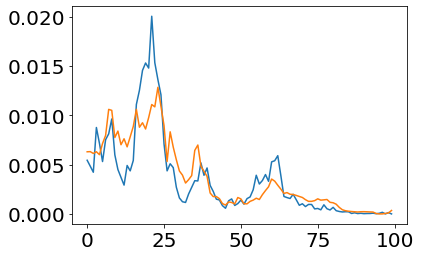

In [10]:
plt.plot(X_tests[0])
plt.plot(ReconTest[0])

In [11]:
### For real this time ###
WSFH = model_real.transform(Xs)

In [12]:
### ZH reconstruction ###
# Done once we are happy with our NMF (above) with training + test data: #

model_real_zh = NMF(n_components= 4, init='random', random_state=1)
new_scaler_zh = MinMaxScaler()
Xs_zh = sklearn.preprocessing.normalize(np.vstack((zh)),axis =1,norm = 'max')
#print(np.shape(Xs))
X_trains_zh, X_tests_zh = train_test_split(Xs_zh, test_size=0.2, random_state=1)#z_train,z_test = train_test_split(X, y, z,test_size=0.2, random_state=1)
#print(np.shape(X_trains))
X_trains_zh, X_vals_zh  = train_test_split(X_trains_zh,test_size=0.25, random_state=1)#z_train,z_val= train_test_split(X_train, y_train,z_train,test_size=0.25, random_state=1)
#print(np.shape(X_trains))
W_zh = model_real_zh.fit_transform(X_trains_zh)
    #print(np.shape(H),i)
H_zh = model_real_zh.components_
#print(np.shape(W))

ReconData_zh = model_real_zh.inverse_transform(W_zh)
ReconTest_zh = model_real_zh.inverse_transform(model_real_zh.transform(X_tests_zh))

In [13]:
### For real this time ###
WZH = model_real_zh.transform(Xs_zh)


(10028, 100)
(7521, 100)
4028
(7521, 100)


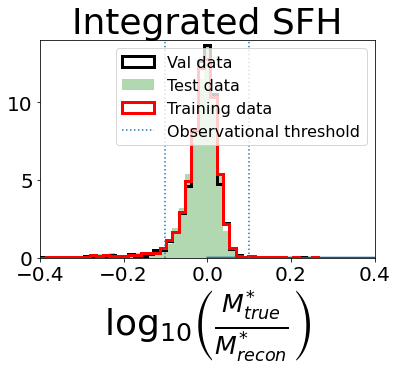

In [14]:
def mass_comp(X_test,X_recon,scaler):
    m_true = np.zeros(X_test.shape[0])
    m_recon = np.zeros(X_recon.shape[0])
    #for i in range(X_test.shape[0]):
    m_true = np.sum(scaler.inverse_transform(X_test),axis = 1)
    m_recon = np.sum(scaler.inverse_transform(X_recon),axis = 1)
    
    return m_true,m_recon
from textwrap import wrap
#wrapped = ['Validation data','Test data','Training data']
wrapped='Observational threshold'#: %i/%i validation galaxies exceed'%(\
       #                                                                         np.shape(np.log10(mtv/mrv)[abs(np.log10(mtv/mrv))>0.1])[0],(mtv.shape[0]))
#wrapped

comps = 4
from sklearn.decomposition import NMF
from sklearn.preprocessing import normalize,MinMaxScaler,RobustScaler,StandardScaler,MaxAbsScaler
model = NMF(n_components= comps, init='random', random_state=0)
new_scaler = MinMaxScaler()

X = new_scaler.fit_transform(np.vstack((sfh)))

plt.plot(X[0])

# train -test - validation split
X_train, X_test = train_test_split(X, test_size=0.2, random_state=1)
print(np.shape(X_train))

X_train, X_val  = train_test_split(X_train,test_size=0.25, random_state=1)

print(np.shape(X_train))

#NMF decomposition
W = model.fit_transform(X_train) # build model with training data / populate weight arrays
H = model.components_ # load its components

WT = model.transform(X_test) # transformed test data


Xtrecon = model.inverse_transform(W) # Reconstructing the SFH from training data


Xtestrecon= model.inverse_transform(WT)
# Building a model: nomralize and fit SFH

idx = np.random.randint(0,np.size(X_train[:,0]))
print(idx)
print(np.shape(X_train))


mt,mr = mass_comp(X_test,Xtestrecon,new_scaler)
mtt,mrt = mass_comp(X_train,Xtrecon,new_scaler)
mtv,mrv = mass_comp(X_val,model.inverse_transform(model.transform(X_val)),new_scaler)
plt.figure(1,figsize =(16,12))
plt.title('Integrated SFH',fontsize =36)
plt.xlabel('$\\log_{10}\\left(\\frac{M^{*}_{true}}{M^{*}_{recon}}\\right)$',fontsize= 36)
plt.hist(np.log10(mtv/mrv),bins = np.linspace(-0.75,0.75,100),density=True,histtype='step',color='black',label = 'Val data',linewidth = 3)
plt.hist(np.log10(mt/mr),bins = np.linspace(-0.75,0.75,100),density=True,color='green',label = 'Test data',alpha =0.3)
plt.hist(np.log10(mtt/mrt),bins = np.linspace(-0.75,0.75,100),histtype='step',color='red',density=True,label = 'Training data',linewidth = 3)
plt.vlines(x =0.1,ymin=0,ymax= 15,linestyle ='dotted',label=wrapped)
plt.vlines(x =-0.1,ymin=0,ymax= 15,linestyle ='dotted')
leg = plt.legend(fontsize= 16)
plt.xlim(-0.4,0.4)
plt.ylim(0,14)
plt.savefig("integrated.png")


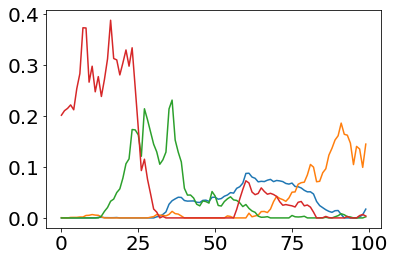

In [15]:
plt.plot(H[0,:])
plt.plot(H[1,:])
plt.plot(H[2,:])
plt.plot(H[3,:])
plt.show()


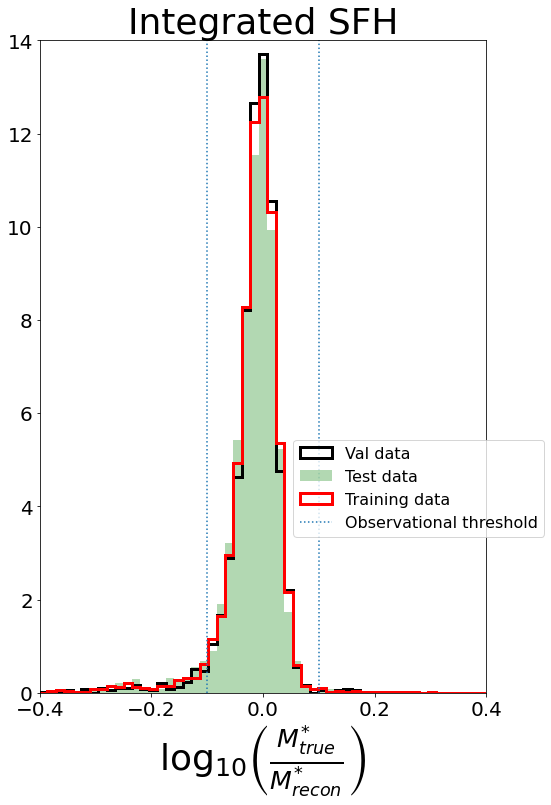

In [16]:
plt.figure(1,figsize =(8,12))
plt.title('Integrated SFH',fontsize =36)
plt.xlabel('$\\log_{10}\\left(\\frac{M^{*}_{true}}{M^{*}_{recon}}\\right)$',fontsize= 36)
plt.hist(np.log10(mtv/mrv),bins = np.linspace(-0.75,0.75,100),density=True,histtype='step',color='black',label = 'Val data',linewidth = 3)
plt.hist(np.log10(mt/mr),bins = np.linspace(-0.75,0.75,100),density=True,color='green',label = 'Test data',alpha =0.3)
plt.hist(np.log10(mtt/mrt),bins = np.linspace(-0.75,0.75,100),histtype='step',color='red',density=True,label = 'Training data',linewidth = 3)
plt.vlines(x =0.1,ymin=0,ymax= 15,linestyle ='dotted',label=wrapped)
plt.vlines(x =-0.1,ymin=0,ymax= 15,linestyle ='dotted')
leg = plt.legend(fontsize= 16,bbox_to_anchor=(0.55, 0., 0.4, 0.4))
plt.xlim(-0.4,0.4)
plt.ylim(0,14)
plt.savefig("Integrated.png")


In [17]:
WSFH

array([[1.68097898e+01, 1.29382619e+00, 0.00000000e+00, 2.51598810e+00],
       [3.11843889e+00, 0.00000000e+00, 2.53816652e-01, 3.15141159e-01],
       [2.90597157e-01, 2.09769080e+00, 4.95946246e-01, 1.00934116e+00],
       ...,
       [3.86259397e-02, 2.67457442e-03, 0.00000000e+00, 0.00000000e+00],
       [2.55068106e-02, 5.98977404e-04, 8.88623358e-05, 6.22856922e-04],
       [2.41626456e-02, 0.00000000e+00, 0.00000000e+00, 6.39693836e-04]])

### CLUSTERING ###

In [18]:
from project_tools.plotting import *
sample =MinMaxScaler()

In [19]:
labels3full = np.ones(12535)

In [20]:
colour_sample_1 = comparison_plots(3,logMs,np.column_stack((U-G,G-R,R-I)),labels3full,11,10,"3 colour clustering (U-G,G-R,R-I)")
nmf_sample = comparison_plots(3,logMs,np.column_stack((WSFH,WZH)),labels3full,11,10,"NMF clustering (3 clusters)")
NMF_color = comparison_plots(3,logMs,np.column_stack((WZH,WSFH,U-G,G-R,R-I)),labels3full,11,10,"NMF+colour clustering (3 clusters)")
colour_sample_2 = comparison_plots(4,logMs,np.column_stack((U-G,G-R,R-I)),labels3full,11,10,"3 colour clustering (U-G,G-R,R-I)")
nmf_sample_4 = comparison_plots(4,logMs,np.column_stack((WSFH,WZH)),labels3full,11,10,"NMF clustering (4 clusters)")
NMF_color_4 = comparison_plots(4,logMs,np.column_stack((WZH,WSFH,U-G,G-R,R-I)),labels3full,11,10,"NMF+colour clustering (4 clusters)")

[[1.0248394  0.35776329 0.23431969]
 [1.05194473 0.41767693 0.26467323]
 [1.17240334 0.47620392 0.27728653]
 ...
 [0.87874222 0.19705582 0.17566109]
 [1.31242561 0.53876305 0.30278778]
 [1.05221748 0.37331772 0.22535324]] train data
[[0.89993684 0.93013256 0.93248845]
 [0.82131501 0.87259911 0.88051687]
 [0.76801177 0.84758434 0.86696486]
 ...
 [0.76530292 0.83716529 0.82353904]
 [0.76169784 0.83476032 0.82140563]
 [0.75423312 0.83065653 0.8167994 ]] prepped
GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=1000,
                means_init=None, n_components=3, n_init=10,
                precisions_init=None, random_state=42, reg_covar=1e-06,
                tol=0.001, verbose=0, verbose_interval=10, warm_start=False,
                weights_init=None) MODEL
[0 0 2 ... 0 0 0] LABELS
[[0.00203347 0.01923513 0.03718328 ... 0.21374022 0.36730109 0.24730268]
 [0.01081727 0.03033934 0.01169489 ... 0.09762332 0.35981075 0.1871644 ]
 [0.00498882 0.04833189 0.01374266 ... 

In [21]:
upper = 11
lower = 10


In [22]:
import warnings
def exclusion_mean(cond,zh,frac):
    zh_mean = []
    t_length = zh.shape[1]
    stop_N =int(frac*zh[cond].shape[0])
    print(stop_N,zh[cond].shape[0])
    for i in range(t_length):
        
        value = zh[:,i][cond]
        sumterm = np.sum(value)
    #print(value)
        #print(np.where(value==0)[0])
        n_zeros = np.shape(tuple(np.where(value==0)[0]))
        #print(n_zeros[0],i)
        if n_zeros[0]>=stop_N:
    #print(i,n_zeros)
            zh_mean.append(np.nan)
            #print(i)
        else:
            zh_mean.append(sumterm/(np.size(value)-n_zeros[0]))


    return np.asarray(zh_mean)

def exclusion_percentile(cond,zh,p,frac):
    zh_p = []
    t_length = zh.shape[1]
    stop_N =int(frac*zh[cond].shape[0])
    
    for i in range(t_length):
        
        value = zh[:,i][cond]
        sumterm = np.sum(value)
    #print(value)
        #print(np.where(value==0)[0])
        n_zeros = np.shape(tuple(np.where(value==0)[0]))
        safeidx =np.where(value!=0)[0]
        #print(n_zeros[0],i)
        if n_zeros[0]>=stop_N:
    #print(i,n_zeros)
            zh_p.append(np.nan)
            #print(i)
        else:
            zh_p.append(np.percentile(value[safeidx],p))#computed percetile using nan trick)


    return np.asarray(zh_p)
    

In [23]:
def plot_zh_sfh(labels,zh,sfh,delt,title,upper,lower,mode):
    
    f,ax=plt.subplots(1,2,figsize=(20,10))
    ax[0].set_title(title+"Metallicity histories",fontsize =20)
    ax[1].set_title(title+"SFH",fontsize =20)
    if mode =='A' or mode=='def':
        colors=['red','blue','green','purple']
    elif mode =='B':
        colors=['blue','red','green','purple']
    elif mode =='C':
        colors=['blue','red','green','purple']
    elif mode =='D':
        colors=['violet','red','blue','green']
    elif mode =='E':
        colors=['green','violet','blue','red']
    elif mode =='F':
        colors=['blue','red','green','violet']

    else:
        colors=['red','blue','green','purple']
    axins1 =inset_axes(ax[0], width="25%", height="25%", loc=1, borderpad=1)
    axins1.tick_params(labelleft=False, labelbottom=False)
    axins2 =inset_axes(ax[1], width="25%", height="25%", loc=2, borderpad=1)
    axins2.tick_params(labelleft=False, labelbottom=False)
    ax[0].set_xlim(0,sfht[-1])
    ax[0].set_ylabel('Mean metallicity history [$Z_{\\odot}$]',fontsize=24)
    ax[1].set_ylabel('Mean star formation history [$M_{ \\odot}/Gyr$]',fontsize=24)
    ax[0].set_xlabel('Lookback Time [Gyr]',fontsize=24)
    ax[1].set_xlabel('Lookback Time [Gyr]',fontsize=24)
    ax[1].set_xlim(0,sfht[-1])
    for i in range(np.unique(labels).shape[0]):

        cond = [(labels==i)&(logMs < upper)&(logMs >=lower)]#[(NMF_color_4 ==3)&(logMs<11)&(logMs>=10)]
        frac = 0.9
        mean = exclusion_mean(cond,zh,frac)
        upp= exclusion_percentile(cond,zh,84,frac)
        lpp =exclusion_percentile(cond,zh,16,frac)
#plt.plot(sfht,mean,lw=3,color='red')
#plt.fill_between(sfht,lower,mean,lw=2,alpha=0.2,color='red')
#plt.fill_between(sfht,mean,upper,lw=2,alpha=0.2,color='red')

       # print(zh[0])
       # print(zh[labels==i].shape)
       # print(zh[zh!=0].shape)
       # print(np.shape((zh[(labels ==i) & (zh!=0)])))
        
        #ax[0].plot(sfht,np.nanmean(zh[labels == i]\
         #              [(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower) ],axis=0)/(delt),\
        #           color=colors[i],label = 'cluster %i'%(i))
        ax[1].plot(sfht,np.mean(sfh[labels == i]\
                       [(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower) ],axis=0)/(delt),\
                   color=colors[i],label = 'cluster %i'%(i+1),lw=3,rasterized= True)
        
        
        ax[0].plot(sfht,mean,color=colors[i],label='cluster %i'%(i+1),lw=3,rasterized= True)
        ax[0].fill_between(sfht,lpp,mean,lw=2,alpha=0.2,color=colors[i],rasterized=True)
        ax[0].fill_between(sfht,mean,upp,lw=2,alpha=0.2,color=colors[i],rasterized=True)
        #mdata = np.ma.masked_where(zh[labels == i][(logMs[labels==i] < upper)  &\
         #                                          (logMs[labels==i] >=lower) ] == 0,\
        #                           zh[labels == i][(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower) ])
        #mdata = np.ma.filled(mdata, np.nan)
        #meanval= np.ma.average(mdata,axis=0,weights=zh[labels == i][(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower) ].astype(bool))/delt
        #ax[0].plot(sfht,np.ma.average(zh[labels==i][(logMs[labels==i] < upper)  &\
        #                                      (logMs[labels==i] >=lower) ], axis=0,\
        ##                   weights=zh[labels==i][(logMs[labels==i] < upper)  &\
        #                                      (logMs[labels==i] >=lower) ].astype(bool)),color=colors[i],label = 'cluster %i'%(i))
        #
        #ax[0].fill_between(sfht,np.nanpercentile(mdata,16,axis=0),np.ma.average(zh[labels==i][(logMs[labels==i] < upper)  &\
        #                                      (logMs[labels==i] >=lower) ], axis=0,\
        #                   weights=zh[labels==i][(logMs[labels==i] < upper)  &\
        #                                      (logMs[labels==i] >=lower) ].astype(bool)),color=colors[i],alpha=0.2)
        #ax[0].fill_between(sfht,np.nanpercentile(mdata,84,axis=0),np.ma.average(zh[labels==i][(logMs[labels==i] < upper)  &\
        #                                      (logMs[labels==i] >=lower) ], axis=0,\
        #                   weights=zh[labels==i][(logMs[labels==i] < upper)  &\
       #                                       (logMs[labels==i] >=lower) ].astype(bool)),color=colors[i],alpha=0.2)
        #ax[0].fill_between(sfht,np.nanpercentile(mdata,16,axis=0)/delt,meanval,color =colors[i],alpha=0.2)
        #ax[0].fill_between(sfht,np.nanpercentile(mdata,84,axis=0)/delt,meanval,color =colors[i],alpha=0.2)
        #ax[0].fill_between(sfht,np.nanpercentile(zh[labels == i]\
        #               [(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower)  ],16,axis=0)/(delt),\
        #                   np.nanpercentile(zh[labels == i]\
         #              [(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower) ],84,axis=0)/(delt),color=colors[i],alpha=0.2)
        ax[1].fill_between(sfht,np.percentile(sfh[labels == i]\
                       [(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower) ],16,axis=0)/(delt),\
                           np.percentile(sfh[labels == i]\
                       [(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower) ],84,axis=0)/(delt),color=colors[i],alpha=0.2,lw=2,rasterized=True)
        
        axins1.scatter(logMs[labels == i], (G-R)[labels==i], color =colors[i],alpha = 0.5, s=0.1, rasterized = True)
        axins2.scatter(logMs[labels == i], (G-R)[labels==i], color =colors[i],alpha = 0.5, s=0.1, rasterized = True)
    ax[0].legend(loc=2,fontsize=14) 
    ax[1].legend(loc=1,fontsize=14) 
    

    plt.savefig(mode+'.pdf',dpi=300,bbox_inches='tight',format ='pdf')
    plt.show()
    

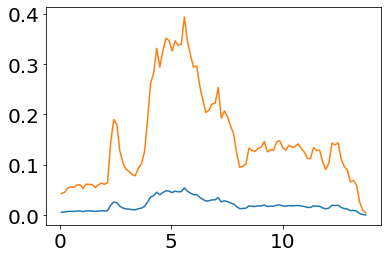

In [24]:
plt.plot(sfht,zh[colour_sample_1==0][0])
plt.plot(sfht,zh[colour_sample_1==0][0]/np.diff(sfht)[0])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

1661 1846
1913 2126
1656 1841


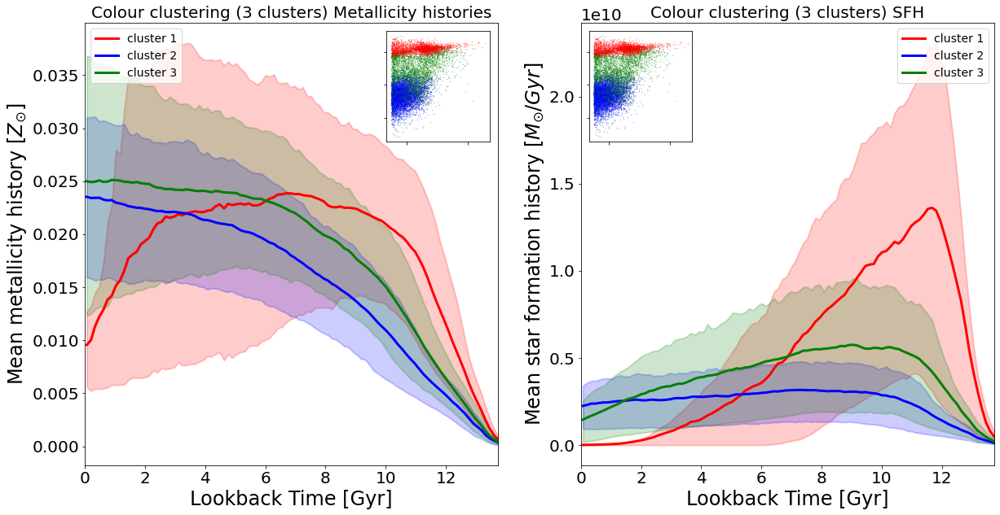

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

941 1046
3073 3415
1216 1352


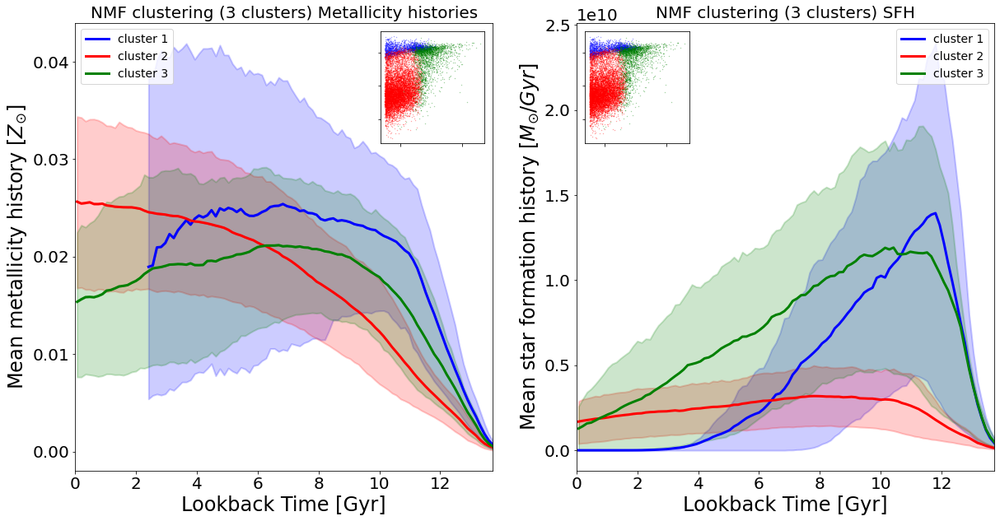

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

2983 3315
1317 1464
930 1034


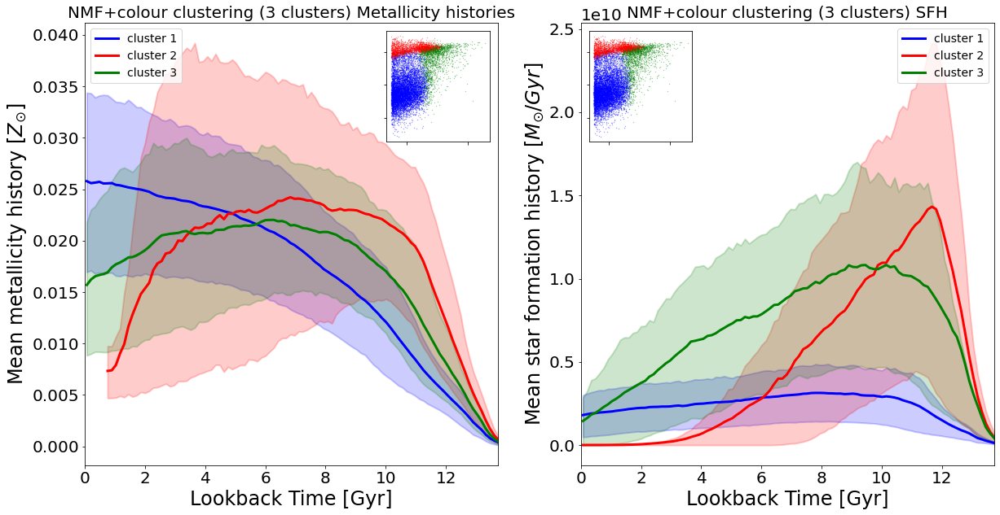

In [25]:
plot_zh_sfh(colour_sample_1,zh,sfh,np.diff(sfht)[0],'Colour clustering (3 clusters) ',upper,lower,'A')
plot_zh_sfh(nmf_sample,zh,sfh,np.diff(sfht)[0],'NMF clustering (3 clusters) ',upper,lower,'B')
plot_zh_sfh(NMF_color,zh,sfh,np.diff(sfht)[0],'NMF+colour clustering (3 clusters) ',upper,lower,'C')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

203 226
1505 1673
2575 2862
946 1052


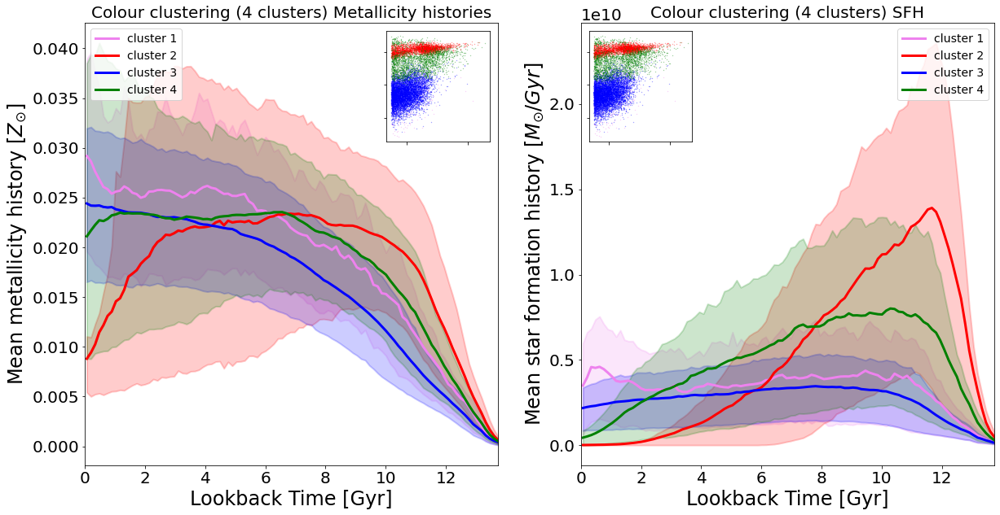

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

1845 2050
819 910
223 248
2344 2605


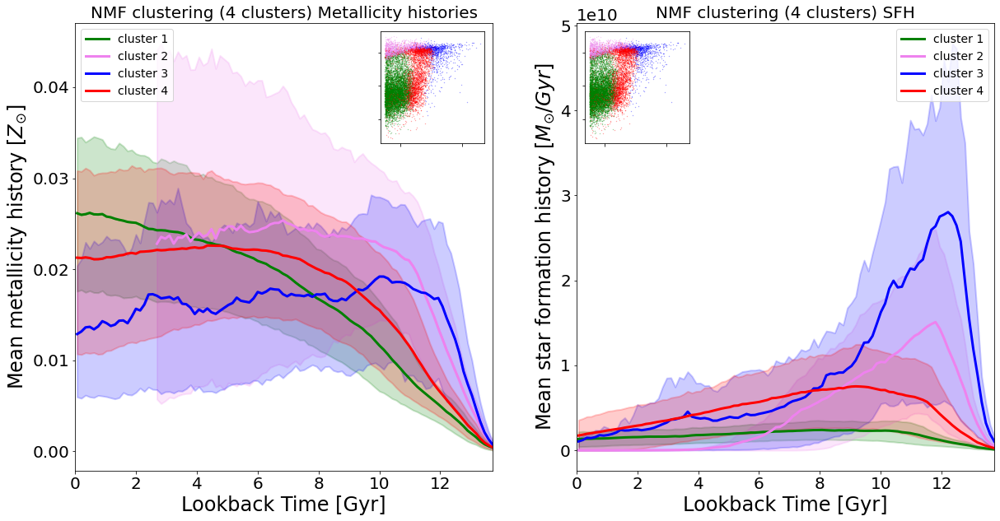

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

1599 1777
1227 1364
2108 2343
296 329


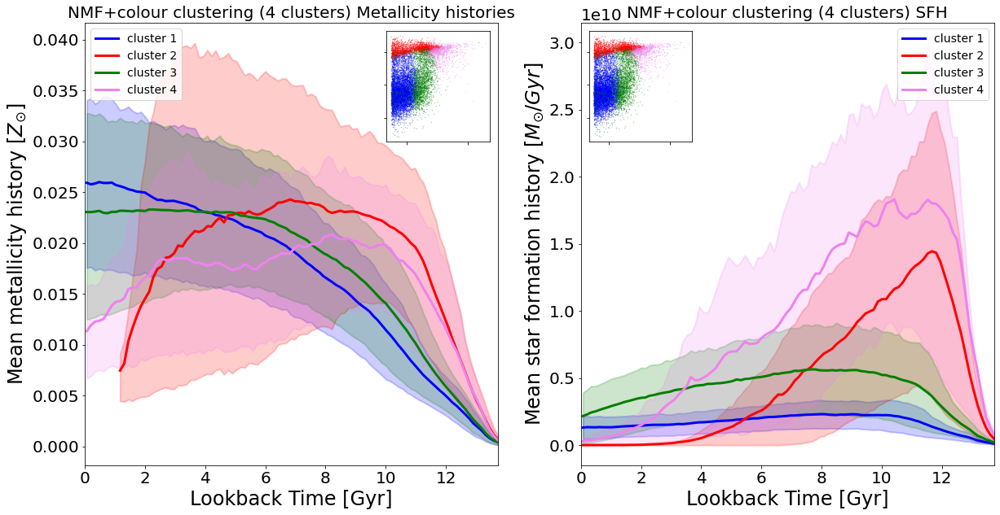

In [26]:
plot_zh_sfh(colour_sample_2,zh,sfh,np.diff(sfht)[0],'Colour clustering (4 clusters) ',upper,lower,'D')
plot_zh_sfh(nmf_sample_4,zh,sfh,np.diff(sfht)[0],'NMF clustering (4 clusters) ',upper,lower,'E')
plot_zh_sfh(NMF_color_4,zh,sfh,np.diff(sfht)[0],'NMF+colour clustering (4 clusters) ',upper,lower,'F')

In [27]:
# Storing the mass assembly quantities 
MassStuff= h5py.File("MassAssemblyStuff.hdf5","r")
MassStuff.keys()
MWage=MassStuff['tMass'][()]
Masses = MassStuff['MAH'][()]
MeansM = MassStuff['AssemblyH'][()]

In [28]:
def MAH_plot(labels,upper,lower,case):
    if case =='A' or case=='def':
        colors=['red','blue','green','purple']
    elif case =='B':
        colors=['blue','red','green','purple']
    elif case =='C':
        colors=['blue','green','red','purple']
    elif case =='D':
        colors=['violet','red','blue','green']
    elif case =='E':
        colors=['green','violet','blue','red']
    elif case =='F':
        colors=['blue','red','green','violet']
    fig,ax =plt.subplots(2,1,figsize=(15,20),sharex=True)
    n_CLUST = np.unique(labels).shape[0]
    plt.suptitle('Case '+str(case)+': Mean halo mass assembly histories for $%.2f \\leq logM_{*} \\leq %.2f  $'%(lower,upper),\
                fontsize = 26)
    ax[0].set_title('Centrals',fontsize=24)
    ax[1].set_title('Satellites',fontsize=24)
    for i in range(0,n_CLUST):
        ax[0].plot(sfht,1/(0.137999)*np.mean(Masses[centralMask][(labels[centralMask]==i) &(logMs[centralMask]<upper)&\
                                                (logMs[centralMask]>=lower)],axis=0),color=colors[i],lw= 3,label='cluster %i mean'%(i+1),rasterized=True)
        ax[0].fill_between(sfht,1/(0.137999)*np.percentile(Masses[centralMask][(labels[centralMask]==i)&\
                                                                  (logMs[centralMask]<upper)&\
                                                                  (logMs[centralMask]>=lower)],16,axis=0),\
                1/(0.137999)*np.percentile(Masses[centralMask][(labels[centralMask]==i)&(logMs[centralMask]<upper)&\
                                                  (logMs[centralMask]>=lower)],84,axis=0),alpha=0.2,lw= 3,color=colors[i],rasterized=True)

        ax[1].plot(sfht,1/(0.137999)*np.mean(Masses[satMask][(labels[satMask]==i) &(logMs[satMask]<upper)&\
                                                (logMs[satMask]>=lower)],axis=0),color=colors[i],lw = 3,label='cluster %i mean'%(i+1),rasterized=True)
        ax[1].fill_between(sfht,1/(0.137999)*np.percentile(Masses[satMask][(labels[satMask]==i)&\
                                                              (logMs[satMask]<upper)&(logMs[satMask]>=lower)],\
                                              16,axis=0),\
                1/(0.137999)*np.percentile(Masses[satMask][(labels[satMask]==i)&(logMs[satMask]<upper)&\
                                              (logMs[satMask]>=lower)],84,axis=0),alpha=0.2,lw = 3,color=colors[i],rasterized=True)
    
    ax[0].legend(fontsize =16)
    ax[1].legend(fontsize =16)
    ax[1].set_xlabel('Lookback time [Gyr]',fontsize=20)
    ax[0].set_ylabel('Mass Assembly History [$M_{\\odot}/Gyr$] + 84/16th percentiles',fontsize=20)
    ax[1].set_ylabel('Mass Assembly History [$M_{\\odot}/Gyr$] + 84/16th percentiles',fontsize=20)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig('MAHcase'+str(case)+'.pdf',dpi=300,format='pdf')

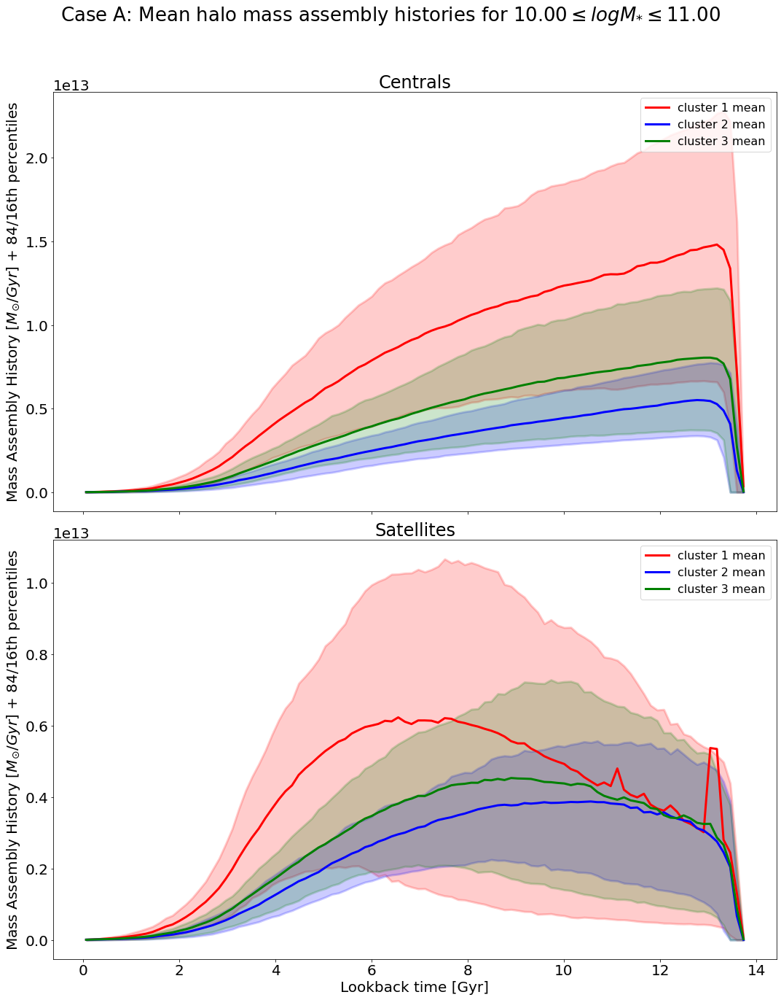

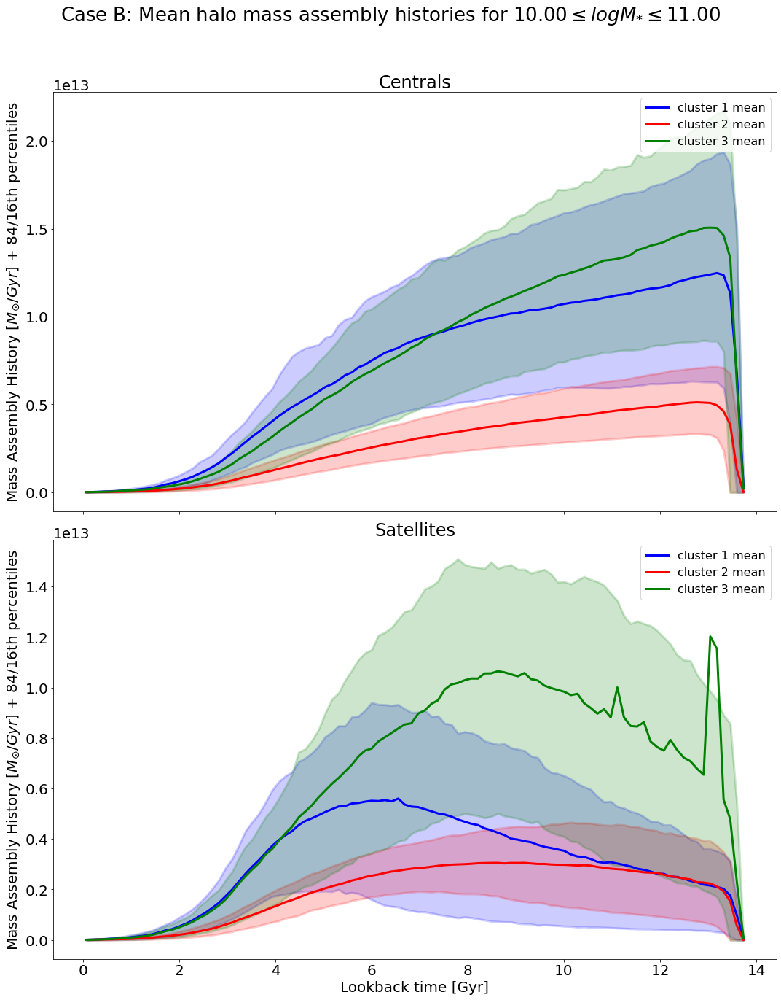

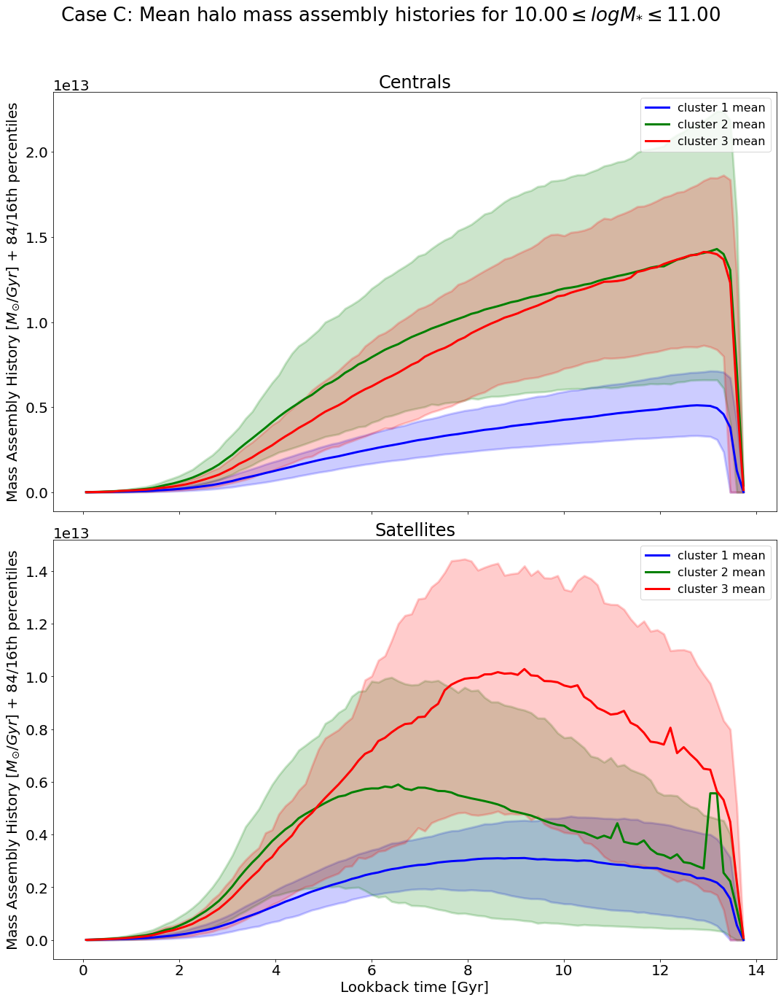

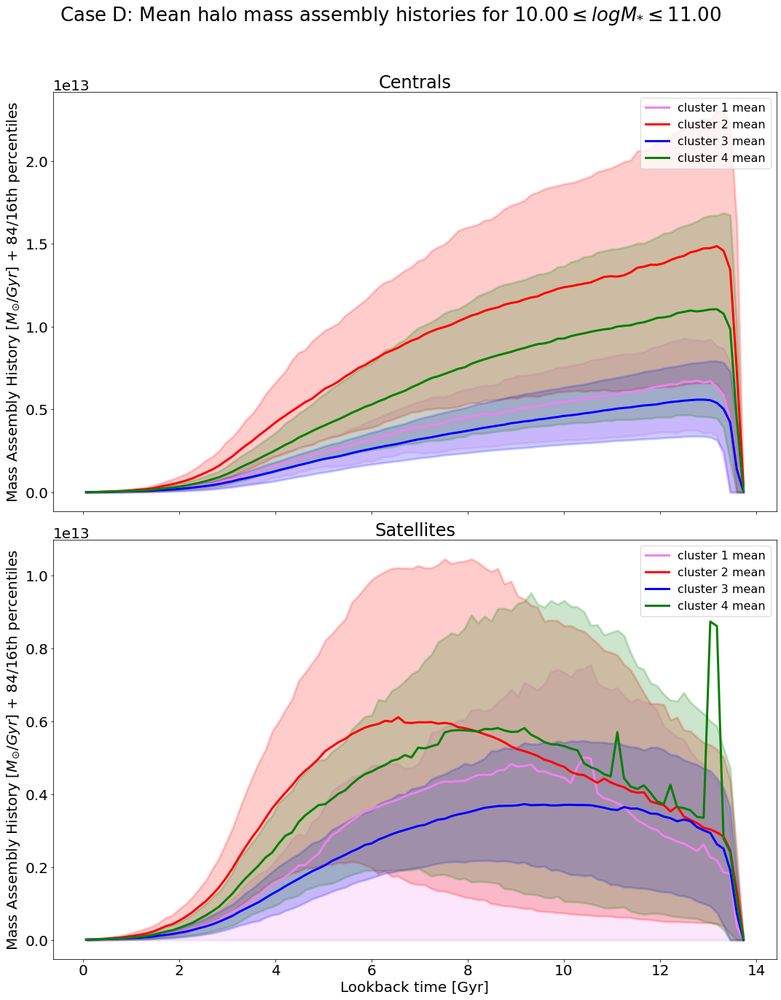

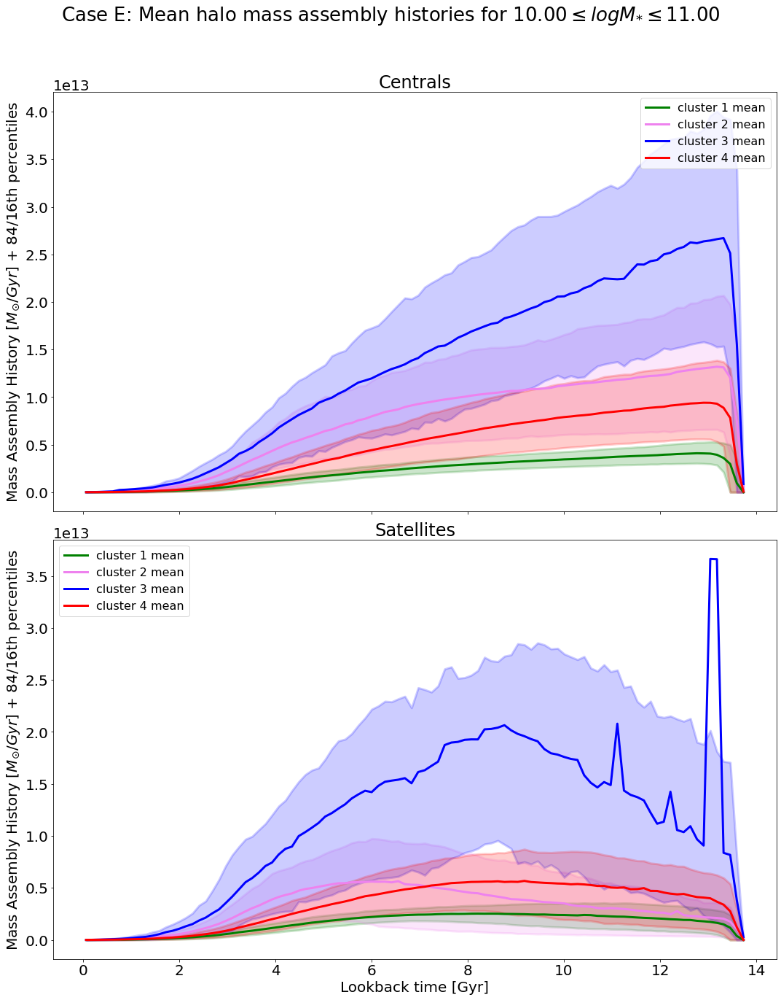

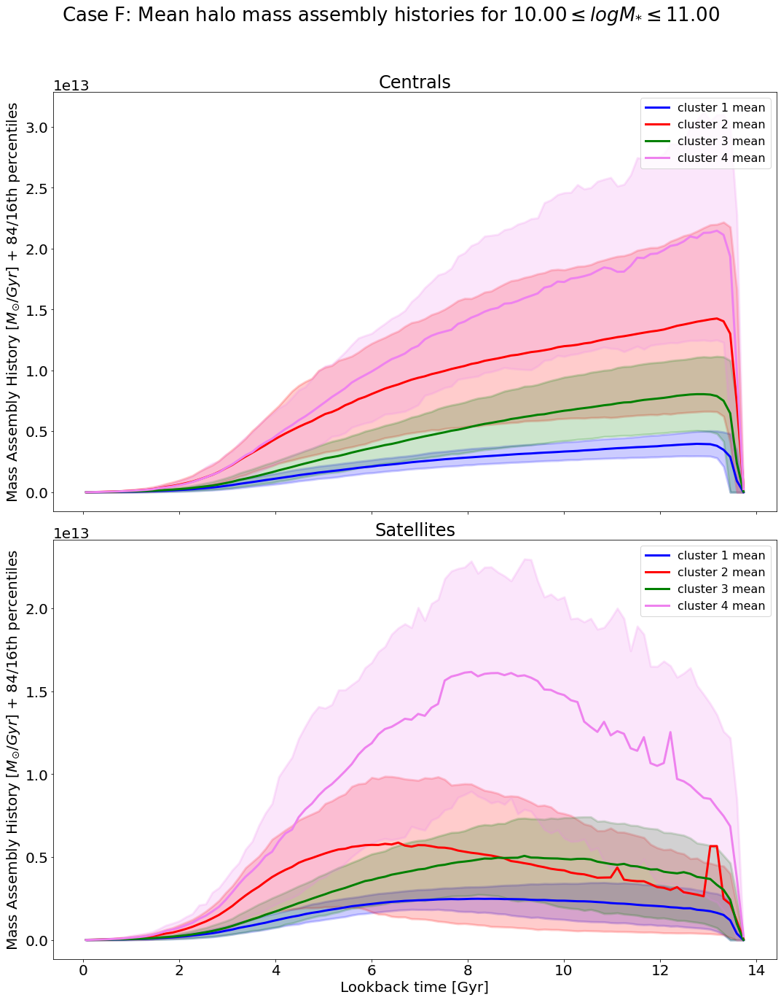

In [29]:
MAH_plot(colour_sample_1,11,10,'A')
MAH_plot(nmf_sample,11,10,'B')
MAH_plot(NMF_color,11,10,'C')
MAH_plot(colour_sample_2,11,10,'D')
MAH_plot(nmf_sample_4,11,10,'E')
MAH_plot(NMF_color_4,11,10,'F')

In [30]:
def fM_plot(labels,case,upper,lower):
    num_clusters = np.unique(labels).shape[0]
    f,axes = plt.subplots(num_clusters,2, figsize=(15,7*num_clusters))
    labels_central, labels_sat = labels[(crossrefID[H2idx] == 1)[:,0]],\
        labels[(crossrefID[H2idx] !=1)[:,0]]
    if case =='A' or case=='def':
        colors=['red','blue','green','purple']
    elif case =='B':
        colors=['blue','red','green','purple']
    elif case =='C':
        colors=['blue','red','green','purple']
    elif case =='D':
        colors=['violet','red','blue','green']
    elif case =='E':
        colors=['green','violet','blue','red']
    elif case =='F':
        colors=['blue','red','green','violet']

    #axes[i,0].set_ylabel('Counts ', fontsize = 20)
    axes[0,0].set_title('Ex-situ mass fraction from mergers case: '+str(case),fontsize=20)
    axes[0,1].set_title('Ex-situ mass fraction from flybys case: '+str(case),fontsize=20)
    for i in range(num_clusters):

            n,a,_ = axes[i,0].hist(np.log10(fM[(fM>0)&(labels==i)&\
                                                 (logMs<upper) & (logMs>=lower)]),\
                          histtype = 'step',bins = np.linspace(-5,0,50),\
                           color =colors[i],density= False,lw =2, label = ' cluster %i '%(i+1),rasterized=True)

# Group 0
            #axs[0,i].set_title('Group 0: total vs sats',fontsize = 16)
            axes[i,0].set_xlabel('Log(Merger Mass Fraction)', fontsize = 20)
            axes[i,0].set_ylabel('Number of galaxies ', fontsize = 20)
            axes[i,1].set_ylabel('Number of galaxies ', fontsize = 20)
            axes[i,0].hist(np.log10(fM[satMask][(labels[satMask]==i) &(fM[satMask]>0)&\
                                               (logMs[satMask]<upper)&(logMs[satMask]>=lower)]),\
                           bins = np.linspace(-5,0,50),\
                           color =colors[i],density= False,lw =2, label = ' cluster %i satellites' %(i+1),rasterized=True)
            med_val = np.median(np.log10(fM[centralMask][(fM[centralMask]>0)&(labels[centralMask]==i)&\
                                                 (logMs[centralMask]<upper) & (logMs[centralMask]>=lower)]))
            med_val_sat = np.median(np.log10(fM[satMask][(labels[satMask]==i) &(fM[satMask]>0)&\
                                               (logMs[satMask]<upper)&(logMs[satMask]>=lower)]))
            axes[i,0].vlines(x= med_val,ymin=0,ymax = np.max(n)*1.2,lw =2,label = 'central median %.2f'%(med_val),rasterized=True)
            axes[i,0].vlines(x= med_val_sat,ymin=0,ymax = np.max(n)*1.2,lw =2,linestyle ='dashed',label = 'satellite median %.2f'%(med_val_sat),rasterized=True)
            
            m,_,_ = axes[i,1].hist(np.log10(fStripped[(labels==i)&(fStripped>0)&(logMs<upper)&(logMs>=lower)]),\
                            histtype = 'step',bins = np.linspace(-5,0,50),\
                            color =colors[i],density= False,lw =2, label = ' cluster %i '%(i+1),rasterized=True)

# Group 0
            #axs[0,i].set_title('Group 0: total vs sats',fontsize = 16)
            axes[i,0].set_ylim(0,np.max(n)*1.2)
            axes[i,1].set_xlabel('Log(Flyby Mass Fraction)', fontsize = 20)
            axes[i,1].hist(np.log10(fStripped[satMask][(labels[satMask]==i) &(fStripped[satMask]>0)&\
                                                      (logMs[satMask]<upper)&(logMs[satMask]>=lower)]),\
                           
                           lw =2,bins = np.linspace(-5,0,50),\
         color =colors[i],density= False, label = ' cluster %i satellites' %(i+1),rasterized=True)
            med_valf = np.median(np.log10(fStripped[centralMask][(fStripped[centralMask]>0)&(labels[centralMask]==i)&\
                                                 (logMs[centralMask]<upper) & (logMs[centralMask]>=lower)]))
            med_val_satf = np.median(np.log10(fStripped[satMask][(labels[satMask]==i) &(fStripped[satMask]>0)&\
                                               (logMs[satMask]<upper)&(logMs[satMask]>=lower)]))
            axes[i,1].vlines(x= med_valf,ymin=0,ymax = np.max(m)*1.2,lw =2,label = 'central median %.2f'%(med_valf))
            axes[i,1].vlines(x= med_val_satf,ymin=0,ymax = np.max(m)*1.2,lw =2,linestyle ='dashed',label = 'satellite median %.2f'%(med_val_satf),rasterized=True)
            axes[i,1].set_ylim(0,np.max(m)*1.2)
            
            #axes[0,i].hist(np.log10(fM[satMask][original_labels_sat==i]\
         #[(fM[satMask][original_labels_sat==i]>0)]),bins = np.linspace(-5,0,50),\
            axins =inset_axes(axes[i,0], width="30%", height="30%", loc=6, borderpad=1)
            axins.tick_params(labelleft=False, labelbottom=False)
#plt.tight_layout()
            axins.scatter(logMs[(labels != i)], (G-R)[labels!=i], color ='black',alpha = 0.2, s=0.1,rasterized=True)
            axins.scatter(logMs[(labels == i)&(fM>0)],\
                          (G-R)[(labels==i)&(fM>0)], color =colors[i], s=0.1, alpha = 0.5,rasterized=True)        
            axes[i,0].legend( fontsize = 14,loc =2)
            axes[i,1].legend( fontsize = 14,loc =2)
            #axes[i,0].set_ylabel('Counts', fontsize = 20)
            
    plt.savefig('case'+str(case)+'fMplot.pdf',dpi=250,format ='pdf')
    plt.show()

In [31]:
# Now computing in/ex-situ mass fractions
presentINSITU = stara['Snapshot_99']['StellarMassInSitu'][()]*10**10 / h # per IllustrisTNG, units need scaling
presentCMerger =stara['Snapshot_99']['StellarMassFromCompletedMergers'][()]*10**10 / h
presentMerger = stara['Snapshot_99']['StellarMassFromOngoingMergers'][()]*10**10 / h
presentFlyby  = stara['Snapshot_99']['StellarMassFromFlybys'][()]*10**10 / h
presentExOutGal= stara['Snapshot_99']['StellarMassFormedOutsideGalaxies'][()]*10**10 / h

total = (presentINSITU + presentCMerger+presentMerger+presentFlyby+presentExOutGal)[intIDs] # selecting galaxies...
# computing fractions
fInSit = presentINSITU[intIDs]/total
fStripped = (presentMerger[intIDs]+presentFlyby[intIDs])/total
fOutGal = presentExOutGal[intIDs]/total
fM = presentCMerger[intIDs]/total

In [32]:
import matplotlib
matplotlib.rc('xtick', labelsize=23) 
matplotlib.rc('ytick', labelsize=23)

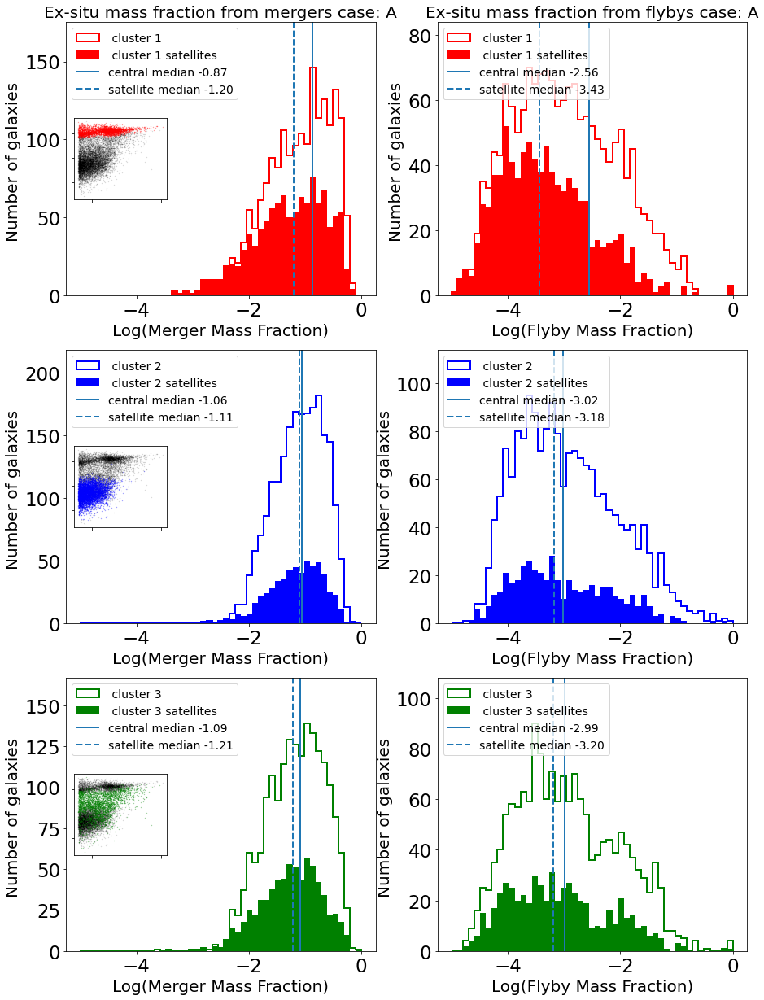

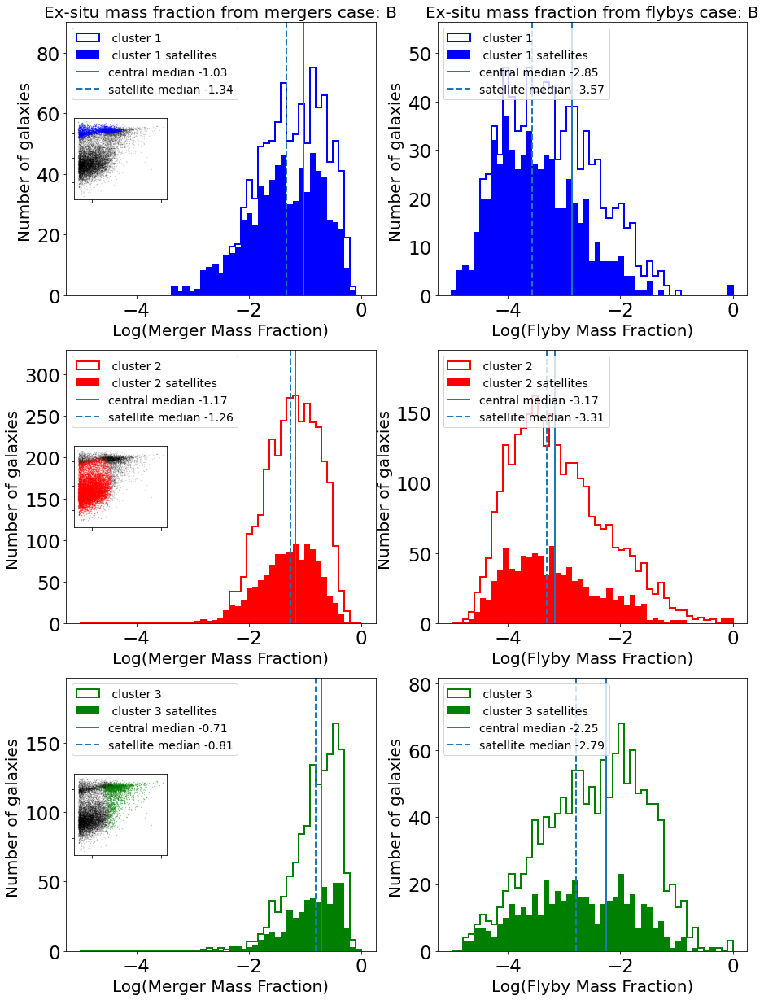

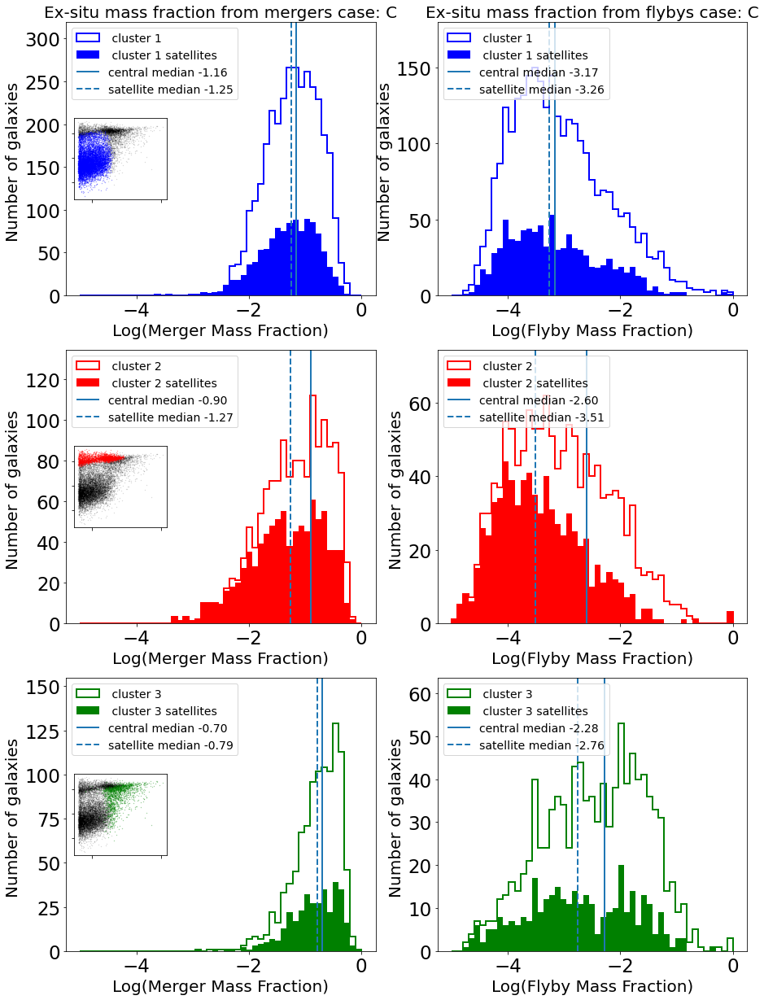

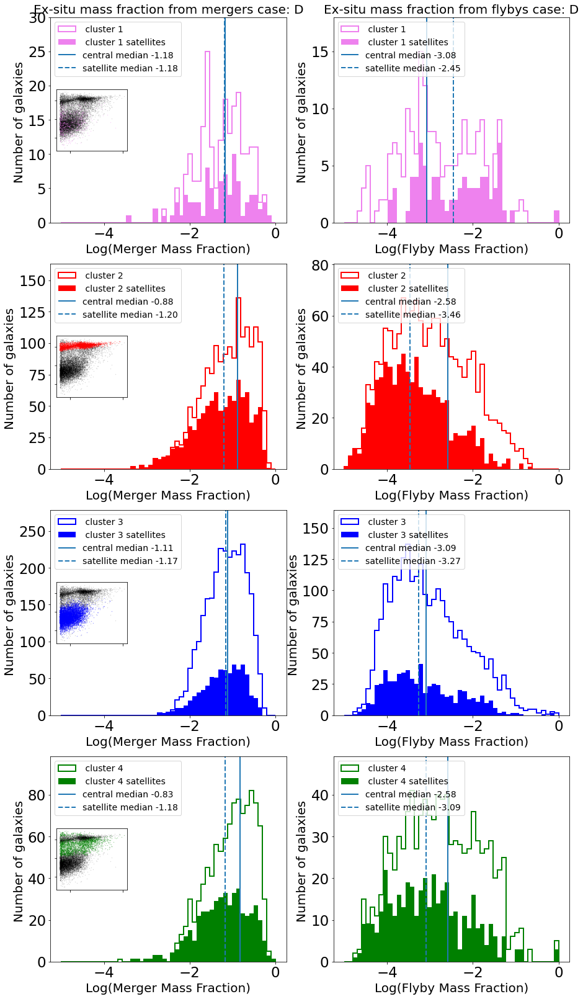

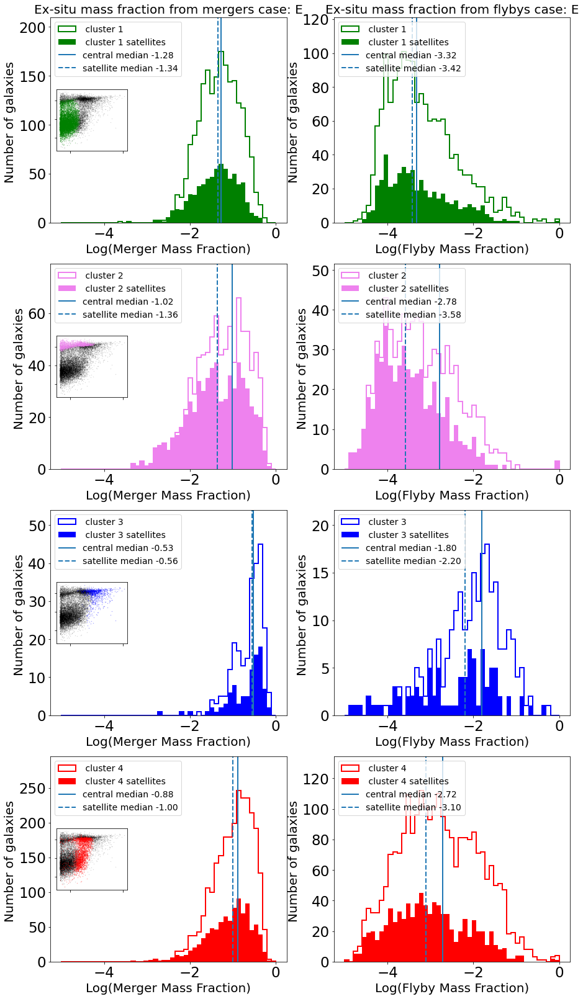

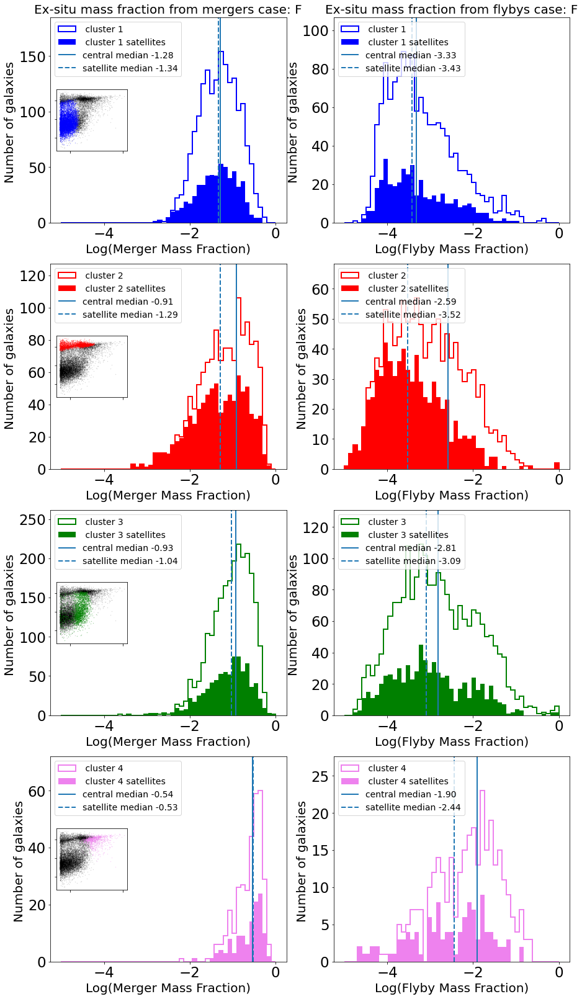

In [33]:
fM_plot(colour_sample_1,'A',11,10)
fM_plot(nmf_sample,'B',11,10)
fM_plot(NMF_color,'C',11,10)
fM_plot(colour_sample_2,'D',11,10)
fM_plot(nmf_sample_4,'E',11,10)
fM_plot(NMF_color_4,'F',11,10)

In [34]:
from scipy.signal import savgol_filter

In [35]:
x_interp = np.arange(0,13.8,0.4)

In [36]:
x_interp

array([ 0. ,  0.4,  0.8,  1.2,  1.6,  2. ,  2.4,  2.8,  3.2,  3.6,  4. ,
        4.4,  4.8,  5.2,  5.6,  6. ,  6.4,  6.8,  7.2,  7.6,  8. ,  8.4,
        8.8,  9.2,  9.6, 10. , 10.4, 10.8, 11.2, 11.6, 12. , 12.4, 12.8,
       13.2, 13.6])

In [37]:
y_interp= np.interp(x_interp,sfht,sfh[0])

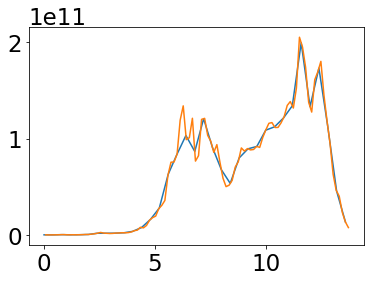

In [38]:
plt.plot(x_interp,y_interp)
plt.plot(sfht,sfh[0])

In [39]:
pip install scipy --upgrade

Requirement already up-to-date: scipy in /opt/anaconda3/lib/python3.7/site-packages (1.7.3)
Note: you may need to restart the kernel to use updated packages.


In [40]:
import scipy
from scipy import interpolate
from scipy.interpolate import *

In [41]:
s =InterpolatedUnivariateSpline(sfht, sfh[0])

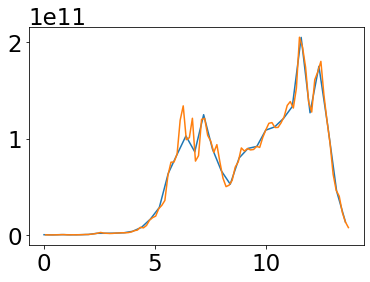

In [42]:
plt.plot(np.arange(0,13.8,0.4),s(np.arange(0,13.8,0.4)))
plt.plot(sfht,sfh[0])

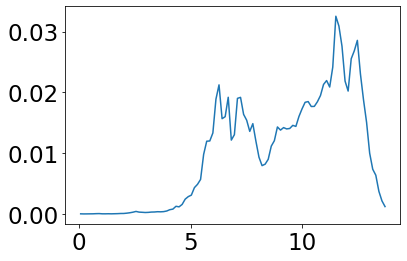

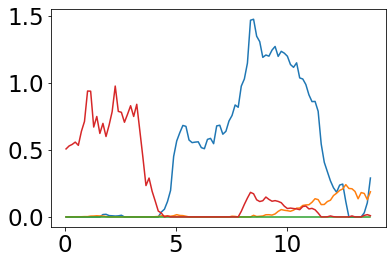

In [43]:
plt.plot(sfht,sfh[0]/np.sum(sfh[0]))
plt.show()
plt.plot(sfht,H[0,:]*WSFH[0,0])
plt.plot(sfht,H[1,:]*WSFH[0,1])
plt.plot(sfht,H[2,:]*WSFH[0,2])
plt.plot(sfht,H[3,:]*WSFH[0,3])

In [44]:
sfht[-1]

13.7310005

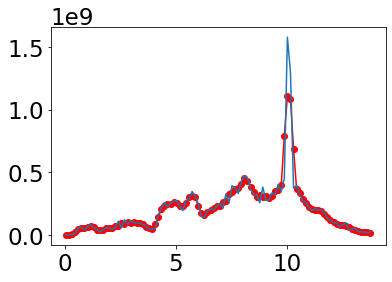

In [45]:
kernel_size = 3 # good choice for this? how did Rita implement?
kernel = np.ones(kernel_size) / kernel_size
smoothsfh = np.convolve(sfh[100], kernel, mode='same')
plt.plot(sfht,smoothsfh,'r-o')
plt.plot(sfht,sfh[100])
# how does this 

In [46]:
smoothcomp1 = np.convolve(H[0,:], kernel, mode='same')
smoothcomp2 = np.convolve(H[1,:], kernel, mode='same')
smoothcomp3 = np.convolve(H[2,:], kernel, mode='same')
smoothcomp4 = np.convolve(H[3,:], kernel, mode='same')

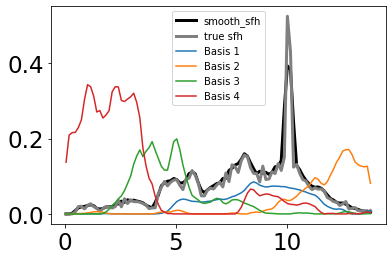

In [47]:
plt.plot(sfht,smoothsfh/np.linalg.norm(smoothsfh),label='smooth_sfh',color='black',lw=3)
plt.plot(sfht,sfh[100]/np.linalg.norm(sfh[100]),label='true sfh',color='grey',lw=3)
plt.plot(sfht,smoothcomp1,label='Basis 1')
plt.plot(sfht,smoothcomp2,label='Basis 2')
plt.plot(sfht,smoothcomp3,label='Basis 3')
plt.plot(sfht,smoothcomp4,label='Basis 4')
plt.legend()
plt.show()


In [48]:
zh.shape

(12535, 100)

In [49]:
-1*(sfht[0]-sfht[1])*3*1000

413.9970000000001

In [50]:
# generate smoothed sfh:
kernel_size = 3 # good choice for this? how did Rita implement?
kernel = np.ones(kernel_size) / kernel_size
smooth_sfh =np.zeros((12535,100))
smooth_zh = np.zeros((12535,100))
for i in range(12535):
    smooth_sfh[i,:] = np.convolve(sfh[i], kernel, mode='same')
    smooth_zh[i,:] = np.convolve(zh[i], kernel, mode='same')
    

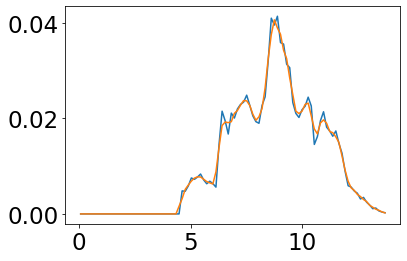

In [51]:
plt.plot(sfht,zh[1234])
plt.plot(sfht,smooth_zh[1234])

In [52]:
#Once confirmed, then run clustering here...

In [53]:
def cluster_pops(num_clusters, input_data):

    scaler_comp = MinMaxScaler()

#Indices are used for variables external to the clustering
# The idea here is if we cluster without halo mass, but want to access only the test data
# Indices, which splits into idx1,idx2,idx3 for train,test,val (respectively) selects the appropriate entry
    indices_comp = np.arange(0,np.size(logMs))


### TRAIN-TEST-VAL SPLITS ###

    train_dat_comp,test_dat_comp,idx1_comp,idx2_comp = train_test_split(input_data, indices_comp,test_size=0.2, random_state=1)
    train_dat_comp,val_dat_comp,idx1_comp,idx3_comp = train_test_split(train_dat_comp,idx1_comp,test_size=0.25, random_state=1)


# Always normalize data after splitting
    train_data_comp = scaler_comp.fit_transform(train_dat_comp)
    test_data_comp = scaler_comp.transform(test_dat_comp)
    val_data_comp = scaler_comp.transform(val_dat_comp)
    data_comp = scaler_comp.transform(input_data)
    GMM_comp = GaussianMixture(num_clusters, covariance_type = 'full', random_state = 42, n_init = 10, max_iter =1000)
    GMM_comp.fit(train_data_comp)
    labels_comp = GMM_comp.predict(data_comp)
    
    
    return labels_comp

In [54]:
input_nosmooth = cluster_pops(3,np.column_stack((WSFH,WZH)))



In [55]:
# now generate NMF for smooth data...


In [56]:
# generate smoothed sfh:
kernel_size = 3 # good choice for this? how did Rita implement?
kernel = np.ones(kernel_size) / kernel_size
smooth_sfh =np.zeros((12535,100))
smooth_zh = np.zeros((12535,100))
for i in range(12535):
    smooth_sfh[i,:] = np.convolve(sfh[i], kernel, mode='same')
    smooth_zh[i,:] = np.convolve(zh[i], kernel, mode='same')
    



In [57]:
integratedSFH = np.sum(smooth_sfh,axis =1)
integratedSFH.shape

intNORMSFH = np.zeros((12535,100))
for i in range(12535):
    intNORMSFH[i,:] = smooth_sfh[i]/integratedSFH[i]

In [58]:
np.vstack((smooth_sfh)).shape

(12535, 100)

In [59]:
### SFH reconstruction ###
# Done once we are happy with our NMF (above) with training + test data: #

model_real = NMF(n_components= 4, init='random', random_state=1)
newer_scaler = MaxAbsScaler()
XsScaled =sklearn.preprocessing.maxabs_scale(np.vstack((smooth_sfh)),axis=1)
Xs = sklearn.preprocessing.normalize(np.vstack((smooth_sfh)),axis=1,norm='max') #new_scaler.fit_transform(np.vstack((smooth_sfh))) #intNORMSFH#sklearn.preprocessing.normalize(np.vstack((smooth_sfh)),axis=1,norm='max')
#print(np.shape(Xs))
X_trains, X_tests = train_test_split(Xs, test_size=0.2, random_state=1)#z_train,z_test = train_test_split(X, y, z,test_size=0.2, random_state=1)
#print(np.shape(X_trains))
X_trainsScaled, X_testsScaled = train_test_split(XsScaled, test_size=0.2, random_state=1)#z_train,z_test = train_test_split(X, y, z,test_size=0.2, random_state=1)
#print(np.shape(X_trains))
X_trains, X_vals  = train_test_split(X_trains,test_size=0.25, random_state=1)#z_train,z_val= train_test_split(X_train, y_train,z_train,test_size=0.25, random_state=1)
#print(np.shape(X_trains))
X_trainsScaled, X_valsScaled  = train_test_split(X_trainsScaled,test_size=0.25, random_state=1)#z_train,z_val= train_test_split(X_train, y_train,z_train,test_size=0.25, random_state=1)
#print(np.shape(X_trains))
W = model_real.fit_transform(X_trains)
W2 = model_real.transform(X_tests)
W3 = model_real.transform(X_vals)
    #print(np.shape(H),i)
H = model_real.components_
#print(np.shape(W))

WScaled = model_real.fit(XsScaled)
    #print(np.shape(H),i)
HScaled = model_real.components_
#print(np.shape(W))

#ReconData = model_real.inverse_transform(W)
ReconTest = model_real.inverse_transform(model_real.transform(X_tests))
ReconTestScaled = model_real.inverse_transform(model_real.transform(X_testsScaled))

In [60]:
X_trainsREAL, X_testsREAL = train_test_split(smooth_sfh, test_size=0.2, random_state=1)#z_train,z_test = train_test_split(X, y, z,test_size=0.2, random_state=1)
#print(np.shape(X_trains))

X_trainsREAL, X_valsREAL  = train_test_split(X_trainsREAL,test_size=0.25, random_state=1)#z_train,z_val= train_test_split(X_train, y_train,z_train,test_size=0.25, random_state=1)
#print(np.shape(X_trains))


In [61]:
rescaledTrain = np.zeros(X_trains.shape[0])
for i in range(X_trains.shape[0]):
    rescaledTrain[i] = np.max(X_trainsREAL[i])
    
rescaledTest = np.zeros(X_tests.shape[0])
for i in range(X_tests.shape[0]):
    rescaledTest[i] = np.max(X_testsREAL[i])
    
    
rescaledVal = np.zeros(X_vals.shape[0])
for i in range(X_vals.shape[0]):
    rescaledVal[i] = np.max(X_valsREAL[i])

In [62]:
reconsTrain = model_real.inverse_transform(W)
reconsTest = model_real.inverse_transform(W2)
reconsVal = model_real.inverse_transform(W3)


In [63]:
recons= model_real.inverse_transform(W)

In [64]:
### For real this time ###

WSFH_smooth = model_real.transform(Xs)




In [65]:
### ZH reconstruction ###
# Done once we are happy with our NMF (above) with training + test data: #

model_real_zh = NMF(n_components= 4, init='random', random_state=1)
new_scaler_zh = MinMaxScaler()
Xs_zh = sklearn.preprocessing.normalize(np.vstack((smooth_zh)),axis =1,norm = 'max')
#print(np.shape(Xs))
X_trains_zh, X_tests_zh = train_test_split(Xs_zh, test_size=0.2, random_state=1)#z_train,z_test = train_test_split(X, y, z,test_size=0.2, random_state=1)
#print(np.shape(X_trains))
X_trains_zh, X_vals_zh  = train_test_split(X_trains_zh,test_size=0.25, random_state=1)#z_train,z_val= train_test_split(X_train, y_train,z_train,test_size=0.25, random_state=1)
#print(np.shape(X_trains))
W_zh = model_real_zh.fit_transform(X_trains_zh)
    #print(np.shape(H),i)
H_zh = model_real_zh.components_
#print(np.shape(W))

ReconData_zh = model_real_zh.inverse_transform(W_zh)
ReconTest_zh = model_real_zh.inverse_transform(model_real_zh.transform(X_tests_zh))

In [66]:
### For real this time ###
WZH_smooth = model_real_zh.transform(Xs_zh)


In [67]:
input_smooth = cluster_pops(3,np.column_stack((WSFH_smooth,WZH_smooth)))

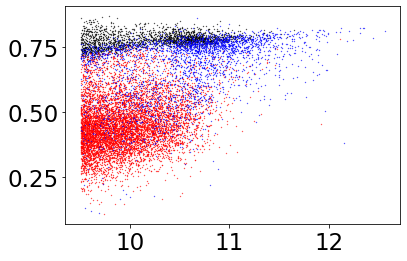

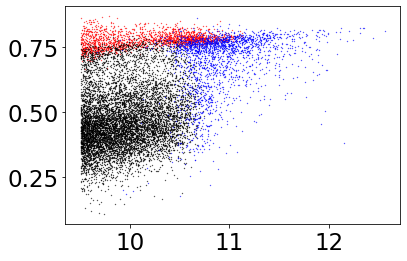

In [68]:
plt.plot(logMs[input_smooth==0],(G-R)[input_smooth==0],'ko',ms=0.3)
plt.plot(logMs[input_smooth==1],(G-R)[input_smooth==1],'ro',ms=0.3)
plt.plot(logMs[input_smooth==2],(G-R)[input_smooth==2],'bo',ms=0.3)
plt.show()
plt.plot(logMs[input_nosmooth==0],(G-R)[input_nosmooth==0],'ro',ms=0.3)
plt.plot(logMs[input_nosmooth==1],(G-R)[input_nosmooth==1],'ko',ms=0.3)
plt.plot(logMs[input_nosmooth==2],(G-R)[input_nosmooth==2],'bo',ms=0.3)

In [69]:
np.argwhere(np.in1d(logMs[input_smooth==0],logMs[input_nosmooth==1])==True).shape




(6, 1)

In [70]:
print(logMs[input_smooth==0].shape)
print(logMs[input_nosmooth==1].shape)

(1854,)
(8698,)


In [71]:
colour_sample_1_smooth = comparison_plots(3,logMs,np.column_stack((U-G,G-R,R-I)),labels3full,11,10,"3 colour clustering (U-G,G-R,R-I)")
nmf_sample_smooth = comparison_plots(3,logMs,np.column_stack((WSFH_smooth,WZH_smooth)),labels3full,11,10,"NMF clustering (3 clusters)")
NMF_color_smooth = comparison_plots(3,logMs,np.column_stack((WZH_smooth,WSFH_smooth,U-G,G-R,R-I)),labels3full,11,10,"NMF+colour clustering (3 clusters)")
colour_sample_2_smooth = comparison_plots(4,logMs,np.column_stack((U-G,G-R,R-I)),labels3full,11,10,"3 colour clustering (U-G,G-R,R-I)")
nmf_sample_4_smooth = comparison_plots(4,logMs,np.column_stack((WSFH_smooth,WZH_smooth)),labels3full,11,10,"NMF clustering (4 clusters)")
NMF_color_4_smooth = comparison_plots(4,logMs,np.column_stack((WZH_smooth,WSFH_smooth,U-G,G-R,R-I)),labels3full,11,10,"NMF+colour clustering (4 clusters)")

[[1.0248394  0.35776329 0.23431969]
 [1.05194473 0.41767693 0.26467323]
 [1.17240334 0.47620392 0.27728653]
 ...
 [0.87874222 0.19705582 0.17566109]
 [1.31242561 0.53876305 0.30278778]
 [1.05221748 0.37331772 0.22535324]] train data
[[0.89993684 0.93013256 0.93248845]
 [0.82131501 0.87259911 0.88051687]
 [0.76801177 0.84758434 0.86696486]
 ...
 [0.76530292 0.83716529 0.82353904]
 [0.76169784 0.83476032 0.82140563]
 [0.75423312 0.83065653 0.8167994 ]] prepped
GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=1000,
                means_init=None, n_components=3, n_init=10,
                precisions_init=None, random_state=42, reg_covar=1e-06,
                tol=0.001, verbose=0, verbose_interval=10, warm_start=False,
                weights_init=None) MODEL
[0 0 2 ... 0 0 0] LABELS
[[0.81846692 0.20585613 0.79471523 ... 0.25901643 0.42178089 0.28125019]
 [0.56150924 0.48886198 0.16276405 ... 0.10963469 0.38698101 0.18714596]
 [0.36752572 0.69162986 0.25668557 ... 

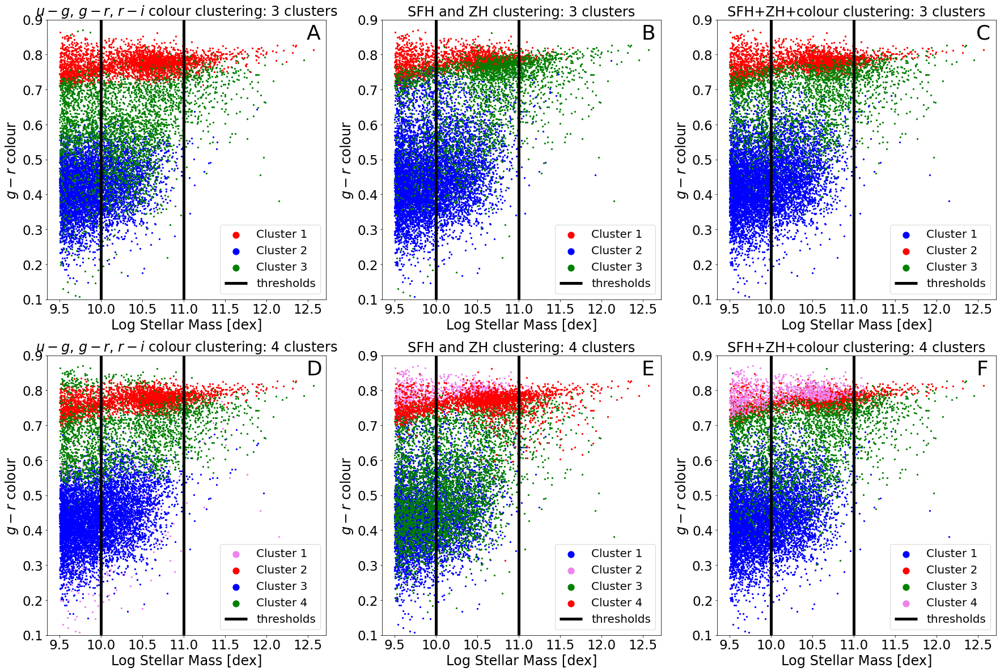

In [72]:
f,ax = plt.subplots(2,3,figsize =(30,20))
colors=['red','blue','green','violet']
#colours = [cbs[3],cbs[9],cbs[2],cbs[6]]
#ax[0,i].set(xlabel='Log Stellar Mass [dex]',ylabel = 'g-r colour',fontsize= 16)
#ax[1,i].set(xlabel='Log Stellar Mass [dex]',ylabel = 'g-r colour',fontsize= 16)
for i in range(3):
    ax[0,i].set_xlabel('Log Stellar Mass [dex]',fontsize= 24)
    ax[0,i].set_ylabel(  '$g-r$ colour',fontsize= 24)
    ax[1,i].set_xlabel('Log Stellar Mass [dex]',fontsize=24)
    ax[1,i].set_ylabel('$g-r$ colour',fontsize= 24)
    
    
ax[0,0].scatter(logMs[colour_sample_1_smooth==0],(G-R)[colour_sample_1_smooth==0],color = 'red',\
                    label = 'Cluster %i '%(1),s=5,rasterized=True)
    
ax[0,0].scatter(logMs[colour_sample_1_smooth==1],(G-R)[colour_sample_1_smooth==1],color = 'blue',\
                    label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[0,0].scatter(logMs[colour_sample_1_smooth==2],(G-R)[colour_sample_1_smooth==2],color = 'green',\
                    label = 'Cluster %i '%(3),s=5,rasterized=True)
    
    
ax[0,1].scatter(logMs[nmf_sample_smooth==0],(G-R)[nmf_sample_smooth==0],color = colors[0],label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[0,1].scatter(logMs[nmf_sample_smooth==1],(G-R)[nmf_sample_smooth==1],color = colors[1],label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[0,1].scatter(logMs[nmf_sample_smooth==2],(G-R)[nmf_sample_smooth==2],color = colors[2],label = 'Cluster %i '%(3),s=5,rasterized=True)
ax[0,2].scatter(logMs[NMF_color_smooth==0],(G-R)[NMF_color_smooth==0],color = 'blue',label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[0,2].scatter(logMs[NMF_color_smooth==1],(G-R)[NMF_color_smooth==1],color = 'red',label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[0,2].scatter(logMs[NMF_color_smooth==2],(G-R)[NMF_color_smooth==2],color = 'green',label = 'Cluster %i '%(3),s=5,rasterized=True)

    


ax[1,0].scatter(logMs[colour_sample_2_smooth==0],(G-R)[colour_sample_2_smooth==0],color = colors[3],\
                    label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[1,0].scatter(logMs[colour_sample_2_smooth==1],(G-R)[colour_sample_2_smooth==1],color = colors[0],\
                    label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[1,0].scatter(logMs[colour_sample_2_smooth==2],(G-R)[colour_sample_2_smooth==2],color = colors[1],\
                    label = 'Cluster %i '%(3),s=5,rasterized=True)
ax[1,0].scatter(logMs[colour_sample_2_smooth==3],(G-R)[colour_sample_2_smooth==3],color = colors[2],\
                    label = 'Cluster %i '%(4),s=5,rasterized=True)

ax[1,1].scatter(logMs[nmf_sample_4_smooth==0],(G-R)[nmf_sample_4_smooth==0],color = colors[1],label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[1,1].scatter(logMs[nmf_sample_4_smooth==1],(G-R)[nmf_sample_4_smooth==1],color = colors[3],label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[1,1].scatter(logMs[nmf_sample_4_smooth==2],(G-R)[nmf_sample_4_smooth==2],color = colors[2],label = 'Cluster %i '%(3),s=5,rasterized=True)
ax[1,1].scatter(logMs[nmf_sample_4_smooth==3],(G-R)[nmf_sample_4_smooth==3],color = colors[0],label = 'Cluster %i '%(4),s=5,rasterized=True)

ax[1,2].scatter(logMs[NMF_color_4_smooth==0],(G-R)[NMF_color_4_smooth==0],color = colors[1],label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[1,2].scatter(logMs[NMF_color_4_smooth==1],(G-R)[NMF_color_4_smooth==1],color = colors[0],label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[1,2].scatter(logMs[NMF_color_4_smooth==2],(G-R)[NMF_color_4_smooth==2],color = colors[2],label = 'Cluster %i '%(3),s=5,rasterized=True)
ax[1,2].scatter(logMs[NMF_color_4_smooth==3],(G-R)[NMF_color_4_smooth==3],color = colors[3],label = 'Cluster %i '%(4),s=5,rasterized=True)
ax[0,0].annotate('A',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[0,1].annotate('B',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[0,2].annotate('C',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[1,0].annotate('D',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[1,1].annotate('E',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[1,2].annotate('F',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)



ax[0,0].vlines(10,ymin=0.1 ,ymax = 0.9,color ='black', lw =5)
ax[0,0].vlines(11,ymin=0.1 ,ymax = 0.9,color ='black', lw =5,label = 'thresholds')


ax[0,1].vlines(10,ymin=0.1 ,ymax = 0.9,color ='black', lw =5)
ax[0,1].vlines(11,ymin=0.1 ,ymax = 0.9,color ='black', lw =5,label = 'thresholds')

ax[0,2].vlines(10,ymin=0.1 ,ymax = 0.9,color ='black', lw =5)
ax[0,2].vlines(11,ymin=0.1 ,ymax = 0.9,color ='black', lw =5,label = 'thresholds')

ax[1,0].vlines(10,ymin=0.1 ,ymax = 0.9,color ='black', lw =5)
ax[1,0].vlines(11,ymin=0.1 ,ymax = 0.9,color ='black', lw =5,label = 'thresholds')

ax[1,1].vlines(10,ymin=0.1 ,ymax = 0.9,color ='black', lw =5)
ax[1,1].vlines(11,ymin=0.1 ,ymax = 0.9,color ='black', lw =5,label = 'thresholds')

ax[1,2].vlines(10,ymin=0.1 ,ymax = 0.9,color ='black', lw =5)
ax[1,2].vlines(11,ymin=0.1 ,ymax = 0.9,color ='black', lw =5,label = 'thresholds')






for i in range(3):
    ax[0,i].legend(fontsize=20,markerscale=5.)
    ax[1,i].legend(fontsize=20,markerscale=5.)
    
    
ax[0,0].set_title('$u-g$, $g-r$, $r-i$ colour clustering: 3 clusters',fontsize=24)
ax[1,0].set_title('$u-g$, $g-r$, $r-i$ colour clustering: 4 clusters',fontsize=24)
ax[0,1].set_title('SFH and ZH clustering: 3 clusters',fontsize=24)
ax[1,1].set_title('SFH and ZH clustering: 4 clusters',fontsize=24)
ax[0,2].set_title('SFH+ZH+colour clustering: 3 clusters',fontsize=24)
ax[1,2].set_title('SFH+ZH+colour clustering: 4 clusters',fontsize=24)
ax[0,0].set_ylim(0.1,0.9)
ax[0,0].set_ylim(0.1,0.9)
ax[0,1].set_ylim(0.1,0.9)
ax[0,2].set_ylim(0.1,0.9)
ax[1,0].set_ylim(0.1,0.9)
ax[1,1].set_ylim(0.1,0.9)
ax[1,2].set_ylim(0.1,0.9)


plt.savefig('Summary.pdf',dpi = 300,format='pdf')

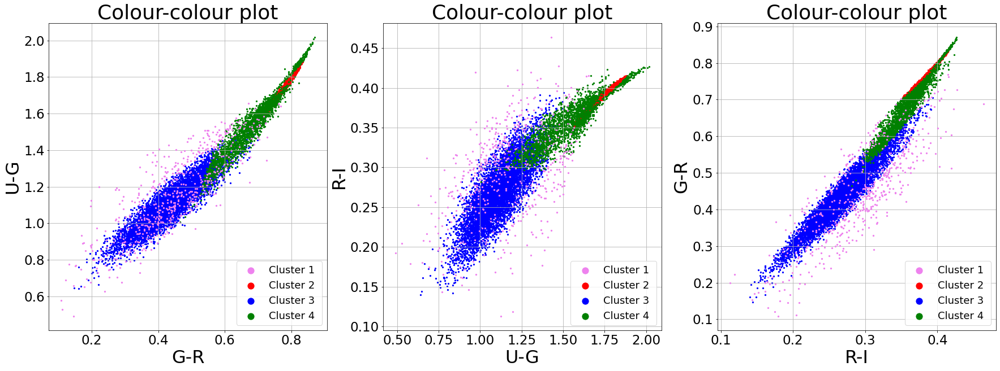

In [73]:
f,ax = plt.subplots(1,3,figsize=(30,10))
ax[0].set_title('Colour-colour plot',fontsize=36)
ax[0].scatter((G-R)[colour_sample_2_smooth==0],(U-G)[colour_sample_2_smooth==0],color = colors[3],\
                    label = 'Cluster %i '%(1),s=5,rasterized=True,zorder=4,alpha=1)
ax[0].scatter((G-R)[colour_sample_2_smooth==1],(U-G)[colour_sample_2_smooth==1],color = colors[0],\
                    label = 'Cluster %i '%(2),s=5,rasterized=True,alpha=1)
ax[0].scatter((G-R)[colour_sample_2_smooth==2],(U-G)[colour_sample_2_smooth==2],color = colors[1],\
                    label = 'Cluster %i '%(3),s=5,rasterized=True,alpha=1)
ax[0].scatter((G-R)[colour_sample_2_smooth==3],(U-G)[colour_sample_2_smooth==3],color = colors[2],\
                    label = 'Cluster %i '%(4),s=5,rasterized=True,alpha=1)
ax[0].set_ylabel('U-G',fontsize=32)
ax[0].set_xlabel('G-R',fontsize=32)
ax[0].grid()


ax[1].set_title('Colour-colour plot',fontsize=36)
ax[1].scatter((U-G)[colour_sample_2_smooth==0],(R-I)[colour_sample_2_smooth==0],color = colors[3],\
                    label = 'Cluster %i '%(1),s=5,rasterized=True,zorder=4,alpha=1)
ax[1].scatter((U-G)[colour_sample_2_smooth==1],(R-I)[colour_sample_2_smooth==1],color = colors[0],\
                    label = 'Cluster %i '%(2),s=5,rasterized=True,alpha= 1)
ax[1].scatter((U-G)[colour_sample_2_smooth==2],(R-I)[colour_sample_2_smooth==2],color = colors[1],\
                    label = 'Cluster %i '%(3),s=5,rasterized=True,alpha= 1)
ax[1].scatter((U-G)[colour_sample_2_smooth==3],(R-I)[colour_sample_2_smooth==3],color = colors[2],\
                    label = 'Cluster %i '%(4),s=5,rasterized=True,alpha= 1)
ax[1].set_ylabel('R-I',fontsize=32)
ax[1].set_xlabel('U-G',fontsize=32)
ax[1].grid()

ax[2].set_title('Colour-colour plot',fontsize=36)

ax[2].scatter((R-I)[colour_sample_2_smooth==0],(G-R)[colour_sample_2_smooth==0],color = colors[3],\
                    label = 'Cluster %i '%(1),s=5,rasterized=True,zorder=4,alpha =1)
ax[2].scatter((R-I)[colour_sample_2_smooth==1],(G-R)[colour_sample_2_smooth==1],color = colors[0],\
                    label = 'Cluster %i '%(2),s=5,rasterized=True,alpha=1)
ax[2].scatter((R-I)[colour_sample_2_smooth==2],(G-R)[colour_sample_2_smooth==2],color = colors[1],\
                    label = 'Cluster %i '%(3),s=5,rasterized=True,alpha=1)
ax[2].scatter((R-I)[colour_sample_2_smooth==3],(G-R)[colour_sample_2_smooth==3],color = colors[2],\
                    label = 'Cluster %i '%(4),s=5,rasterized=True,alpha=1)

ax[2].set_ylabel('G-R',fontsize=32)
ax[2].set_xlabel('R-I',fontsize=32)
ax[2].grid()

ax[0].legend(loc='lower right',markerscale=5.,fontsize=18)
ax[1].legend(loc='lower right',markerscale=5.,fontsize=18)
ax[2].legend(loc='lower right',markerscale=5.,fontsize=18)


[[0.12482016]
 [0.13040217]]
[[0.02524935]
 [0.02371878]]
[[0.07704369]
 [0.08036827]]
[[0.08254618]
 [0.07150328]]
[[0.21872459]
 [0.25047364]]
[[0.058271  ]
 [0.05508616]]
[[0.12160676]
 [0.1230236 ]]
[[0.17227497]
 [0.13923283]]
[[0.05729851]
 [0.05703178]]
[[0.01189569]
 [0.0108438 ]]
[[0.03655897]
 [0.03661616]]
[[0.03109835]
 [0.02836347]]


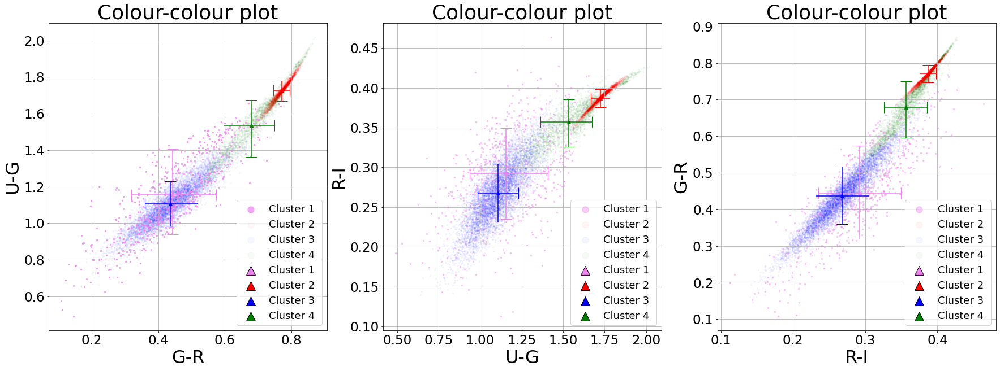

In [74]:
f,ax = plt.subplots(1,3,figsize=(30,10))
ax[0].set_title('Colour-colour plot',fontsize=36)
ax[0].scatter((G-R)[colour_sample_2_smooth==0],(U-G)[colour_sample_2_smooth==0],color = colors[3],\
                    label = 'Cluster %i '%(1),s=5,rasterized=True,zorder=4,alpha=0.7)
ax[0].scatter((G-R)[colour_sample_2_smooth==1],(U-G)[colour_sample_2_smooth==1],color = colors[0],\
                    label = 'Cluster %i '%(2),s=5,rasterized=True,alpha=0.03)
ax[0].scatter((G-R)[colour_sample_2_smooth==2],(U-G)[colour_sample_2_smooth==2],color = colors[1],\
                    label = 'Cluster %i '%(3),s=5,rasterized=True,alpha=0.03)
ax[0].scatter((G-R)[colour_sample_2_smooth==3],(U-G)[colour_sample_2_smooth==3],color = colors[2],\
                    label = 'Cluster %i '%(4),s=5,rasterized=True,alpha=0.03)

ax[0].scatter(np.mean((G-R)[colour_sample_2_smooth==0]),np.mean((U-G)[colour_sample_2_smooth==0]),color = colors[3],\
                    label = 'Cluster %i '%(1),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[0].scatter(np.mean((G-R)[colour_sample_2_smooth==1]),np.mean((U-G)[colour_sample_2_smooth==1]),color = colors[0],\
                    label = 'Cluster %i '%(2),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[0].scatter(np.mean((G-R)[colour_sample_2_smooth==2]),np.mean((U-G)[colour_sample_2_smooth==2]),color = colors[1],\
                    label = 'Cluster %i '%(3),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[0].scatter(np.mean((G-R)[colour_sample_2_smooth==3]),np.mean((U-G)[colour_sample_2_smooth==3]),color = colors[2],\
                    label = 'Cluster %i '%(4),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)

xerr = np.array([np.mean((G-R)[colour_sample_2_smooth==0])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==0]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==0]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==0])]).reshape(2,1)

yerr = np.array([np.mean((U-G)[colour_sample_2_smooth==0])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==0]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==0]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==0])]).reshape(2,1)
print(xerr)
ax[0].errorbar(x= np.mean((G-R)[colour_sample_2_smooth==0]),y=np.mean((U-G)[colour_sample_2_smooth==0]),xerr= xerr,yerr=yerr,color = colors[3],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)

xerr = np.array([np.mean((G-R)[colour_sample_2_smooth==1])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==1]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==1]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==1])]).reshape(2,1)

yerr = np.array([np.mean((U-G)[colour_sample_2_smooth==1])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==1]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==1]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==1])]).reshape(2,1)
print(xerr)
ax[0].errorbar(x= np.mean((G-R)[colour_sample_2_smooth==1]),y=np.mean((U-G)[colour_sample_2_smooth==1]),xerr= xerr,yerr= yerr,color = colors[0],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



xerr = np.array([np.mean((G-R)[colour_sample_2_smooth==2])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==2]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==2]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==2])]).reshape(2,1)

yerr = np.array([np.mean((U-G)[colour_sample_2_smooth==2])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==2]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==2]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==2])]).reshape(2,1)
print(xerr)
ax[0].errorbar(x= np.mean((G-R)[colour_sample_2_smooth==2]),y=np.mean((U-G)[colour_sample_2_smooth==2]),xerr= xerr,yerr= yerr,color = colors[1],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



xerr = np.array([np.mean((G-R)[colour_sample_2_smooth==3])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==3]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==3]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==3])]).reshape(2,1)

yerr = np.array([np.mean((U-G)[colour_sample_2_smooth==3])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==3]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==3]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==3])]).reshape(2,1)
print(xerr)
ax[0].errorbar(x= np.mean((G-R)[colour_sample_2_smooth==3]),y=np.mean((U-G)[colour_sample_2_smooth==3]),xerr= xerr,yerr= yerr,color = colors[2],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)

ax[0].set_ylabel('U-G',fontsize=32)
ax[0].set_xlabel('G-R',fontsize=32)
ax[0].grid()


ax[1].set_title('Colour-colour plot',fontsize=36)
ax[1].scatter((U-G)[colour_sample_2_smooth==0],(R-I)[colour_sample_2_smooth==0],color = colors[3],\
                    label = 'Cluster %i '%(1),s=5,rasterized=True,zorder=4,alpha=0.4)
ax[1].scatter((U-G)[colour_sample_2_smooth==1],(R-I)[colour_sample_2_smooth==1],color = colors[0],\
                    label = 'Cluster %i '%(2),s=5,rasterized=True,alpha= 0.04)
ax[1].scatter((U-G)[colour_sample_2_smooth==2],(R-I)[colour_sample_2_smooth==2],color = colors[1],\
                    label = 'Cluster %i '%(3),s=5,rasterized=True,alpha= 0.04)
ax[1].scatter((U-G)[colour_sample_2_smooth==3],(R-I)[colour_sample_2_smooth==3],color = colors[2],\
                    label = 'Cluster %i '%(4),s=5,rasterized=True,alpha= 0.04)
ax[1].set_ylabel('R-I',fontsize=32)
ax[1].set_xlabel('U-G',fontsize=32)
ax[1].grid()


ax[1].scatter(np.mean((U-G)[colour_sample_2_smooth==0]),np.mean((R-I)[colour_sample_2_smooth==0]),color = colors[3],\
                    label = 'Cluster %i '%(1),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[1].scatter(np.mean((U-G)[colour_sample_2_smooth==1]),np.mean((R-I)[colour_sample_2_smooth==1]),color = colors[0],\
                    label = 'Cluster %i '%(2),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[1].scatter(np.mean((U-G)[colour_sample_2_smooth==2]),np.mean((R-I)[colour_sample_2_smooth==2]),color = colors[1],\
                    label = 'Cluster %i '%(3),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[1].scatter(np.mean((U-G)[colour_sample_2_smooth==3]),np.mean((R-I)[colour_sample_2_smooth==3]),color = colors[2],\
                    label = 'Cluster %i '%(4),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)

xerr = np.array([np.mean((U-G)[colour_sample_2_smooth==0])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==0]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==0]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==0])]).reshape(2,1)

yerr = np.array([np.mean((R-I)[colour_sample_2_smooth==0])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==0]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==0]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==0])]).reshape(2,1)
print(xerr)
ax[1].errorbar(x= np.mean((U-G)[colour_sample_2_smooth==0]),y=np.mean((R-I)[colour_sample_2_smooth==0]),xerr= xerr,yerr=yerr,color = colors[3],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)

xerr = np.array([np.mean((U-G)[colour_sample_2_smooth==1])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==1]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==1]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==1])]).reshape(2,1)

yerr = np.array([np.mean((R-I)[colour_sample_2_smooth==1])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==1]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==1]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==1])]).reshape(2,1)
print(xerr)
ax[1].errorbar(x= np.mean((U-G)[colour_sample_2_smooth==1]),y=np.mean((R-I)[colour_sample_2_smooth==1]),xerr= xerr,yerr= yerr,color = colors[0],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



xerr = np.array([np.mean((U-G)[colour_sample_2_smooth==2])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==2]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==2]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==2])]).reshape(2,1)

yerr = np.array([np.mean((R-I)[colour_sample_2_smooth==2])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==2]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==2]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==2])]).reshape(2,1)
print(xerr)
ax[1].errorbar(x= np.mean((U-G)[colour_sample_2_smooth==2]),y=np.mean((R-I)[colour_sample_2_smooth==2]),xerr= xerr,yerr= yerr,color = colors[1],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



xerr = np.array([np.mean((U-G)[colour_sample_2_smooth==3])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==3]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==3]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==3])]).reshape(2,1)

yerr = np.array([np.mean((R-I)[colour_sample_2_smooth==3])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==3]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==3]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==3])]).reshape(2,1)
print(xerr)
ax[1].errorbar(x= np.mean((U-G)[colour_sample_2_smooth==3]),y=np.mean((R-I)[colour_sample_2_smooth==3]),xerr= xerr,yerr= yerr,color = colors[2],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



ax[2].set_title('Colour-colour plot',fontsize=36)

ax[2].scatter((R-I)[colour_sample_2_smooth==0],(G-R)[colour_sample_2_smooth==0],color = colors[3],\
                    label = 'Cluster %i '%(1),s=5,rasterized=True,zorder=4,alpha =0.4)
ax[2].scatter((R-I)[colour_sample_2_smooth==1],(G-R)[colour_sample_2_smooth==1],color = colors[0],\
                    label = 'Cluster %i '%(2),s=5,rasterized=True,alpha=0.04)
ax[2].scatter((R-I)[colour_sample_2_smooth==2],(G-R)[colour_sample_2_smooth==2],color = colors[1],\
                    label = 'Cluster %i '%(3),s=5,rasterized=True,alpha=0.04)
ax[2].scatter((R-I)[colour_sample_2_smooth==3],(G-R)[colour_sample_2_smooth==3],color = colors[2],\
                    label = 'Cluster %i '%(4),s=5,rasterized=True,alpha=0.04)


ax[2].scatter(np.mean((R-I)[colour_sample_2_smooth==0]),np.mean((G-R)[colour_sample_2_smooth==0]),color = colors[3],\
                    label = 'Cluster %i '%(1),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[2].scatter(np.mean((R-I)[colour_sample_2_smooth==1]),np.mean((G-R)[colour_sample_2_smooth==1]),color = colors[0],\
                    label = 'Cluster %i '%(2),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[2].scatter(np.mean((R-I)[colour_sample_2_smooth==2]),np.mean((G-R)[colour_sample_2_smooth==2]),color = colors[1],\
                    label = 'Cluster %i '%(3),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[2].scatter(np.mean((R-I)[colour_sample_2_smooth==3]),np.mean((G-R)[colour_sample_2_smooth==3]),color = colors[2],\
                    label = 'Cluster %i '%(4),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)

xerr = np.array([np.mean((R-I)[colour_sample_2_smooth==0])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==0]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==0]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==0])]).reshape(2,1)

yerr = np.array([np.mean((G-R)[colour_sample_2_smooth==0])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==0]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==0]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==0])]).reshape(2,1)
print(xerr)
ax[2].errorbar(x= np.mean((R-I)[colour_sample_2_smooth==0]),y=np.mean((G-R)[colour_sample_2_smooth==0]),xerr= xerr,yerr=yerr,color = colors[3],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)

xerr = np.array([np.mean((R-I)[colour_sample_2_smooth==1])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==1]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==1]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==1])]).reshape(2,1)

yerr = np.array([np.mean((G-R)[colour_sample_2_smooth==1])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==1]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==1]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==1])]).reshape(2,1)
print(xerr)
ax[2].errorbar(x= np.mean((R-I)[colour_sample_2_smooth==1]),y=np.mean((G-R)[colour_sample_2_smooth==1]),xerr= xerr,yerr= yerr,color = colors[0],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



xerr = np.array([np.mean((R-I)[colour_sample_2_smooth==2])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==2]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==2]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==2])]).reshape(2,1)

yerr = np.array([np.mean((G-R)[colour_sample_2_smooth==2])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==2]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==2]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==2])]).reshape(2,1)
print(xerr)
ax[2].errorbar(x= np.mean((R-I)[colour_sample_2_smooth==2]),y=np.mean((G-R)[colour_sample_2_smooth==2]),xerr= xerr,yerr= yerr,color = colors[1],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



xerr = np.array([np.mean((R-I)[colour_sample_2_smooth==3])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==3]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==3]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==3])]).reshape(2,1)

yerr = np.array([np.mean((G-R)[colour_sample_2_smooth==3])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==3]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==3]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==3])]).reshape(2,1)
print(xerr)
ax[2].errorbar(x= np.mean((R-I)[colour_sample_2_smooth==3]),y=np.mean((G-R)[colour_sample_2_smooth==3]),xerr= xerr,yerr= yerr,color = colors[2],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



ax[2].set_ylabel('G-R',fontsize=32)
ax[2].set_xlabel('R-I',fontsize=32)
ax[2].grid()

ax[0].legend(loc='lower right',markerscale=5.,fontsize=18)
ax[1].legend(loc='lower right',markerscale=5.,fontsize=18)
ax[2].legend(loc='lower right',markerscale=5.,fontsize=18)


In [75]:
X_train.shape

(7521, 100)

In [76]:
reconTrainScaled=np.zeros((X_trains.shape[0],100))
reconTestScaled= np.zeros((X_tests.shape[0],100))
reconValScaled= np.zeros((X_vals.shape[0],100))
reconTrainScaled.shape

for i in range(reconTrainScaled.shape[0]):
    reconTrainScaled[i,:] = rescaledTrain[i]*reconsTrain[i,:]
    
for i in range(reconTestScaled.shape[0]):
    reconTestScaled[i,:] = rescaledTest[i]*reconsTest[i,:]
    
    
for i in range(reconValScaled.shape[0]):
    reconValScaled[i,:] = rescaledVal[i]*reconsVal[i,:]

37
3
7


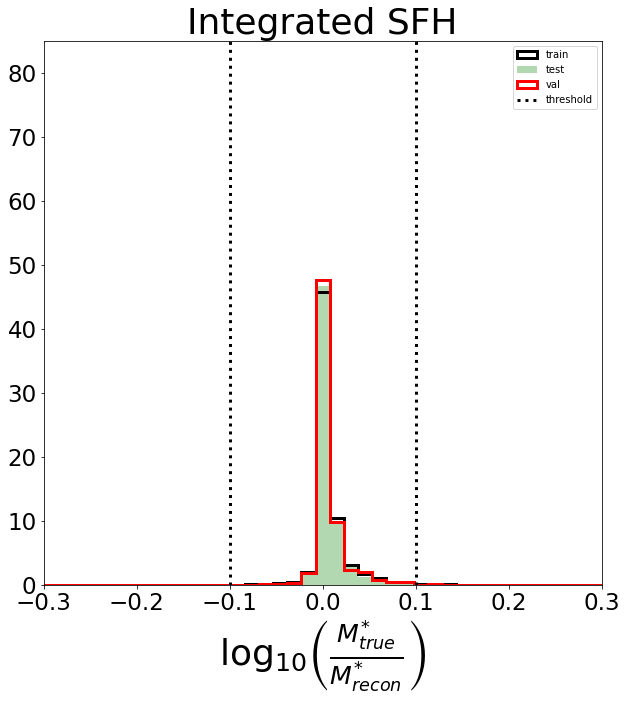

In [77]:
intReconTrain = np.sum(reconTrainScaled,axis=1)
intTrueTrain = np.sum(X_trainsREAL,axis=1)
logRatioTrain = np.log10(intReconTrain/intTrueTrain)
plt.figure(1,figsize=(10,10))
plt.hist(logRatioTrain,bins = np.linspace(-0.75,0.75,100),histtype='step',lw=3,label = 
        'train',density=True,color='black')
print(np.argwhere(np.abs(logRatioTrain)>0.1).shape[0])

intReconTest = np.sum(reconTestScaled,axis=1)
intTrueTest = np.sum(X_testsREAL,axis=1)
logRatioTest = np.log10(intReconTest/intTrueTest)
plt.hist(logRatioTest,bins = np.linspace(-0.75,0.75,100),lw=3,label = 
        'test',density=True,color='green',alpha=0.3)
print(np.argwhere(np.abs(logRatioTest)>0.1).shape[0])

intReconVal = np.sum(reconValScaled,axis=1)
intTrueVal = np.sum(X_valsREAL,axis=1)
logRatioVal = np.log10(intReconVal/intTrueVal)
plt.hist(logRatioVal,bins = np.linspace(-0.75,0.75,100),histtype='step',lw=3,label = 
        'val',density=True,color='red')
plt.title('Integrated SFH',fontsize =36)
plt.xlabel('$\\log_{10}\\left(\\frac{M^{*}_{true}}{M^{*}_{recon}}\\right)$',fontsize= 36)
plt.vlines(-0.1,0,2200,label='threshold',color='black',lw=3,linestyle='dotted')
plt.vlines(0.1,0,2200,color='black',lw=3,linestyle='dotted')
plt.ylim(0,85)
plt.xlim(-0.3,0.3)
plt.legend()
print(np.argwhere(np.abs(logRatioVal)>0.1).shape[0])

In [78]:
7/X_valsREAL.shape[0]

0.002792181890706023

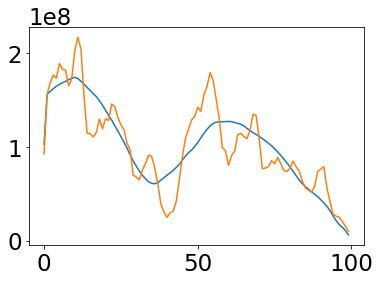

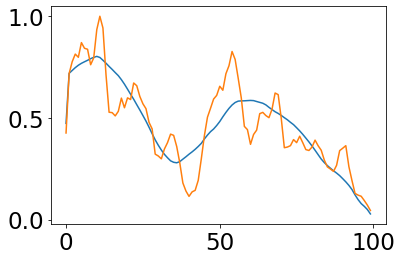

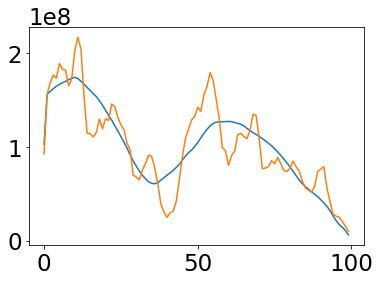

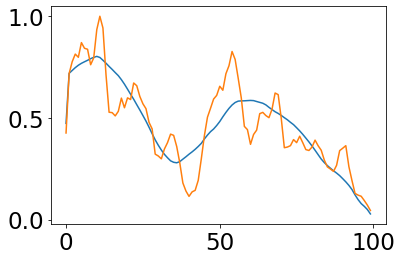

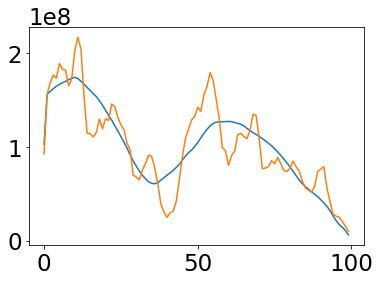

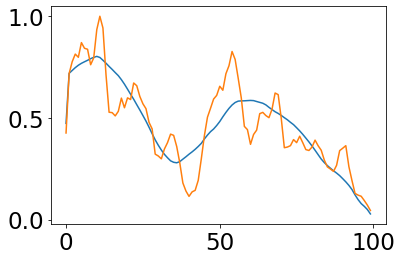

In [79]:
plt.plot(reconTrainScaled[0])
plt.plot(X_trainsREAL[0])
plt.show()
plt.plot(reconsTrain[0])
plt.plot(X_trains[0])
plt.show()
plt.plot(reconTrainScaled[0])
plt.plot(X_trainsREAL[0])
plt.show()
plt.plot(reconsTrain[0])
plt.plot(X_trains[0])
plt.show()
plt.plot(reconTrainScaled[0])
plt.plot(X_trainsREAL[0])
plt.show()
plt.plot(reconsTrain[0])
plt.plot(X_trains[0])

In [80]:
### For real this time ###

WSFH_smooth = model_real.transform(Xs)




In [81]:
### ZH reconstruction ###
# Done once we are happy with our NMF (above) with training + test data: #

model_real_zh = NMF(n_components= 4, init='random', random_state=1)
new_scaler_zh = MinMaxScaler()
Xs_zh = sklearn.preprocessing.normalize(np.vstack((smooth_zh)),axis =1,norm = 'max')
#print(np.shape(Xs))
X_trains_zh, X_tests_zh = train_test_split(Xs_zh, test_size=0.2, random_state=1)#z_train,z_test = train_test_split(X, y, z,test_size=0.2, random_state=1)
#print(np.shape(X_trains))
X_trains_zh, X_vals_zh  = train_test_split(X_trains_zh,test_size=0.25, random_state=1)#z_train,z_val= train_test_split(X_train, y_train,z_train,test_size=0.25, random_state=1)
#print(np.shape(X_trains))
W_zh = model_real_zh.fit_transform(X_trains_zh)
    #print(np.shape(H),i)
H_zh = model_real_zh.components_
#print(np.shape(W))

ReconData_zh = model_real_zh.inverse_transform(W_zh)
ReconTest_zh = model_real_zh.inverse_transform(model_real_zh.transform(X_tests_zh))

In [82]:
### For real this time ###
WZH_smooth = model_real_zh.transform(Xs_zh)


In [83]:
input_smooth = cluster_pops(3,np.column_stack((WSFH_smooth,WZH_smooth)))

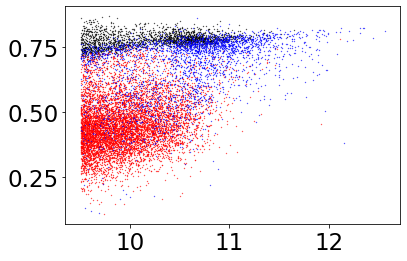

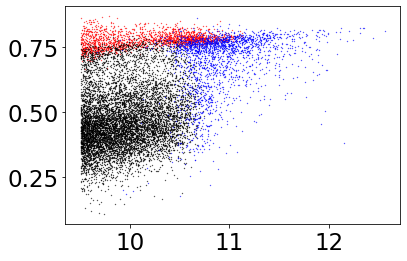

In [84]:
plt.plot(logMs[input_smooth==0],(G-R)[input_smooth==0],'ko',ms=0.3)
plt.plot(logMs[input_smooth==1],(G-R)[input_smooth==1],'ro',ms=0.3)
plt.plot(logMs[input_smooth==2],(G-R)[input_smooth==2],'bo',ms=0.3)
plt.show()
plt.plot(logMs[input_nosmooth==0],(G-R)[input_nosmooth==0],'ro',ms=0.3)
plt.plot(logMs[input_nosmooth==1],(G-R)[input_nosmooth==1],'ko',ms=0.3)
plt.plot(logMs[input_nosmooth==2],(G-R)[input_nosmooth==2],'bo',ms=0.3)

In [85]:
np.argwhere(np.in1d(logMs[input_smooth==0],logMs[input_nosmooth==1])==True).shape




(6, 1)

In [86]:
print(logMs[input_smooth==0].shape)
print(logMs[input_nosmooth==1].shape)

(1854,)
(8698,)


In [87]:
colour_sample_1_smooth = comparison_plots(3,logMs,np.column_stack((U-G,G-R,R-I)),labels3full,11,10,"3 colour clustering (U-G,G-R,R-I)")
nmf_sample_smooth = comparison_plots(3,logMs,np.column_stack((WSFH_smooth,WZH_smooth)),labels3full,11,10,"NMF clustering (3 clusters)")
NMF_color_smooth = comparison_plots(3,logMs,np.column_stack((WZH_smooth,WSFH_smooth,U-G,G-R,R-I)),labels3full,11,10,"NMF+colour clustering (3 clusters)")
colour_sample_2_smooth = comparison_plots(4,logMs,np.column_stack((U-G,G-R,R-I)),labels3full,11,10,"3 colour clustering (U-G,G-R,R-I)")
nmf_sample_4_smooth = comparison_plots(4,logMs,np.column_stack((WSFH_smooth,WZH_smooth)),labels3full,11,10,"NMF clustering (4 clusters)")
NMF_color_4_smooth = comparison_plots(4,logMs,np.column_stack((WZH_smooth,WSFH_smooth,U-G,G-R,R-I)),labels3full,11,10,"NMF+colour clustering (4 clusters)")

[[1.0248394  0.35776329 0.23431969]
 [1.05194473 0.41767693 0.26467323]
 [1.17240334 0.47620392 0.27728653]
 ...
 [0.87874222 0.19705582 0.17566109]
 [1.31242561 0.53876305 0.30278778]
 [1.05221748 0.37331772 0.22535324]] train data
[[0.89993684 0.93013256 0.93248845]
 [0.82131501 0.87259911 0.88051687]
 [0.76801177 0.84758434 0.86696486]
 ...
 [0.76530292 0.83716529 0.82353904]
 [0.76169784 0.83476032 0.82140563]
 [0.75423312 0.83065653 0.8167994 ]] prepped
GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=1000,
                means_init=None, n_components=3, n_init=10,
                precisions_init=None, random_state=42, reg_covar=1e-06,
                tol=0.001, verbose=0, verbose_interval=10, warm_start=False,
                weights_init=None) MODEL
[0 0 2 ... 0 0 0] LABELS
[[0.81846692 0.20585613 0.79471523 ... 0.25901643 0.42178089 0.28125019]
 [0.56150924 0.48886198 0.16276405 ... 0.10963469 0.38698101 0.18714596]
 [0.36752572 0.69162986 0.25668557 ... 

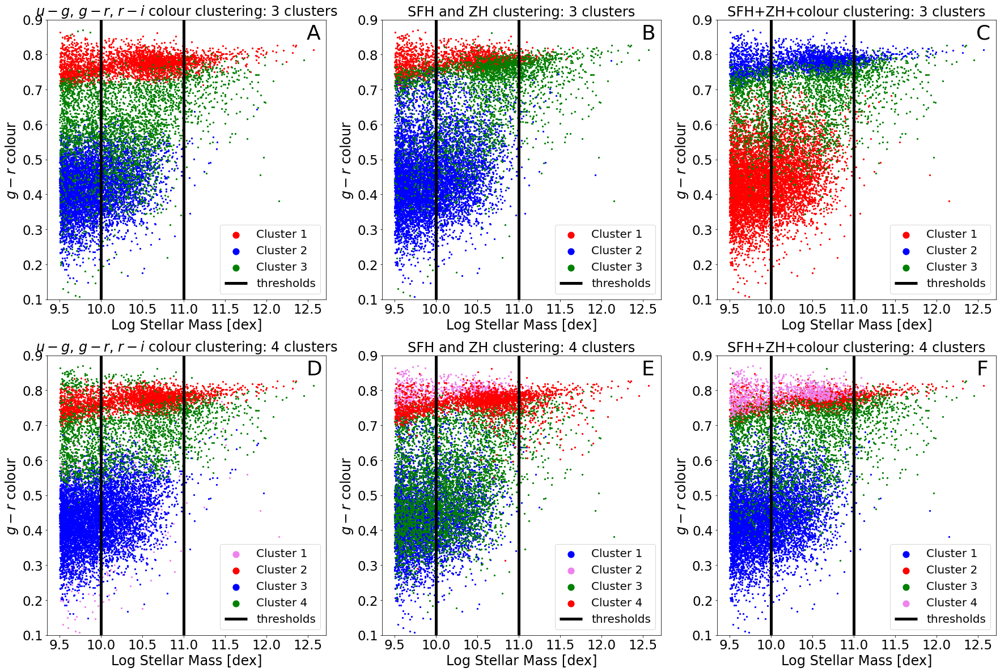

In [88]:
f,ax = plt.subplots(2,3,figsize =(30,20))
colors=['red','blue','green','violet']
#colours = [cbs[3],cbs[9],cbs[2],cbs[6]]
#ax[0,i].set(xlabel='Log Stellar Mass [dex]',ylabel = 'g-r colour',fontsize= 16)
#ax[1,i].set(xlabel='Log Stellar Mass [dex]',ylabel = 'g-r colour',fontsize= 16)
for i in range(3):
    ax[0,i].set_xlabel('Log Stellar Mass [dex]',fontsize= 24)
    ax[0,i].set_ylabel(  '$g-r$ colour',fontsize= 24)
    ax[1,i].set_xlabel('Log Stellar Mass [dex]',fontsize=24)
    ax[1,i].set_ylabel('$g-r$ colour',fontsize= 24)
    
    
ax[0,0].scatter(logMs[colour_sample_1_smooth==0],(G-R)[colour_sample_1_smooth==0],color = 'red',\
                    label = 'Cluster %i '%(1),s=5,rasterized=True)
    
ax[0,0].scatter(logMs[colour_sample_1_smooth==1],(G-R)[colour_sample_1_smooth==1],color = 'blue',\
                    label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[0,0].scatter(logMs[colour_sample_1_smooth==2],(G-R)[colour_sample_1_smooth==2],color = 'green',\
                    label = 'Cluster %i '%(3),s=5,rasterized=True)
    
    
ax[0,1].scatter(logMs[nmf_sample_smooth==0],(G-R)[nmf_sample_smooth==0],color = colors[0],label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[0,1].scatter(logMs[nmf_sample_smooth==1],(G-R)[nmf_sample_smooth==1],color = colors[1],label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[0,1].scatter(logMs[nmf_sample_smooth==2],(G-R)[nmf_sample_smooth==2],color = colors[2],label = 'Cluster %i '%(3),s=5,rasterized=True)
ax[0,2].scatter(logMs[NMF_color_smooth==0],(G-R)[NMF_color_smooth==0],color = 'red',label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[0,2].scatter(logMs[NMF_color_smooth==1],(G-R)[NMF_color_smooth==1],color = 'blue',label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[0,2].scatter(logMs[NMF_color_smooth==2],(G-R)[NMF_color_smooth==2],color = 'green',label = 'Cluster %i '%(3),s=5,rasterized=True)

    


ax[1,0].scatter(logMs[colour_sample_2_smooth==0],(G-R)[colour_sample_2_smooth==0],color = colors[3],\
                    label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[1,0].scatter(logMs[colour_sample_2_smooth==1],(G-R)[colour_sample_2_smooth==1],color = colors[0],\
                    label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[1,0].scatter(logMs[colour_sample_2_smooth==2],(G-R)[colour_sample_2_smooth==2],color = colors[1],\
                    label = 'Cluster %i '%(3),s=5,rasterized=True)
ax[1,0].scatter(logMs[colour_sample_2_smooth==3],(G-R)[colour_sample_2_smooth==3],color = colors[2],\
                    label = 'Cluster %i '%(4),s=5,rasterized=True)

ax[1,1].scatter(logMs[nmf_sample_4_smooth==0],(G-R)[nmf_sample_4_smooth==0],color = colors[1],label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[1,1].scatter(logMs[nmf_sample_4_smooth==1],(G-R)[nmf_sample_4_smooth==1],color = colors[3],label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[1,1].scatter(logMs[nmf_sample_4_smooth==2],(G-R)[nmf_sample_4_smooth==2],color = colors[2],label = 'Cluster %i '%(3),s=5,rasterized=True)
ax[1,1].scatter(logMs[nmf_sample_4_smooth==3],(G-R)[nmf_sample_4_smooth==3],color = colors[0],label = 'Cluster %i '%(4),s=5,rasterized=True)

ax[1,2].scatter(logMs[NMF_color_4_smooth==0],(G-R)[NMF_color_4_smooth==0],color = colors[1],label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[1,2].scatter(logMs[NMF_color_4_smooth==1],(G-R)[NMF_color_4_smooth==1],color = colors[0],label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[1,2].scatter(logMs[NMF_color_4_smooth==2],(G-R)[NMF_color_4_smooth==2],color = colors[2],label = 'Cluster %i '%(3),s=5,rasterized=True)
ax[1,2].scatter(logMs[NMF_color_4_smooth==3],(G-R)[NMF_color_4_smooth==3],color = colors[3],label = 'Cluster %i '%(4),s=5,rasterized=True)
ax[0,0].annotate('A',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[0,1].annotate('B',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[0,2].annotate('C',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[1,0].annotate('D',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[1,1].annotate('E',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[1,2].annotate('F',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)



ax[0,0].vlines(10,ymin=0.1 ,ymax = 0.9,color ='black', lw =5)
ax[0,0].vlines(11,ymin=0.1 ,ymax = 0.9,color ='black', lw =5,label = 'thresholds')


ax[0,1].vlines(10,ymin=0.1 ,ymax = 0.9,color ='black', lw =5)
ax[0,1].vlines(11,ymin=0.1 ,ymax = 0.9,color ='black', lw =5,label = 'thresholds')

ax[0,2].vlines(10,ymin=0.1 ,ymax = 0.9,color ='black', lw =5)
ax[0,2].vlines(11,ymin=0.1 ,ymax = 0.9,color ='black', lw =5,label = 'thresholds')

ax[1,0].vlines(10,ymin=0.1 ,ymax = 0.9,color ='black', lw =5)
ax[1,0].vlines(11,ymin=0.1 ,ymax = 0.9,color ='black', lw =5,label = 'thresholds')

ax[1,1].vlines(10,ymin=0.1 ,ymax = 0.9,color ='black', lw =5)
ax[1,1].vlines(11,ymin=0.1 ,ymax = 0.9,color ='black', lw =5,label = 'thresholds')

ax[1,2].vlines(10,ymin=0.1 ,ymax = 0.9,color ='black', lw =5)
ax[1,2].vlines(11,ymin=0.1 ,ymax = 0.9,color ='black', lw =5,label = 'thresholds')






for i in range(3):
    ax[0,i].legend(fontsize=20,markerscale=5.)
    ax[1,i].legend(fontsize=20,markerscale=5.)
    
    
ax[0,0].set_title('$u-g$, $g-r$, $r-i$ colour clustering: 3 clusters',fontsize=24)
ax[1,0].set_title('$u-g$, $g-r$, $r-i$ colour clustering: 4 clusters',fontsize=24)
ax[0,1].set_title('SFH and ZH clustering: 3 clusters',fontsize=24)
ax[1,1].set_title('SFH and ZH clustering: 4 clusters',fontsize=24)
ax[0,2].set_title('SFH+ZH+colour clustering: 3 clusters',fontsize=24)
ax[1,2].set_title('SFH+ZH+colour clustering: 4 clusters',fontsize=24)
ax[0,0].set_ylim(0.1,0.9)
ax[0,0].set_ylim(0.1,0.9)
ax[0,1].set_ylim(0.1,0.9)
ax[0,2].set_ylim(0.1,0.9)
ax[1,0].set_ylim(0.1,0.9)
ax[1,1].set_ylim(0.1,0.9)
ax[1,2].set_ylim(0.1,0.9)


plt.savefig('Summary.pdf',dpi = 300,format='pdf')

[[0.12482016]
 [0.13040217]]
[[0.02524935]
 [0.02371878]]
[[0.07704369]
 [0.08036827]]
[[0.08254618]
 [0.07150328]]
[[0.21872459]
 [0.25047364]]
[[0.058271  ]
 [0.05508616]]
[[0.12160676]
 [0.1230236 ]]
[[0.17227497]
 [0.13923283]]
[[0.05729851]
 [0.05703178]]
[[0.01189569]
 [0.0108438 ]]
[[0.03655897]
 [0.03661616]]
[[0.03109835]
 [0.02836347]]


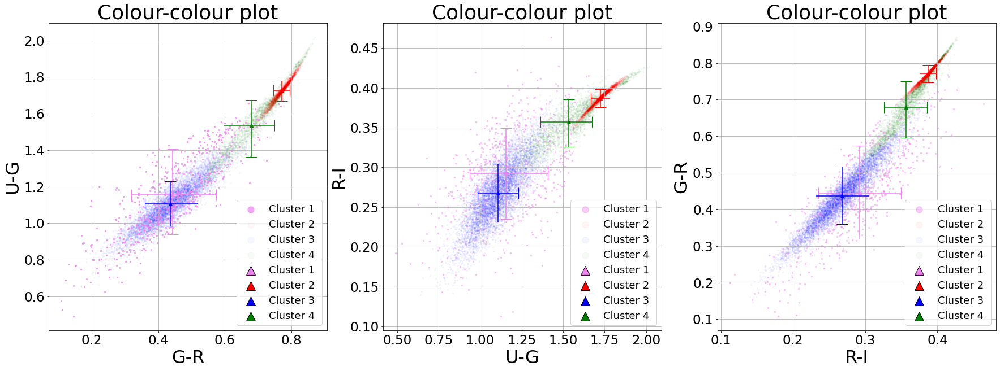

In [89]:
f,ax = plt.subplots(1,3,figsize=(30,10))
ax[0].set_title('Colour-colour plot',fontsize=36)
ax[0].scatter((G-R)[colour_sample_2_smooth==0],(U-G)[colour_sample_2_smooth==0],color = colors[3],\
                    label = 'Cluster %i '%(1),s=5,rasterized=True,zorder=4,alpha=0.7)
ax[0].scatter((G-R)[colour_sample_2_smooth==1],(U-G)[colour_sample_2_smooth==1],color = colors[0],\
                    label = 'Cluster %i '%(2),s=5,rasterized=True,alpha=0.03)
ax[0].scatter((G-R)[colour_sample_2_smooth==2],(U-G)[colour_sample_2_smooth==2],color = colors[1],\
                    label = 'Cluster %i '%(3),s=5,rasterized=True,alpha=0.03)
ax[0].scatter((G-R)[colour_sample_2_smooth==3],(U-G)[colour_sample_2_smooth==3],color = colors[2],\
                    label = 'Cluster %i '%(4),s=5,rasterized=True,alpha=0.03)

ax[0].scatter(np.mean((G-R)[colour_sample_2_smooth==0]),np.mean((U-G)[colour_sample_2_smooth==0]),color = colors[3],\
                    label = 'Cluster %i '%(1),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[0].scatter(np.mean((G-R)[colour_sample_2_smooth==1]),np.mean((U-G)[colour_sample_2_smooth==1]),color = colors[0],\
                    label = 'Cluster %i '%(2),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[0].scatter(np.mean((G-R)[colour_sample_2_smooth==2]),np.mean((U-G)[colour_sample_2_smooth==2]),color = colors[1],\
                    label = 'Cluster %i '%(3),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[0].scatter(np.mean((G-R)[colour_sample_2_smooth==3]),np.mean((U-G)[colour_sample_2_smooth==3]),color = colors[2],\
                    label = 'Cluster %i '%(4),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)

xerr = np.array([np.mean((G-R)[colour_sample_2_smooth==0])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==0]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==0]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==0])]).reshape(2,1)

yerr = np.array([np.mean((U-G)[colour_sample_2_smooth==0])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==0]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==0]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==0])]).reshape(2,1)
print(xerr)
ax[0].errorbar(x= np.mean((G-R)[colour_sample_2_smooth==0]),y=np.mean((U-G)[colour_sample_2_smooth==0]),xerr= xerr,yerr=yerr,color = colors[3],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)

xerr = np.array([np.mean((G-R)[colour_sample_2_smooth==1])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==1]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==1]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==1])]).reshape(2,1)

yerr = np.array([np.mean((U-G)[colour_sample_2_smooth==1])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==1]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==1]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==1])]).reshape(2,1)
print(xerr)
ax[0].errorbar(x= np.mean((G-R)[colour_sample_2_smooth==1]),y=np.mean((U-G)[colour_sample_2_smooth==1]),xerr= xerr,yerr= yerr,color = colors[0],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



xerr = np.array([np.mean((G-R)[colour_sample_2_smooth==2])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==2]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==2]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==2])]).reshape(2,1)

yerr = np.array([np.mean((U-G)[colour_sample_2_smooth==2])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==2]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==2]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==2])]).reshape(2,1)
print(xerr)
ax[0].errorbar(x= np.mean((G-R)[colour_sample_2_smooth==2]),y=np.mean((U-G)[colour_sample_2_smooth==2]),xerr= xerr,yerr= yerr,color = colors[1],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



xerr = np.array([np.mean((G-R)[colour_sample_2_smooth==3])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==3]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==3]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==3])]).reshape(2,1)

yerr = np.array([np.mean((U-G)[colour_sample_2_smooth==3])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==3]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==3]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==3])]).reshape(2,1)
print(xerr)
ax[0].errorbar(x= np.mean((G-R)[colour_sample_2_smooth==3]),y=np.mean((U-G)[colour_sample_2_smooth==3]),xerr= xerr,yerr= yerr,color = colors[2],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)

ax[0].set_ylabel('U-G',fontsize=32)
ax[0].set_xlabel('G-R',fontsize=32)
ax[0].grid()


ax[1].set_title('Colour-colour plot',fontsize=36)
ax[1].scatter((U-G)[colour_sample_2_smooth==0],(R-I)[colour_sample_2_smooth==0],color = colors[3],\
                    label = 'Cluster %i '%(1),s=5,rasterized=True,zorder=4,alpha=0.4)
ax[1].scatter((U-G)[colour_sample_2_smooth==1],(R-I)[colour_sample_2_smooth==1],color = colors[0],\
                    label = 'Cluster %i '%(2),s=5,rasterized=True,alpha= 0.04)
ax[1].scatter((U-G)[colour_sample_2_smooth==2],(R-I)[colour_sample_2_smooth==2],color = colors[1],\
                    label = 'Cluster %i '%(3),s=5,rasterized=True,alpha= 0.04)
ax[1].scatter((U-G)[colour_sample_2_smooth==3],(R-I)[colour_sample_2_smooth==3],color = colors[2],\
                    label = 'Cluster %i '%(4),s=5,rasterized=True,alpha= 0.04)
ax[1].set_ylabel('R-I',fontsize=32)
ax[1].set_xlabel('U-G',fontsize=32)
ax[1].grid()


ax[1].scatter(np.mean((U-G)[colour_sample_2_smooth==0]),np.mean((R-I)[colour_sample_2_smooth==0]),color = colors[3],\
                    label = 'Cluster %i '%(1),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[1].scatter(np.mean((U-G)[colour_sample_2_smooth==1]),np.mean((R-I)[colour_sample_2_smooth==1]),color = colors[0],\
                    label = 'Cluster %i '%(2),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[1].scatter(np.mean((U-G)[colour_sample_2_smooth==2]),np.mean((R-I)[colour_sample_2_smooth==2]),color = colors[1],\
                    label = 'Cluster %i '%(3),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[1].scatter(np.mean((U-G)[colour_sample_2_smooth==3]),np.mean((R-I)[colour_sample_2_smooth==3]),color = colors[2],\
                    label = 'Cluster %i '%(4),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)

xerr = np.array([np.mean((U-G)[colour_sample_2_smooth==0])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==0]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==0]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==0])]).reshape(2,1)

yerr = np.array([np.mean((R-I)[colour_sample_2_smooth==0])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==0]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==0]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==0])]).reshape(2,1)
print(xerr)
ax[1].errorbar(x= np.mean((U-G)[colour_sample_2_smooth==0]),y=np.mean((R-I)[colour_sample_2_smooth==0]),xerr= xerr,yerr=yerr,color = colors[3],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)

xerr = np.array([np.mean((U-G)[colour_sample_2_smooth==1])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==1]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==1]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==1])]).reshape(2,1)

yerr = np.array([np.mean((R-I)[colour_sample_2_smooth==1])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==1]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==1]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==1])]).reshape(2,1)
print(xerr)
ax[1].errorbar(x= np.mean((U-G)[colour_sample_2_smooth==1]),y=np.mean((R-I)[colour_sample_2_smooth==1]),xerr= xerr,yerr= yerr,color = colors[0],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



xerr = np.array([np.mean((U-G)[colour_sample_2_smooth==2])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==2]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==2]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==2])]).reshape(2,1)

yerr = np.array([np.mean((R-I)[colour_sample_2_smooth==2])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==2]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==2]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==2])]).reshape(2,1)
print(xerr)
ax[1].errorbar(x= np.mean((U-G)[colour_sample_2_smooth==2]),y=np.mean((R-I)[colour_sample_2_smooth==2]),xerr= xerr,yerr= yerr,color = colors[1],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



xerr = np.array([np.mean((U-G)[colour_sample_2_smooth==3])-\
                 np.percentile(((U-G)[colour_sample_2_smooth==3]),16)\
                ,np.percentile(((U-G)[colour_sample_2_smooth==3]),84)-\
                 np.mean((U-G)[colour_sample_2_smooth==3])]).reshape(2,1)

yerr = np.array([np.mean((R-I)[colour_sample_2_smooth==3])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==3]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==3]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==3])]).reshape(2,1)
print(xerr)
ax[1].errorbar(x= np.mean((U-G)[colour_sample_2_smooth==3]),y=np.mean((R-I)[colour_sample_2_smooth==3]),xerr= xerr,yerr= yerr,color = colors[2],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



ax[2].set_title('Colour-colour plot',fontsize=36)

ax[2].scatter((R-I)[colour_sample_2_smooth==0],(G-R)[colour_sample_2_smooth==0],color = colors[3],\
                    label = 'Cluster %i '%(1),s=5,rasterized=True,zorder=4,alpha =0.4)
ax[2].scatter((R-I)[colour_sample_2_smooth==1],(G-R)[colour_sample_2_smooth==1],color = colors[0],\
                    label = 'Cluster %i '%(2),s=5,rasterized=True,alpha=0.04)
ax[2].scatter((R-I)[colour_sample_2_smooth==2],(G-R)[colour_sample_2_smooth==2],color = colors[1],\
                    label = 'Cluster %i '%(3),s=5,rasterized=True,alpha=0.04)
ax[2].scatter((R-I)[colour_sample_2_smooth==3],(G-R)[colour_sample_2_smooth==3],color = colors[2],\
                    label = 'Cluster %i '%(4),s=5,rasterized=True,alpha=0.04)


ax[2].scatter(np.mean((R-I)[colour_sample_2_smooth==0]),np.mean((G-R)[colour_sample_2_smooth==0]),color = colors[3],\
                    label = 'Cluster %i '%(1),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[2].scatter(np.mean((R-I)[colour_sample_2_smooth==1]),np.mean((G-R)[colour_sample_2_smooth==1]),color = colors[0],\
                    label = 'Cluster %i '%(2),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[2].scatter(np.mean((R-I)[colour_sample_2_smooth==2]),np.mean((G-R)[colour_sample_2_smooth==2]),color = colors[1],\
                    label = 'Cluster %i '%(3),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)
ax[2].scatter(np.mean((R-I)[colour_sample_2_smooth==3]),np.mean((G-R)[colour_sample_2_smooth==3]),color = colors[2],\
                    label = 'Cluster %i '%(4),s=10,edgecolor='black',marker = '^',rasterized=True,zorder=5)

xerr = np.array([np.mean((R-I)[colour_sample_2_smooth==0])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==0]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==0]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==0])]).reshape(2,1)

yerr = np.array([np.mean((G-R)[colour_sample_2_smooth==0])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==0]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==0]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==0])]).reshape(2,1)
print(xerr)
ax[2].errorbar(x= np.mean((R-I)[colour_sample_2_smooth==0]),y=np.mean((G-R)[colour_sample_2_smooth==0]),xerr= xerr,yerr=yerr,color = colors[3],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)

xerr = np.array([np.mean((R-I)[colour_sample_2_smooth==1])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==1]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==1]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==1])]).reshape(2,1)

yerr = np.array([np.mean((G-R)[colour_sample_2_smooth==1])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==1]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==1]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==1])]).reshape(2,1)
print(xerr)
ax[2].errorbar(x= np.mean((R-I)[colour_sample_2_smooth==1]),y=np.mean((G-R)[colour_sample_2_smooth==1]),xerr= xerr,yerr= yerr,color = colors[0],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



xerr = np.array([np.mean((R-I)[colour_sample_2_smooth==2])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==2]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==2]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==2])]).reshape(2,1)

yerr = np.array([np.mean((G-R)[colour_sample_2_smooth==2])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==2]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==2]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==2])]).reshape(2,1)
print(xerr)
ax[2].errorbar(x= np.mean((R-I)[colour_sample_2_smooth==2]),y=np.mean((G-R)[colour_sample_2_smooth==2]),xerr= xerr,yerr= yerr,color = colors[1],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



xerr = np.array([np.mean((R-I)[colour_sample_2_smooth==3])-\
                 np.percentile(((R-I)[colour_sample_2_smooth==3]),16)\
                ,np.percentile(((R-I)[colour_sample_2_smooth==3]),84)-\
                 np.mean((R-I)[colour_sample_2_smooth==3])]).reshape(2,1)

yerr = np.array([np.mean((G-R)[colour_sample_2_smooth==3])-\
                 np.percentile(((G-R)[colour_sample_2_smooth==3]),16)\
                ,np.percentile(((G-R)[colour_sample_2_smooth==3]),84)-\
                 np.mean((G-R)[colour_sample_2_smooth==3])]).reshape(2,1)
print(xerr)
ax[2].errorbar(x= np.mean((R-I)[colour_sample_2_smooth==3]),y=np.mean((G-R)[colour_sample_2_smooth==3]),xerr= xerr,yerr= yerr,color = colors[2],\
                    capsize=10,marker = '^',rasterized=True,zorder=5)



ax[2].set_ylabel('G-R',fontsize=32)
ax[2].set_xlabel('R-I',fontsize=32)
ax[2].grid()

ax[0].legend(loc='lower right',markerscale=5.,fontsize=18)
ax[1].legend(loc='lower right',markerscale=5.,fontsize=18)
ax[2].legend(loc='lower right',markerscale=5.,fontsize=18)


In [90]:
np.mean((U-G)[colour_sample_2_smooth==0])

1.1564172339742282

In [91]:
np.mean((R-I)[colour_sample_2_smooth==2])

0.26790578705923895

In [92]:
np.mean((G-R)[colour_sample_2_smooth==3])

0.6789972121767003

In [93]:
xerr

array([[0.03109835],
       [0.02836347]])

In [94]:
def ks_test(fM,labels,upper,lower):
    counter = 0
    for i in range(np.unique(labels).shape[0]):
        for j in range(i+1,np.unique(labels).shape[0]):
            
            counter+=1
            
    KS_arr = np.zeros((2,counter))
    
    count = 0
    for i in range(np.unique(labels).shape[0]):
        for j in range(i+1,np.unique(labels).shape[0]):
            print(i,j)
            KS_stat,KS_p = stats.ks_2samp(fM[(labels==i)&(logMs>lower)&(logMs<=upper)],fM[(labels==j)&(logMs>lower)&(logMs<=upper)])
            print(KS_stat,KS_p,i,j)
            KS_arr[0,count] = KS_stat
            KS_arr[1,count] = KS_p
            
            count +=1
            
    return KS_arr

In [95]:
KS_arr_smooth =np.zeros((2,27))
print('case A')
KS_arr_smooth[:,:3]  = ks_test(fM,colour_sample_1_smooth,11,10)
print('case B')
KS_arr_smooth[:,3:6]  = ks_test(fM,nmf_sample_smooth,11,10)
print('case C')
KS_arr_smooth[:,6:9]  = ks_test(fM,NMF_color_smooth,11,10)
print('case D')
KS_arr_smooth[:,9:15]  = ks_test(fM,colour_sample_2_smooth,11,10)
print('case E')
KS_arr_smooth[:,15:21]  = ks_test(fM,nmf_sample_4_smooth,11,10)
print('case F')
KS_arr_smooth[:,21:]  = ks_test(fM,NMF_color_4_smooth,11,10)
dKSS = { 'KS-statistic':KS_arr_smooth[0,:], 'P-value':KS_arr_smooth[1,:]}

case A
0 1
0.09540956572345281 2.767149487326037e-08 0 1
0 2
0.086208976585456 2.0347614156923655e-06 0 2
1 2
0.07358469644345403 4.259862674804715e-05 1 2
case B
0 1
0.11410878008013176 2.0438462033922633e-09 0 1
0 2
0.12870176139579795 6.711055045016678e-10 0 2
1 2
0.1336556075402572 1.7763568394002505e-15 1 2
case C
0 1
0.09612096511315066 1.9576912979601957e-08 0 1
0 2
0.10326394246964352 4.432409439480978e-09 0 2
1 2
0.03985257792277839 0.20322007304283363 1 2
case D
0 1
0.13332257774439432 0.0015019708947455745 0 1
0 2
0.1389801055020624 0.0005409146727274328 0 2
0 3
0.17682290790403446 1.4638613007544876e-05 0 3
1 2
0.10461817420844814 1.6163292926307804e-10 1 2
1 3
0.06423707781154048 0.009154889497416163 1 3
2 3
0.13555823920627708 8.696376951888851e-13 2 3
case E
0 1
0.2861115214275904 6.661338147750939e-16 0 1
0 2
0.2120420859920398 4.3315309018819335e-40 0 2
0 3
0.11785701876999473 2.0629512542669204e-09 0 3
1 2
0.09716688692576408 0.0017139213347278082 1 2
1 3
0.2393048199

In [96]:
import pandas as pd



In [97]:
Case = ['A','A','A','B','B','B','C','C','C','D','D','D','D','D','D','E','E','E','E','E','E','F','F','F','F','F','F']

In [98]:
Pair1 = ['cluster 0','cluster 0','cluster 1',\
         'cluster 0','cluster 0','cluster 1',\
         'cluster 0','cluster 0','cluster 1',\
         'cluster 0','cluster 0','cluster 0','cluster 1','cluster 1','cluster 2',\
         'cluster 0','cluster 0','cluster 0','cluster 1','cluster 1','cluster 2',\
         'cluster 0','cluster 0','cluster 0','cluster 1','cluster 1','cluster 2']
Pair2 = ['cluster 1','cluster 2','cluster 2',\
         'cluster 1','cluster 2','cluster 2',\
         'cluster 1','cluster 2','cluster 2',\
         'cluster 1','cluster 2','cluster 3','cluster 2','cluster 3','cluster 3',\
         'cluster 1','cluster 2','cluster 3','cluster 2','cluster 3','cluster 3',\
         'cluster 1','cluster 2','cluster 3','cluster 2','cluster 3','cluster 3']

In [99]:
df_KSS = pd.DataFrame(data = dKSS,index = [Case,Pair1,Pair2])
 


In [100]:
df_KSS.to_excel("KS_tests_SMOOTH.xlsx",
             sheet_name='ProjectTable') 

How do you parse significance of KS test? Are we just looking at p< some value, or is there some grading that also gets applied here?

In [101]:
df_KSS

KS-statistic       P-value
A cluster 0 cluster 1      0.095410  2.767149e-08
            cluster 2      0.086209  2.034761e-06
  cluster 1 cluster 2      0.073585  4.259863e-05
B cluster 0 cluster 1      0.114109  2.043846e-09
            cluster 2      0.128702  6.711055e-10
  cluster 1 cluster 2      0.133656  1.776357e-15
C cluster 0 cluster 1      0.096121  1.957691e-08
            cluster 2      0.103264  4.432409e-09
  cluster 1 cluster 2      0.039853  2.032201e-01
D cluster 0 cluster 1      0.133323  1.501971e-03
            cluster 2      0.138980  5.409147e-04
            cluster 3      0.176823  1.463861e-05
  cluster 1 cluster 2      0.104618  1.616329e-10
            cluster 3      0.064237  9.154889e-03
  cluster 2 cluster 3      0.135558  8.696377e-13
E cluster 0 cluster 1      0.286112  6.661338e-16
            cluster 2      0.212042  4.331531e-40
            cluster 3      0.117857  2.062951e-09
  cluster 1 cluster 2      0.097167  1.713921e-03
            cluster 3      0.239305  2.220446e-16
  cluster 2 cluster 3      0.222109  2.839157e-36
F cluster 0 cluster 1      0.141809  1.709743e-14
            cluster 2      0.082707  4.284522e-06
            cluster 3      0.188880  2.286282e-12
  cluster 1 cluster 2      0.084750  2.336801e-04
            cluster 3      0.224010  2.264855e-14
  cluster 2 cluster 3      0.157712  9.041956e-08

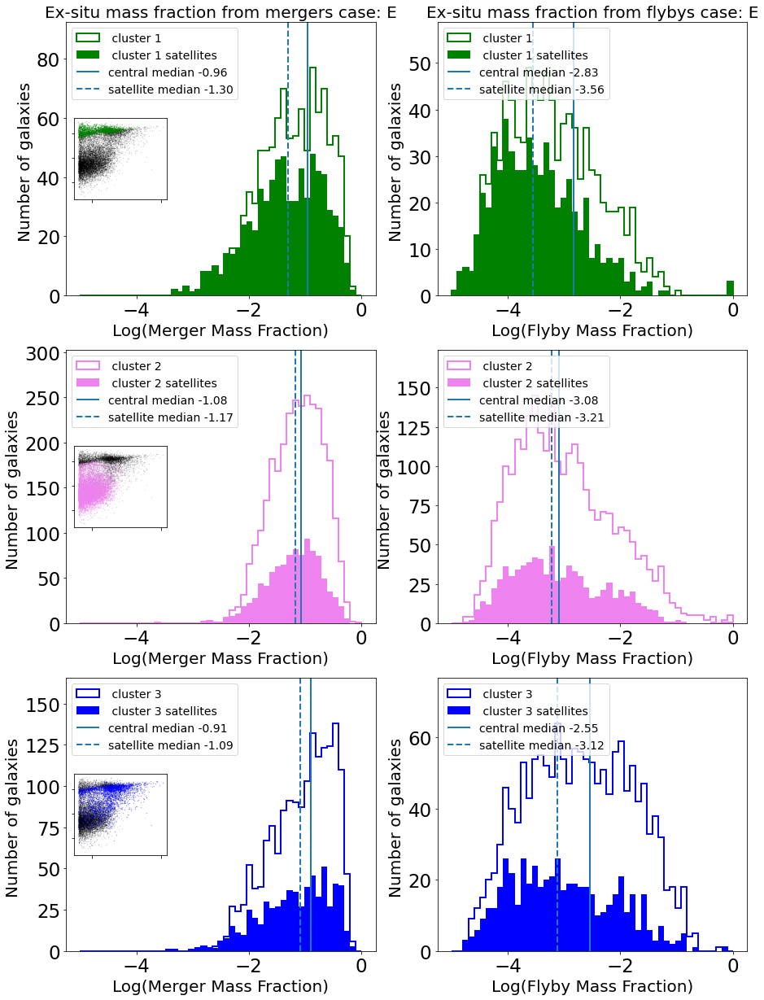

In [102]:
fM_plot(input_smooth,'E',11,10)

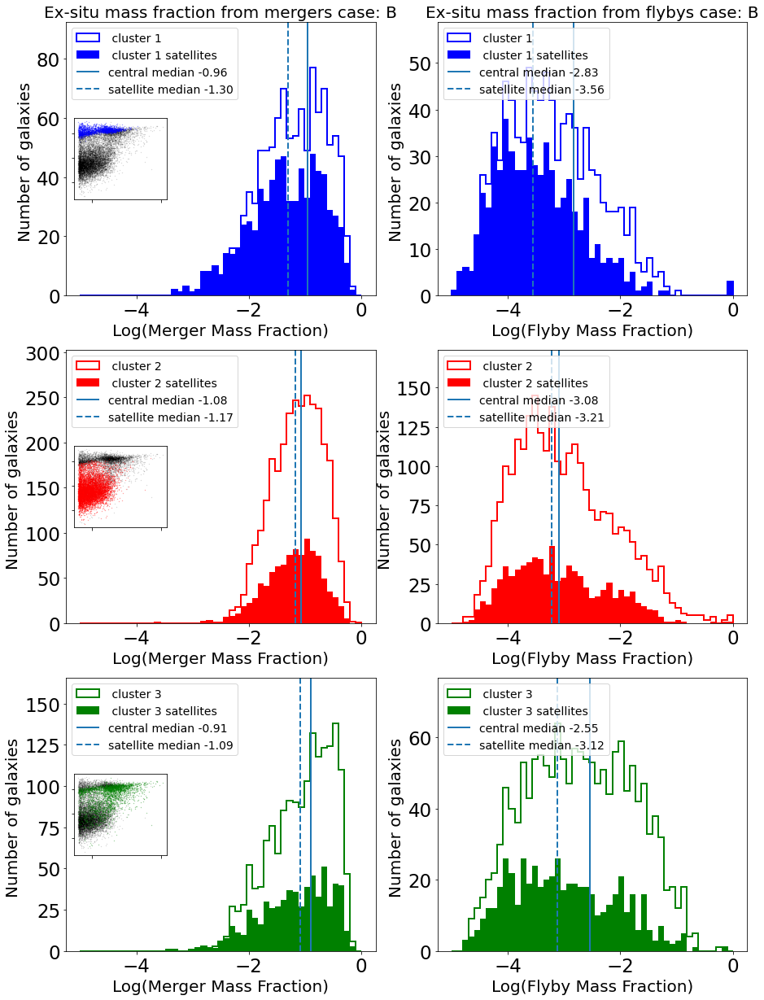

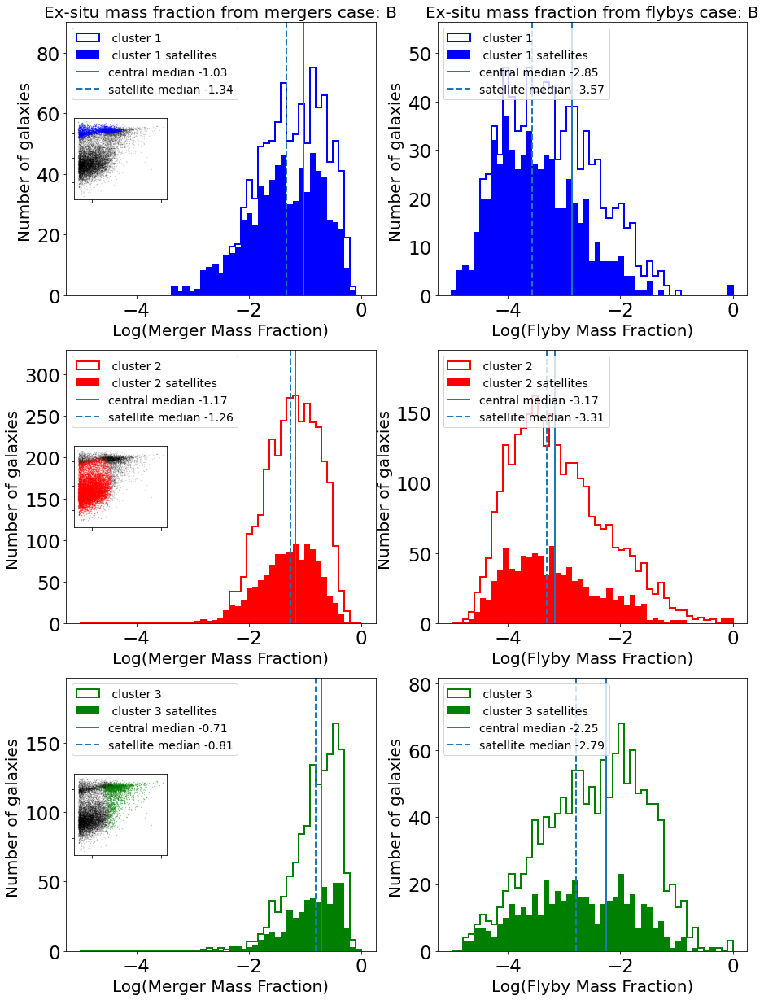

In [103]:
fM_plot(input_smooth,'B',11,10)
fM_plot(input_nosmooth,'B',11,10)

In [104]:
# can use my comparison plot framework from the originals to prove it works.. potentially.



In [105]:
# now how about we analyse pops from NMF-3 --> NMF-4?
print('Fraction of galaxies in pop 0 going into pop 0 of 4 cluster case %.3f'%(100*(logMs[nmf_sample==0][np.in1d(logMs[nmf_sample==0],logMs[nmf_sample_4==0])].shape[0])/logMs[nmf_sample==0].shape[0]))
print('Fraction of galaxies in pop 0 going into pop 1 of 4 cluster case %.3f'%(100*(logMs[nmf_sample==0][np.in1d(logMs[nmf_sample==0],logMs[nmf_sample_4==1])].shape[0])/logMs[nmf_sample==0].shape[0]))
print('Fraction of galaxies in pop 0 going into pop 2 of 4 cluster case %.3f'%(100*(logMs[nmf_sample==0][np.in1d(logMs[nmf_sample==0],logMs[nmf_sample_4==2])].shape[0])/logMs[nmf_sample==0].shape[0]))
print('Fraction of galaxies in pop 0 going into pop 3 of 4 cluster case %.3f'%(100*(logMs[nmf_sample==0][np.in1d(logMs[nmf_sample==0],logMs[nmf_sample_4==3])].shape[0])/logMs[nmf_sample==0].shape[0]))

Fraction of galaxies in pop 0 going into pop 0 of 4 cluster case 0.166
Fraction of galaxies in pop 0 going into pop 1 of 4 cluster case 91.110
Fraction of galaxies in pop 0 going into pop 2 of 4 cluster case 0.221
Fraction of galaxies in pop 0 going into pop 3 of 4 cluster case 8.945


In [106]:
# now how about we analyse pops from NMF-3 --> NMF-4?
print('Fraction of galaxies in pop 1 going into pop 0 of 4 cluster case %.3f'%(100*(logMs[nmf_sample==1][np.in1d(logMs[nmf_sample==1],logMs[nmf_sample_4==0])].shape[0])/logMs[nmf_sample==1].shape[0]))
print('Fraction of galaxies in pop 1 going into pop 1 of 4 cluster case %.3f'%(100*(logMs[nmf_sample==1][np.in1d(logMs[nmf_sample==1],logMs[nmf_sample_4==1])].shape[0])/logMs[nmf_sample==1].shape[0]))
print('Fraction of galaxies in pop 1 going into pop 2 of 4 cluster case %.3f'%(100*(logMs[nmf_sample==1][np.in1d(logMs[nmf_sample==1],logMs[nmf_sample_4==2])].shape[0])/logMs[nmf_sample==1].shape[0]))
print('Fraction of galaxies in pop 1 going into pop 3 of 4 cluster case %.3f'%(100*(logMs[nmf_sample==1][np.in1d(logMs[nmf_sample==1],logMs[nmf_sample_4==3])].shape[0])/logMs[nmf_sample==1].shape[0]))

Fraction of galaxies in pop 1 going into pop 0 of 4 cluster case 82.858
Fraction of galaxies in pop 1 going into pop 1 of 4 cluster case 0.057
Fraction of galaxies in pop 1 going into pop 2 of 4 cluster case 0.000
Fraction of galaxies in pop 1 going into pop 3 of 4 cluster case 17.153


In [107]:
# now how about we analyse pops from NMF-3 --> NMF-4?
print('Fraction of galaxies in pop 2 going into pop 0 of 4 cluster case %.3f'%(100*(logMs[nmf_sample==2][np.in1d(logMs[nmf_sample==2],logMs[nmf_sample_4==0])].shape[0])/logMs[nmf_sample==2].shape[0]))
print('Fraction of galaxies in pop 2 going into pop 1 of 4 cluster case %.3f'%(100*(logMs[nmf_sample==2][np.in1d(logMs[nmf_sample==2],logMs[nmf_sample_4==1])].shape[0])/logMs[nmf_sample==2].shape[0]))
print('Fraction of galaxies in pop 2 going into pop 2 of 4 cluster case %.3f'%(100*(logMs[nmf_sample==2][np.in1d(logMs[nmf_sample==2],logMs[nmf_sample_4==2])].shape[0])/logMs[nmf_sample==2].shape[0]))
print('Fraction of galaxies in pop 2 going into pop 3 of 4 cluster case %.3f'%(100*(logMs[nmf_sample==2][np.in1d(logMs[nmf_sample==2],logMs[nmf_sample_4==3])].shape[0])/logMs[nmf_sample==2].shape[0]))

Fraction of galaxies in pop 2 going into pop 0 of 4 cluster case 0.000
Fraction of galaxies in pop 2 going into pop 1 of 4 cluster case 0.592
Fraction of galaxies in pop 2 going into pop 2 of 4 cluster case 43.090
Fraction of galaxies in pop 2 going into pop 3 of 4 cluster case 56.515


In [108]:
53.570+35.642+0.160

89.372

In [109]:
print('Galaxies in pop 0 for 4 cluster from cluster 0:',logMs[nmf_sample_4==0][np.in1d(logMs[nmf_sample_4==0],logMs[nmf_sample==0])].shape[0]/logMs[nmf_sample_4==0].shape[0])
print('Galaxies in pop 0 for 4 cluster from cluster 1:',logMs[nmf_sample_4==0][np.in1d(logMs[nmf_sample_4==0],logMs[nmf_sample==1])].shape[0]/logMs[nmf_sample_4==0].shape[0])
print('Galaxies in pop 0 for 4 cluster from cluster 2:',logMs[nmf_sample_4==0][np.in1d(logMs[nmf_sample_4==0],logMs[nmf_sample==2])].shape[0]/logMs[nmf_sample_4==0].shape[0])

Galaxies in pop 0 for 4 cluster from cluster 0: 0.00041631973355537054
Galaxies in pop 0 for 4 cluster from cluster 1: 1.0
Galaxies in pop 0 for 4 cluster from cluster 2: 0.0


In [110]:
print('Galaxies in pop 1 for 4 cluster from cluster 0:',logMs[nmf_sample_4==1][np.in1d(logMs[nmf_sample_4==1],logMs[nmf_sample==0])].shape[0]/logMs[nmf_sample_4==1].shape[0])
print('Galaxies in pop 1 for 4 cluster from cluster 1:',logMs[nmf_sample_4==1][np.in1d(logMs[nmf_sample_4==1],logMs[nmf_sample==1])].shape[0]/logMs[nmf_sample_4==1].shape[0])
print('Galaxies in pop 1 for 4 cluster from cluster 2:',logMs[nmf_sample_4==1][np.in1d(logMs[nmf_sample_4==1],logMs[nmf_sample==2])].shape[0]/logMs[nmf_sample_4==1].shape[0])

Galaxies in pop 1 for 4 cluster from cluster 0: 0.9939759036144579
Galaxies in pop 1 for 4 cluster from cluster 1: 0.0030120481927710845
Galaxies in pop 1 for 4 cluster from cluster 2: 0.007228915662650603


In [111]:
print('Galaxies in pop 2 for 4 cluster from cluster 0:',logMs[nmf_sample_4==2][np.in1d(logMs[nmf_sample_4==2],logMs[nmf_sample==0])].shape[0]/logMs[nmf_sample_4==2].shape[0])
print('Galaxies in pop 2 for 4 cluster from cluster 1:',logMs[nmf_sample_4==2][np.in1d(logMs[nmf_sample_4==2],logMs[nmf_sample==1])].shape[0]/logMs[nmf_sample_4==2].shape[0])
print('Galaxies in pop 2 for 4 cluster from cluster 2:',logMs[nmf_sample_4==2][np.in1d(logMs[nmf_sample_4==2],logMs[nmf_sample==2])].shape[0]/logMs[nmf_sample_4==2].shape[0])

Galaxies in pop 2 for 4 cluster from cluster 0: 0.0045662100456621
Galaxies in pop 2 for 4 cluster from cluster 1: 0.0
Galaxies in pop 2 for 4 cluster from cluster 2: 0.9965753424657534


In [112]:
print('Galaxies in pop 3 for 4 cluster from cluster 0:',logMs[nmf_sample_4==3][np.in1d(logMs[nmf_sample_4==3],logMs[nmf_sample==0])].shape[0]/logMs[nmf_sample_4==3].shape[0])
print('Galaxies in pop 3 for 4 cluster from cluster 1:',logMs[nmf_sample_4==3][np.in1d(logMs[nmf_sample_4==3],logMs[nmf_sample==1])].shape[0]/logMs[nmf_sample_4==3].shape[0])
print('Galaxies in pop 3 for 4 cluster from cluster 2:',logMs[nmf_sample_4==3][np.in1d(logMs[nmf_sample_4==3],logMs[nmf_sample==2])].shape[0]/logMs[nmf_sample_4==3].shape[0])

Galaxies in pop 3 for 4 cluster from cluster 0: 0.05800214822771214
Galaxies in pop 3 for 4 cluster from cluster 1: 0.5338345864661654
Galaxies in pop 3 for 4 cluster from cluster 2: 0.40995345506623704


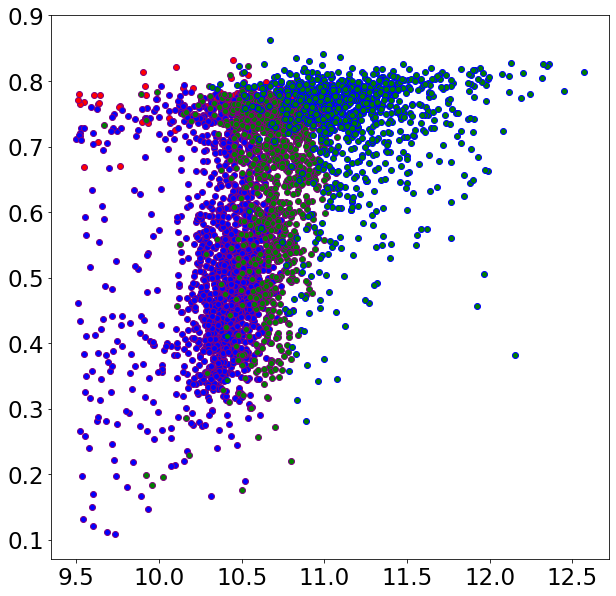

In [113]:
plt.figure(1,figsize=(10,10))
plt.scatter(logMs[nmf_sample_4==3][np.in1d(logMs[nmf_sample_4==3],logMs[nmf_sample==0])],(G-R)[nmf_sample_4==3][np.in1d(logMs[nmf_sample_4==3],logMs[nmf_sample==0])],facecolor='red',edgecolor='purple')
plt.scatter(logMs[nmf_sample_4==3][np.in1d(logMs[nmf_sample_4==3],logMs[nmf_sample==1])],(G-R)[nmf_sample_4==3][np.in1d(logMs[nmf_sample_4==3],logMs[nmf_sample==1])],facecolor='blue',edgecolor='purple')
plt.scatter(logMs[nmf_sample_4==3][np.in1d(logMs[nmf_sample_4==3],logMs[nmf_sample==2])],(G-R)[nmf_sample_4==3][np.in1d(logMs[nmf_sample_4==3],logMs[nmf_sample==2])],facecolor='green',edgecolor='purple')
c4_idx = 2
plt.scatter(logMs[nmf_sample_4==c4_idx][np.in1d(logMs[nmf_sample_4==c4_idx],logMs[nmf_sample==0])],(G-R)[nmf_sample_4==c4_idx][np.in1d(logMs[nmf_sample_4==c4_idx],logMs[nmf_sample==0])],facecolor='red',edgecolor='blue')
plt.scatter(logMs[nmf_sample_4==c4_idx][np.in1d(logMs[nmf_sample_4==c4_idx],logMs[nmf_sample==1])],(G-R)[nmf_sample_4==c4_idx][np.in1d(logMs[nmf_sample_4==c4_idx],logMs[nmf_sample==1])],facecolor='blue',edgecolor='blue')
plt.scatter(logMs[nmf_sample_4==c4_idx][np.in1d(logMs[nmf_sample_4==c4_idx],logMs[nmf_sample==2])],(G-R)[nmf_sample_4==c4_idx][np.in1d(logMs[nmf_sample_4==c4_idx],logMs[nmf_sample==2])],facecolor='green',edgecolor='blue')


In [114]:
def source_of_n1cluster(labels_n1,labels_n):
    # Analyse where N+1 clustering sources its data from N cluster case..
    source_frac = []
    for i in range(np.unique(labels_n1).shape[0]):
        print('------------------------------------------------------------------------')
        for j in range(np.unique(labels_n).shape[0]):
            print(f'% Galaxies in pop {i+1} for 4 cluster from cluster {j+1}:',logMs[labels_n1==i][np.in1d(logMs[labels_n1==i],logMs[labels_n==j])].shape[0]/logMs[labels_n1==i].shape[0] )
            source_frac.append(logMs[labels_n1==i][np.in1d(logMs[labels_n1==i],logMs[labels_n==j])].shape[0]/logMs[labels_n1==i].shape[0] )
            
            
    return source_frac
    

In [115]:
source_of_n1cluster(nmf_sample_4,nmf_sample)





------------------------------------------------------------------------
% Galaxies in pop 1 for 4 cluster from cluster 1: 0.00041631973355537054
% Galaxies in pop 1 for 4 cluster from cluster 2: 1.0
% Galaxies in pop 1 for 4 cluster from cluster 3: 0.0
------------------------------------------------------------------------
% Galaxies in pop 2 for 4 cluster from cluster 1: 0.9939759036144579
% Galaxies in pop 2 for 4 cluster from cluster 2: 0.0030120481927710845
% Galaxies in pop 2 for 4 cluster from cluster 3: 0.007228915662650603
------------------------------------------------------------------------
% Galaxies in pop 3 for 4 cluster from cluster 1: 0.0045662100456621
% Galaxies in pop 3 for 4 cluster from cluster 2: 0.0
% Galaxies in pop 3 for 4 cluster from cluster 3: 0.9965753424657534
------------------------------------------------------------------------
% Galaxies in pop 4 for 4 cluster from cluster 1: 0.05800214822771214
% Galaxies in pop 4 for 4 cluster from cluster 2: 0.5

[0.00041631973355537054,
 1.0,
 0.0,
 0.9939759036144579,
 0.0030120481927710845,
 0.007228915662650603,
 0.0045662100456621,
 0.0,
 0.9965753424657534,
 0.05800214822771214,
 0.5338345864661654,
 0.40995345506623704]

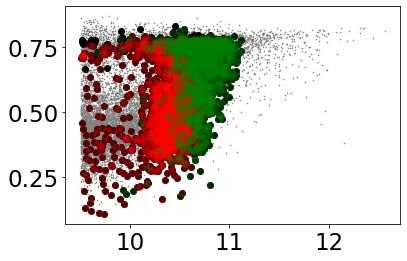

In [116]:

plt.scatter(logMs[nmf_sample_4==2],(G-R)[nmf_sample_4==2],color='grey',s=0.3)

plt.scatter(logMs[nmf_sample_4==1],(G-R)[nmf_sample_4==1],color='grey',s=0.3)

plt.scatter(logMs[nmf_sample_4==0],(G-R)[nmf_sample_4==0],color='grey',s=0.3)
plt.scatter(logMs[nmf_sample_4==3],(G-R)[nmf_sample_4==3],color='black')
plt.scatter(logMs[(nmf_sample==1)&(nmf_sample_4==3)],(G-R)[(nmf_sample==1)&(nmf_sample_4==3)],color='red',alpha=0.3)
plt.scatter(logMs[(nmf_sample==2)&(nmf_sample_4==3)],(G-R)[(nmf_sample==2)&(nmf_sample_4==3)],color='green',alpha=0.3)





In [117]:
source_of_n1cluster(colour_sample_2,colour_sample_1)


------------------------------------------------------------------------
% Galaxies in pop 1 for 4 cluster from cluster 1: 0.0018148820326678765
% Galaxies in pop 1 for 4 cluster from cluster 2: 0.16696914700544466
% Galaxies in pop 1 for 4 cluster from cluster 3: 0.838475499092559
------------------------------------------------------------------------
% Galaxies in pop 2 for 4 cluster from cluster 1: 0.9858695652173913
% Galaxies in pop 2 for 4 cluster from cluster 2: 0.0014492753623188406
% Galaxies in pop 2 for 4 cluster from cluster 3: 0.015579710144927537
------------------------------------------------------------------------
% Galaxies in pop 3 for 4 cluster from cluster 1: 0.0007142857142857143
% Galaxies in pop 3 for 4 cluster from cluster 2: 0.8435714285714285
% Galaxies in pop 3 for 4 cluster from cluster 3: 0.15942857142857142
------------------------------------------------------------------------
% Galaxies in pop 4 for 4 cluster from cluster 1: 0.1677158273381295
% Gala

[0.0018148820326678765,
 0.16696914700544466,
 0.838475499092559,
 0.9858695652173913,
 0.0014492753623188406,
 0.015579710144927537,
 0.0007142857142857143,
 0.8435714285714285,
 0.15942857142857142,
 0.1677158273381295,
 0.0764388489208633,
 0.760341726618705]

In [118]:
source_of_n1cluster(NMF_color_4,NMF_color)



------------------------------------------------------------------------
% Galaxies in pop 1 for 4 cluster from cluster 1: 0.9991078066914498
% Galaxies in pop 1 for 4 cluster from cluster 2: 0.0011895910780669145
% Galaxies in pop 1 for 4 cluster from cluster 3: 0.0
------------------------------------------------------------------------
% Galaxies in pop 2 for 4 cluster from cluster 1: 0.0018066847335140017
% Galaxies in pop 2 for 4 cluster from cluster 2: 1.0
% Galaxies in pop 2 for 4 cluster from cluster 3: 0.0018066847335140017
------------------------------------------------------------------------
% Galaxies in pop 3 for 4 cluster from cluster 1: 0.6846504559270516
% Galaxies in pop 3 for 4 cluster from cluster 2: 0.028875379939209727
% Galaxies in pop 3 for 4 cluster from cluster 3: 0.28913373860182373
------------------------------------------------------------------------
% Galaxies in pop 4 for 4 cluster from cluster 1: 0.0
% Galaxies in pop 4 for 4 cluster from cluster 2: 0

[0.9991078066914498,
 0.0011895910780669145,
 0.0,
 0.0018066847335140017,
 1.0,
 0.0018066847335140017,
 0.6846504559270516,
 0.028875379939209727,
 0.28913373860182373,
 0.0,
 0.05186721991701245,
 0.9491701244813278]

1661 1846
1913 2126


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

1656 1841


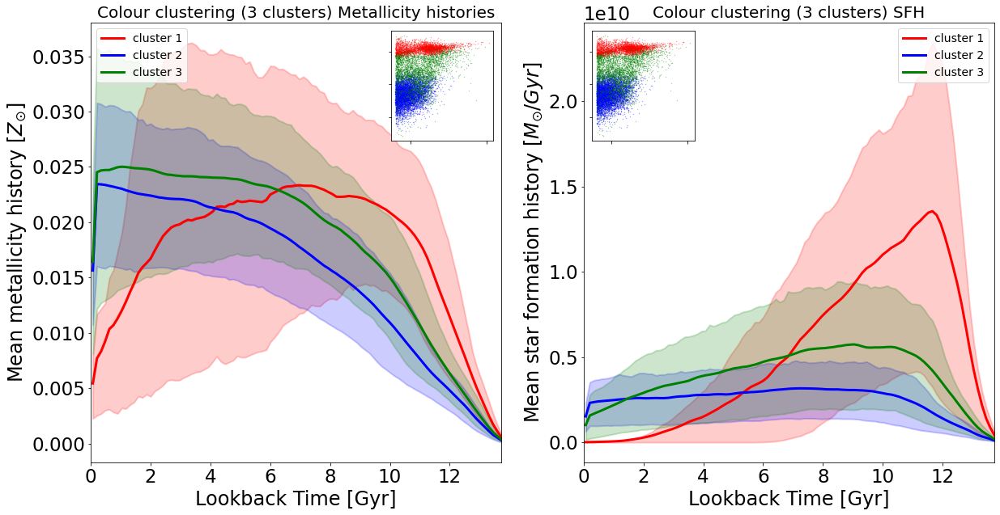

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

941 1046
3073 3415
1216 1352


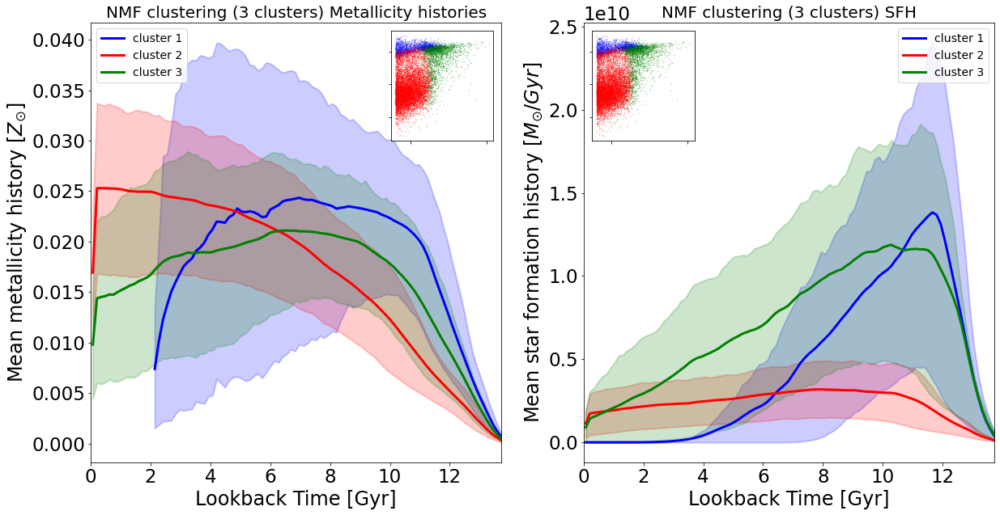

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

2983 3315
1317 1464
930 1034


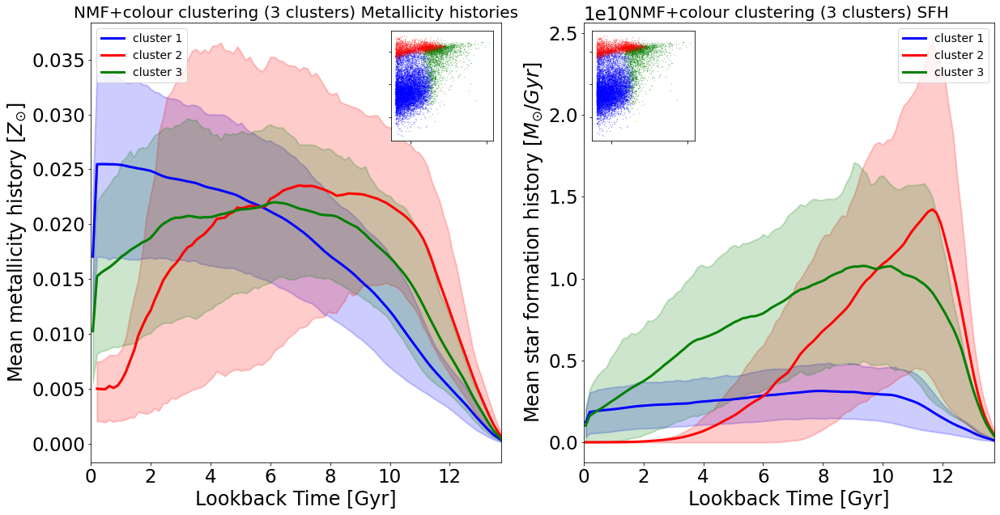

In [119]:
plot_zh_sfh(colour_sample_1,smooth_zh,smooth_sfh,np.diff(sfht)[0],'Colour clustering (3 clusters) ',upper,lower,'A')
plot_zh_sfh(nmf_sample,smooth_zh,smooth_sfh,np.diff(sfht)[0],'NMF clustering (3 clusters) ',upper,lower,'B')
plot_zh_sfh(NMF_color,smooth_zh,smooth_sfh,np.diff(sfht)[0],'NMF+colour clustering (3 clusters) ',upper,lower,'C')













In [120]:
MWage=MassStuff['tMass'][()]

In [121]:
MWage.shape

(12535,)

In [122]:
MWage

array([10.57281397, 10.84022218,  9.83833575, ...,  6.6645559 ,
        6.62355311,  6.1959102 ])

In [123]:
np.sum(sfh[5,:]*sfht[::-1])/np.sum(sfh[5,:])

3.9882612869401664

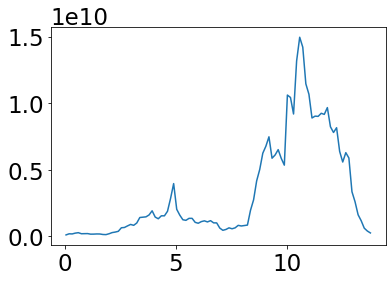

In [124]:
plt.plot(sfht,sfh[5,:])

In [125]:
sfh.shape[1]

100

In [126]:
def stellar_MWage(sfh,sfht):
    SMWage = np.zeros(sfh.shape[0])
    # Mass weighted age
    # Multiply for each bin, the age of the bin * mass formed in that bin / normalize by stellar mass formed.
    for i in range(sfh.shape[0]):
        SMWage[i] = np.sum(sfh[i,:] * sfht) / np.sum(sfh[i,:]) # code this up!
        
    return SMWage

def massw_Z(zh,sfh,sfht):
    
    ZWage = np.zeros(sfh.shape[0])
    
    for i in range(sfh.shape[0]):
        ZWage[i] = np.sum(sfh[i,:]*zh[i,:])/np.sum(sfh[i,:])
        
    return ZWage
    # Mass weighted metallicty, swap age for Z. Take metallicty of stars formed in that bin, then divide by total stellar mass formed.
    

In [127]:
mass_weighted_qtys = np.zeros((3,21))

In [128]:
mass_weighted_qtys[:,:3]

array([[0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.]])

In [129]:
smooth_sfh

array([[1.77202400e+08, 2.61044523e+08, 2.57840448e+08, ...,
        2.59061187e+10, 1.50718819e+10, 7.18693990e+09],
       [4.28146360e+07, 6.48137827e+07, 7.44251280e+07, ...,
        2.99069167e+09, 2.07163665e+09, 1.12431377e+09],
       [1.40212979e+09, 1.98378304e+09, 1.83317120e+09, ...,
        8.84663910e+09, 3.71143475e+09, 1.35106833e+09],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.83729493e+07, 1.01123413e+07, 7.30862933e+06],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.07629227e+07, 1.13754453e+07, 7.16612267e+06],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.47077120e+07, 9.29262933e+06, 4.33442133e+06]])

In [130]:
SMW = stellar_MWage(smooth_sfh,sfht)
print(np.mean(SMW[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)]))

MWZ = massw_Z(smooth_zh,smooth_sfh,sfht)
print(np.mean(MWZ[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)]))



9.907740087001248
0.021522113385687887


In [131]:
mass_weighted_qtys[:,4] = np.mean(SMW[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)])

In [132]:
mass_weighted_qtys[:,3] = np.mean(SMW[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,4] = np.mean(SMW[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,5] = np.mean(SMW[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)])

In [133]:
mass_weighted_qtys[:,3:6].T

array([[9.90774009, 0.02152211, 7.67577156],
       [6.25945953, 0.01747798, 9.08591686],
       [8.27148584, 0.01937388, 8.88264194]])

In [134]:
xerr_low = np.percentile(SMW[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)],16,axis = 0)
xerr_low

8.702816918298598

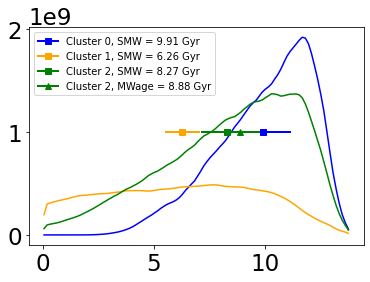

In [135]:
plt.plot(sfht,np.mean(smooth_sfh[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)],axis=0),color='blue')
xerr_low = np.mean(SMW[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)],axis =0)-np.percentile(SMW[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)],16,axis = 0)
xerr_high =np.percentile(SMW[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)],84,axis = 0)-np.mean(SMW[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)],axis =0)
errors = np.zeros((2,1))
errors[0] = xerr_low
errors[1] = xerr_high
plt.errorbar(np.mean(SMW[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)],axis =0),\
             y = 1e9,xerr = errors,lw =2,marker ='s',color='blue',label = 'Cluster 0, SMW = %.2f Gyr'%(np.mean(SMW[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)],axis =0)))




plt.plot(sfht,np.mean(smooth_sfh[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)],axis=0),color='orange')
xerr_low = np.mean(SMW[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)],axis =0)-np.percentile(SMW[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)],16,axis = 0)
xerr_high =np.percentile(SMW[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)],84,axis = 0)-np.mean(SMW[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)],axis =0)
errors = np.zeros((2,1))
errors[0] = xerr_low
errors[1] = xerr_high
plt.errorbar(np.mean(SMW[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)],axis =0),\
             y = 1e9,xerr = errors,lw =2,marker ='s',color='orange',label = 'Cluster 1, SMW = %.2f Gyr'%(np.mean(SMW[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)],axis =0)))


plt.plot(sfht,np.mean(smooth_sfh[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)],axis=0),color='green')
xerr_low = np.mean(SMW[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)],axis =0)-np.percentile(SMW[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)],16,axis = 0)
xerr_high =np.percentile(SMW[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)],84,axis = 0)-np.mean(SMW[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)],axis =0)
errors = np.zeros((2,1))
errors[0] = xerr_low
errors[1] = xerr_high
plt.errorbar(np.mean(SMW[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)],axis =0),\
             y = 1e9,xerr = errors,lw =2,marker ='s',color='green',label = 'Cluster 2, SMW = %.2f Gyr'%(np.mean(SMW[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)],axis =0)))


plt.errorbar(np.mean(MWage[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)],axis =0),\
             y = 1e9,xerr = errors,lw =2,marker ='^',color='green',label = 'Cluster 2, MWage = %.2f Gyr'%(np.mean(MWage[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)],axis =0)))


plt.legend()

In [136]:
mass_weighted_qtys[0,0]

0.0

In [137]:
print(np.percentile(SMW[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)],16))
print(np.percentile(SMW[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)],84))

8.702816918298598
11.170075128260489


[[-8.15509498]
 [10.88549812]]


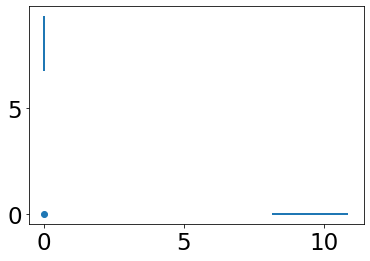

In [138]:
xerrs = np.zeros((2,1))
xerrs[0] =mass_weighted_qtys[0,0]-1*np.percentile(SMW[(colour_sample_1_smooth==0)&(logMs>lower)&(logMs<=upper)],16) 
xerrs[1] = np.percentile(SMW[(colour_sample_1_smooth==0)&(logMs>lower)&(logMs<=upper)],84)-mass_weighted_qtys[0,0]
yerrs = np.zeros((2,1))
yerrs[1] =np.percentile(MWage[(colour_sample_1_smooth==0)&(logMs>lower)&(logMs<=upper)],84)- mass_weighted_qtys[2,0]
yerrs[0] = mass_weighted_qtys[2,0]-np.percentile(MWage[(colour_sample_1_smooth==0)&(logMs>lower)&(logMs<=upper)],16)


plt.errorbar(mass_weighted_qtys[0,0],y = mass_weighted_qtys[2,0],xerr=xerrs,yerr = yerrs,lw=2, marker = 'o')






print(xerrs)

[[-5.40402565]
 [ 7.11021471]]


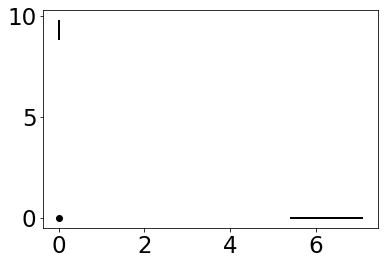

In [139]:
xerrs = np.zeros((2,1))
xerrs[1] =np.percentile(SMW[(colour_sample_1_smooth==1)&(logMs>lower)&(logMs<=upper)],84)- mass_weighted_qtys[0,1]
xerrs[0] = mass_weighted_qtys[0,1]-np.percentile(SMW[(colour_sample_1_smooth==1)&(logMs>lower)&(logMs<=upper)],16)

yerrs = np.zeros((2,1))
yerrs[1] =np.percentile(MWage[(colour_sample_1_smooth==1)&(logMs>lower)&(logMs<=upper)],84)- mass_weighted_qtys[2,1]
yerrs[0] = mass_weighted_qtys[2,1]-np.percentile(MWage[(colour_sample_1_smooth==1)&(logMs>lower)&(logMs<=upper)],16)


plt.errorbar(mass_weighted_qtys[0,1],y = mass_weighted_qtys[2,1],xerr=xerrs,yerr = yerrs,lw=2, marker = 'o',color='black')
print(xerrs)

In [140]:
def plot_weighted_ages(mweighted_arr,labels,weights1,weights2,lower,upper,case,w1,w2):
    Ncases = np.unique(labels).shape[0]
    f,ax = plt.subplots(1,1,figsize=(10,10))
    if case == 'B':
        cIDX = 3
    elif case =='A':
        cIDX = 0
    elif case =='C':
        cIDX = 6
    elif case =='D':
        cIDX = 9
        
    elif case =='E':
        cIDX = 13
        
    elif case =='F':
        cIDX = 17
        

        
    
    for i in range(Ncases):
        xerrs = np.zeros((2,1))
        xerrs[0] = mweighted_arr[w1,cIDX+i]-np.percentile(weights1[(labels==i)&(logMs>lower)&(logMs<=upper)],16)
        xerrs[1] = np.percentile(weights1[(labels==i)&(logMs>lower)&(logMs<=upper)],84)- mweighted_arr[w1,cIDX+i]
        #print(np.percentile(weights1[(labels==i)&(logMs>lower)&(logMs<=upper)],16),mweighted_arr[w1,cIDX+i],np.percentile(weights1[(labels==i)&(logMs>lower)&(logMs<=upper)],84))
        #print(np.percentile(weights2[(labels==i)&(logMs>lower)&(logMs<=upper)],16),mweighted_arr[w2,cIDX+i],np.percentile(weights2[(labels==i)&(logMs>lower)&(logMs<=upper)],84))
        yerrs = np.zeros((2,1))
        yerrs[0] = mweighted_arr[w2,cIDX+i]- np.percentile(weights2[(labels==i)&(logMs>lower)&(logMs<=upper)],16) 
        yerrs[1] = np.percentile(weights2[(labels==i)&(logMs>lower)&(logMs<=upper)],84)-mweighted_arr[w2,cIDX+i]
        #print(w2,cIDX+i)
        print('XERR',xerrs,'YERR',yerrs)
        print(mweighted_arr[w1,cIDX+i],'X',mweighted_arr[w2,cIDX+i],'Y')
        plt.errorbar( mweighted_arr[w1,cIDX+i],y =  mweighted_arr[w2,cIDX+i],xerr=xerrs,yerr = yerrs,lw=2, marker = 'o',label = '%i'%(i))
        plt.scatter(weights1[(labels==i)&(logMs>lower)&(logMs<=upper)],weights2[(labels==i)&(logMs>lower)&(logMs<=upper)],alpha=0.03)
    plt.legend() 
    plt.grid()

    return f,ax 



In [141]:
nmf_sample_4_smooth

array([3, 3, 2, ..., 3, 3, 3])

In [142]:
### SFH reconstruction ###
# Done once we are happy with our NMF (above) with training + test data: #

model_real = NMF(n_components= 4, init='random', random_state=1)
new_scaler = MinMaxScaler()
Xs = sklearn.preprocessing.normalize(np.vstack((smooth_sfh)),axis=1,norm='max') #new_scaler.fit_transform(np.vstack((smooth_sfh))) #intNORMSFH#sklearn.preprocessing.normalize(np.vstack((smooth_sfh)),axis=1,norm='max')
#print(np.shape(Xs))
X_trains, X_tests = train_test_split(Xs, test_size=0.2, random_state=1)#z_train,z_test = train_test_split(X, y, z,test_size=0.2, random_state=1)
#print(np.shape(X_trains))
X_trains, X_vals  = train_test_split(X_trains,test_size=0.25, random_state=1)#z_train,z_val= train_test_split(X_train, y_train,z_train,test_size=0.25, random_state=1)
#print(np.shape(X_trains))
W = model_real.fit(Xs)
    #print(np.shape(H),i)
H = model_real.components_
#print(np.shape(W))

#ReconData = model_real.inverse_transform(W)
ReconTest = model_real.inverse_transform(model_real.transform(X_tests))

(10028, 100)
(7521, 100)
5669
(7521, 100)


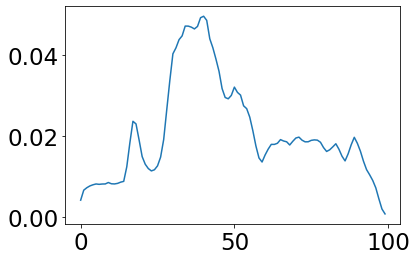

In [143]:
comps = 4
from sklearn.decomposition import NMF
from sklearn.preprocessing import normalize,MinMaxScaler,RobustScaler,StandardScaler,MaxAbsScaler
modelZ = NMF(n_components= comps, init='random', random_state=0)
XZ = (np.vstack((smooth_zh)))
XZrough = (np.vstack((zh)))
plt.plot(XZ[0])

# train -test - validation split
XZ_train, XZ_test = train_test_split(XZ, test_size=0.2, random_state=1)
print(np.shape(XZ_train))

XZ_train, XZ_val  = train_test_split(XZ_train,test_size=0.25, random_state=1)

print(np.shape(XZ_train))

#NMF decomposition
WZ = modelZ.fit_transform(XZ_train) # build model with training data / populate weight arrays
HZ = modelZ.components_ # load its components
WfZ = modelZ.transform(XZ)
WTZ = modelZ.transform(XZ_test) # transformed test data


XZtrecon = modelZ.inverse_transform(WZ) # Reconstructing the SFH from training data
XZrecon = modelZ.inverse_transform(WfZ)

XZtestrecon= modelZ.inverse_transform(WTZ)
# Building a model: nomralize and fit SFH

idxZ = np.random.randint(0,np.size(XZ_train[:,0]))
print(idxZ)
print(np.shape(XZ_train))




(12535, 100)
sampling galaxy:  5634
sampling galaxy:  271
sampling galaxy:  5658


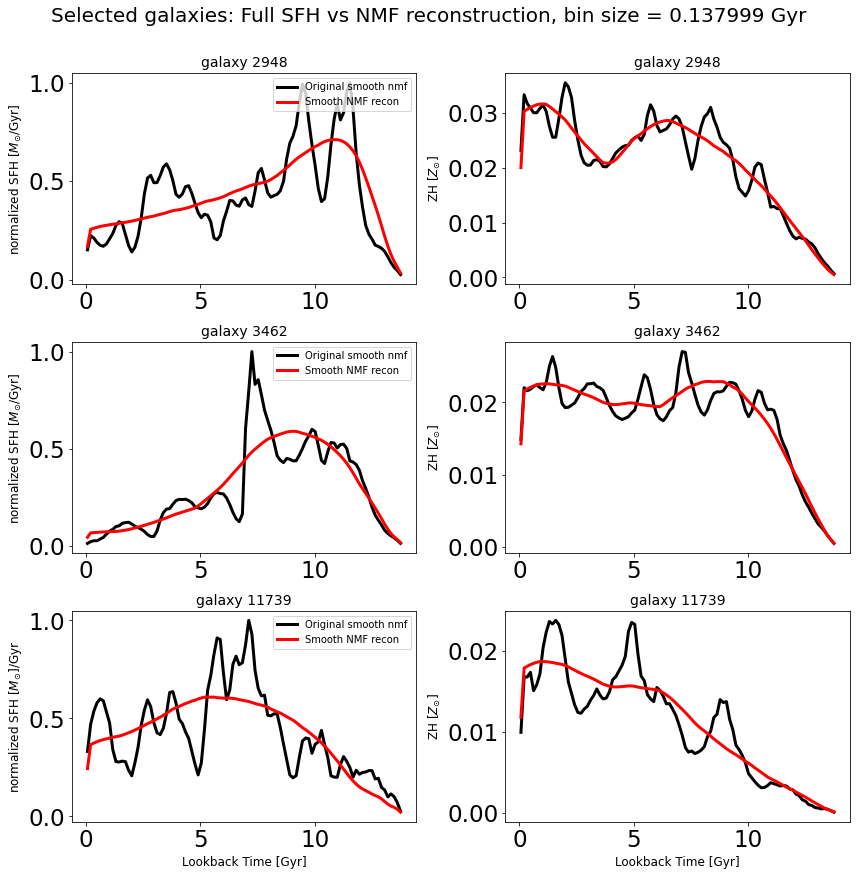

In [144]:
figs,axs = plt.subplots(3,2,figsize =(12,12))
plt.suptitle('Selected galaxies: Full SFH vs NMF reconstruction, bin size = %f Gyr'%(sfht[1]-sfht[0]),x = 0.5,y = 1.01, fontsize = 20)
IDs = np.arange(0,12535)
indx=np.random.choice(IDs,3,replace =False)
Xsrecon =model_real.inverse_transform(WSFH_smooth)

print(Xsrecon.shape)
for i in range(0,3):
    
    idx = np.random.randint(0,np.size(X_train[:,0]))


    print('sampling galaxy: ', idx)

    axIDX_0 = i
    axIDX_1 = 0

    plt.axes(axs[axIDX_0,axIDX_1])
    #print(np.shape(X_train),np.shape(sfht))
    idx = indx[i]
    axs[i,0].set_title('galaxy %i'%(idx),fontsize = 14)
    axs[i,1].set_title('galaxy %i'%(idx),fontsize = 14)
    #plt.yscale('log')

    plt.plot(sfht,Xs[idx],color='black',label = 'Original smooth nmf', lw =3)

    plt.plot(sfht,Xsrecon[idx],color = 'red',label = 'Smooth NMF recon', lw =3)
    
    
    axs[i,1].plot(sfht,XZ[idx],color='black',label = 'Original smooth nmf', lw =3)
    axs[i,1].plot(sfht,XZrecon[idx],color = 'red',label = 'Smooth NMF recon', lw =3)
    #plt.plot(sfht,Xtrecon[idx],color = 'red',label = 'NMF Reconstruction' )
    axs[i,0].set_ylabel('normalized SFH [$M_{\odot}$/Gyr]',fontsize =12)
    axs[i,1].set_ylabel('ZH [$Z_{\odot}$]',fontsize =12)
    plt.legend(loc ='upper right')
    plt.tight_layout()



plt.ylabel('normalized SFH [$M_{\odot}$]/Gyr',fontsize =12)
axs[-1,0].set_xlabel('Lookback Time [Gyr]',fontsize =12)

axs[-1,1].set_xlabel('Lookback Time [Gyr]',fontsize =12)

plt.tight_layout()


XERR [[-8.15509498]
 [10.88549812]] YERR [[-0.01811096]
 [ 0.02302798]]
0.0 X 0.0 Y
XERR [[-5.40402565]
 [ 7.11021471]] YERR [[-0.01420394]
 [ 0.01888225]]
0.0 X 0.0 Y
XERR [[-6.04201138]
 [ 8.01422746]] YERR [[-0.01705109]
 [ 0.02079573]]
0.0 X 0.0 Y


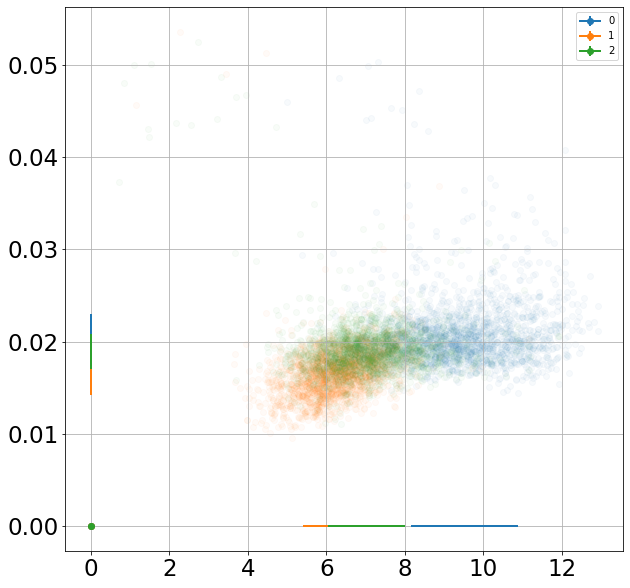

B
XERR [[1.20492317]
 [1.26233504]] YERR [[0.00306398]
 [0.00259501]]
9.907740087001248 X 0.021522113385687887 Y
XERR [[0.78004452]
 [0.82426841]] YERR [[0.00274578]
 [0.00234722]]
6.259459526429771 X 0.017477977275597207 Y
XERR [[1.15043988]
 [1.19284613]] YERR [[0.00213419]
 [0.00175593]]
8.27148583714492 X 0.019373880911399702 Y


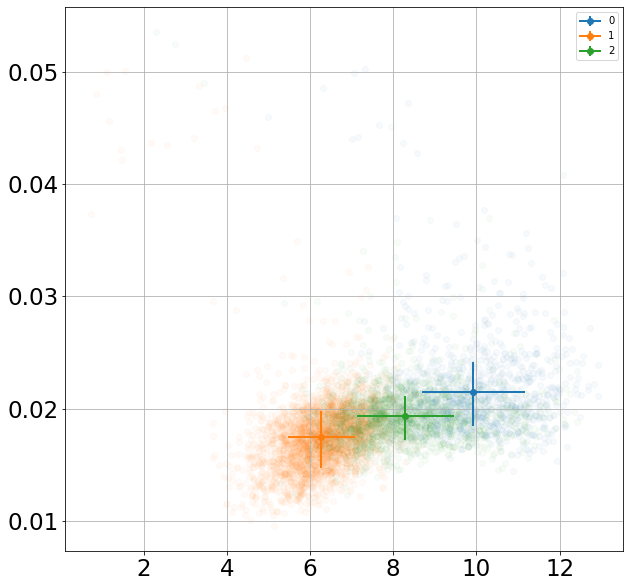

XERR [[1.20492317]
 [1.26233504]] YERR [[1.33295117]
 [1.44664592]]
9.907740087001248 X 7.675771562507814 Y
XERR [[0.78004452]
 [0.82426841]] YERR [[0.55178035]
 [0.63784087]]
6.259459526429771 X 9.085916863464474 Y
XERR [[1.15043988]
 [1.19284613]] YERR [[0.71464427]
 [0.6973334 ]]
8.27148583714492 X 8.882641939939816 Y


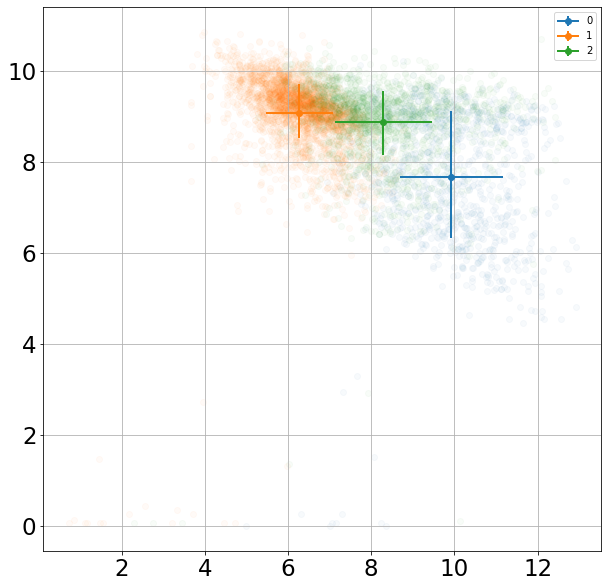

XERR [[-5.45844512]
 [ 7.05690437]] YERR [[-0.01467801]
 [ 0.0197395 ]]
0.0 X 0.0 Y
XERR [[-8.53704603]
 [11.04391424]] YERR [[-0.01824386]
 [ 0.02334331]]
0.0 X 0.0 Y
XERR [[-6.94640394]
 [ 8.77788009]] YERR [[-0.01707206]
 [ 0.02102869]]
0.0 X 0.0 Y


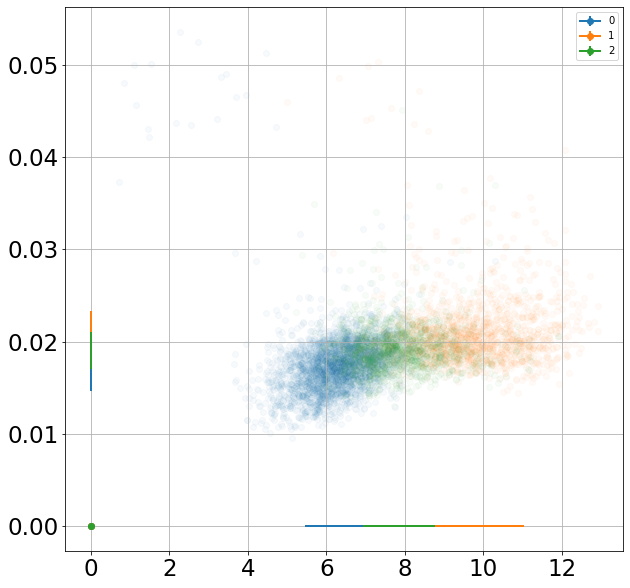

C-MWage
XERR [[-0.01467801]
 [ 0.0197395 ]] YERR [[-5.45844512]
 [ 7.05690437]]
0.0 X 0.0 Y
XERR [[-0.01824386]
 [ 0.02334331]] YERR [[-8.53704603]
 [11.04391424]]
0.0 X 0.0 Y
XERR [[-0.01707206]
 [ 0.02102869]] YERR [[-6.94640394]
 [ 8.77788009]]
0.0 X 0.0 Y


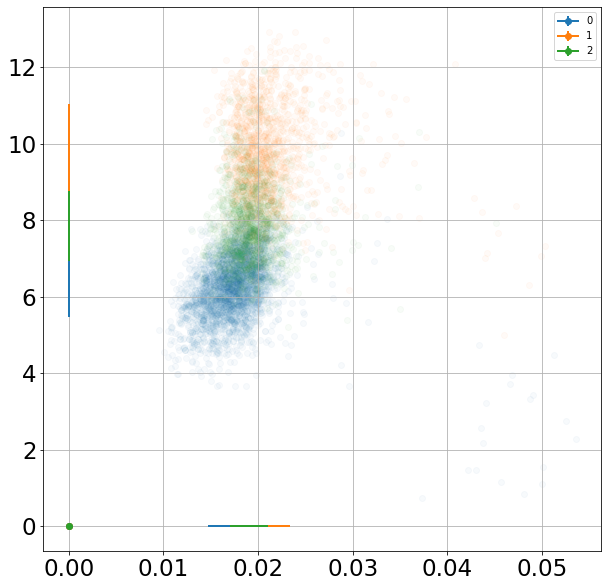

E-SMW
XERR [[-0.01416379]
 [ 0.01940206]] YERR [[-5.18447306]
 [ 6.45836075]]
0.0 X 0.0 Y
XERR [[-0.01906576]
 [ 0.02547869]] YERR [[-9.73843983]
 [11.51660808]]
0.0 X 0.0 Y
XERR [[-0.01628407]
 [ 0.02052889]] YERR [[-6.47045896]
 [ 7.98468809]]
0.0 X 0.0 Y
XERR [[-0.01785864]
 [ 0.02195786]] YERR [[-8.23757259]
 [10.55221168]]
0.0 X 0.0 Y


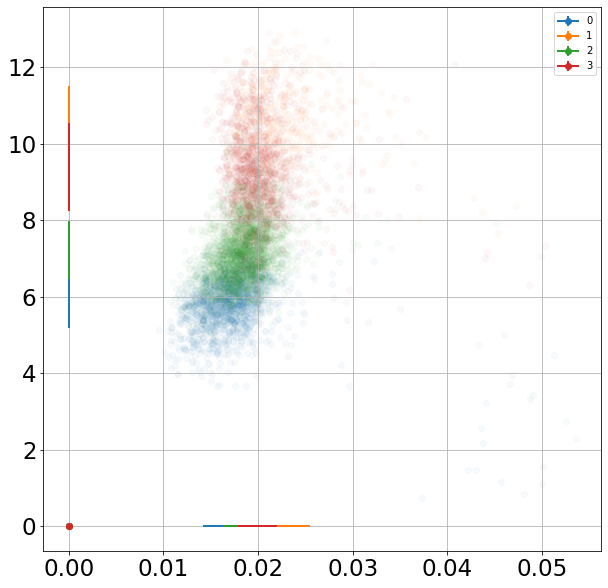

E-MWage
XERR [[-0.01416379]
 [ 0.01940206]] YERR [[-8.65979097]
 [ 9.83659496]]
0.0 X 0.0 Y
XERR [[-0.01906576]
 [ 0.02547869]] YERR [[-5.78309395]
 [ 8.87150697]]
0.0 X 0.0 Y
XERR [[-0.01628407]
 [ 0.02052889]] YERR [[-8.35960737]
 [ 9.50259307]]
0.0 X 0.0 Y
XERR [[-0.01785864]
 [ 0.02195786]] YERR [[-7.36072225]
 [ 9.4480131 ]]
0.0 X 0.0 Y


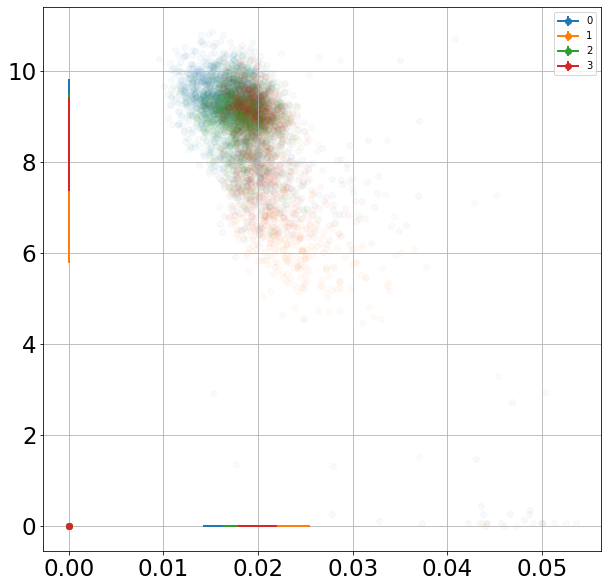

D-MWage
XERR [[-5.02008912]
 [ 7.26626098]] YERR [[-7.89919694]
 [ 9.58578198]]
0.0 X 0.0 Y
XERR [[-8.28033414]
 [10.89800155]] YERR [[-6.80896832]
 [ 9.31579404]]
0.0 X 0.0 Y
XERR [[-5.5218323 ]
 [ 7.22390661]] YERR [[-8.71140758]
 [ 9.72312439]]
0.0 X 0.0 Y
XERR [[-6.61227686]
 [ 8.7961024 ]] YERR [[-7.89187373]
 [ 9.61488956]]
0.0 X 0.0 Y


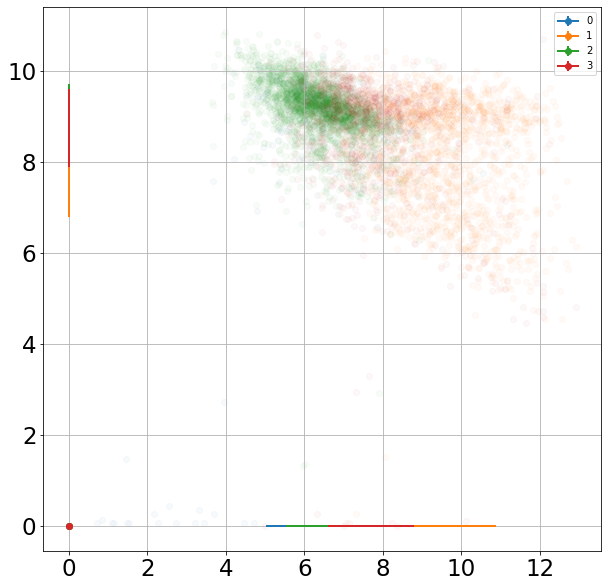

In [145]:
plot_weighted_ages(mass_weighted_qtys,colour_sample_1_smooth,SMW,MWZ,10,11,'A',0,1)
plt.show()
print('B')
plot_weighted_ages(mass_weighted_qtys,nmf_sample_smooth,SMW,MWZ,10,11,'B',0,1)
plt.show()

plot_weighted_ages(mass_weighted_qtys,nmf_sample_smooth,SMW,MWage,10,11,'B',0,2)
plt.show()

plot_weighted_ages(mass_weighted_qtys,NMF_color_smooth,SMW,MWZ,10,11,'C',0,1)
plt.show()

print('C-MWage')
plot_weighted_ages(mass_weighted_qtys,NMF_color_smooth,MWZ,SMW,10,11,'C',1,0)
plt.show()

print('E-SMW')
plot_weighted_ages(mass_weighted_qtys,nmf_sample_4_smooth,MWZ,SMW,10,11,'E',1,0)
plt.show()

print('E-MWage')
plot_weighted_ages(mass_weighted_qtys,nmf_sample_4_smooth,MWZ,MWage,10,11,'E',1,2)
plt.show()

print('D-MWage')
plot_weighted_ages(mass_weighted_qtys,colour_sample_2_smooth,SMW,MWage,10,11,'D',0,2)
plt.show()
#plot_weight
#plot_weighted_ages(mass_weighted_qtys,colour_sample_2_smooth,SMW,MWage,10,11,'D',0,2)

In [146]:
mass_weighted_qtys[:,0] = np.mean(SMW[(colour_sample_1_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(colour_sample_1_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(colour_sample_1_smooth==0)&(logMs>lower)&(logMs<=upper)])

# each row: SMW, MWZ, MWage

mass_weighted_qtys[:,1] = np.mean(SMW[(colour_sample_1_smooth==1)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(colour_sample_1_smooth==1)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(colour_sample_1_smooth==1)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,2] = np.mean(SMW[(colour_sample_1_smooth==2)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(colour_sample_1_smooth==2)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(colour_sample_1_smooth==2)&(logMs>lower)&(logMs<=upper)])

mass_weighted_qtys[:,3] = np.mean(SMW[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,4] = np.mean(SMW[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,5] = np.mean(SMW[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(nmf_sample_smooth==2)&(logMs>lower)&(logMs<=upper)])

mass_weighted_qtys[:,6] = np.mean(SMW[(NMF_color_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(NMF_color_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(NMF_color_smooth==0)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,7] = np.mean(SMW[(NMF_color_smooth==1)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(NMF_color_smooth==1)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(NMF_color_smooth==1)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,8] = np.mean(SMW[(NMF_color_smooth==2)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(NMF_color_smooth==2)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(NMF_color_smooth==2)&(logMs>lower)&(logMs<=upper)])


mass_weighted_qtys[:,9] = np.mean(SMW[(colour_sample_2_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(colour_sample_2_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(colour_sample_2_smooth==0)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,10] = np.mean(SMW[(colour_sample_2_smooth==1)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(colour_sample_2_smooth==1)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(colour_sample_2_smooth==1)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,11] = np.mean(SMW[(colour_sample_2_smooth==2)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(colour_sample_2_smooth==2)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(colour_sample_2_smooth==2)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,12] = np.mean(SMW[(colour_sample_2_smooth==3)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(colour_sample_2_smooth==3)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(colour_sample_2_smooth==3)&(logMs>lower)&(logMs<=upper)])

mass_weighted_qtys[:,13] = np.mean(SMW[(nmf_sample_4_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(nmf_sample_4_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(nmf_sample_4_smooth==0)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,14] = np.mean(SMW[(nmf_sample_4_smooth==1)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(nmf_sample_4_smooth==1)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(nmf_sample_4_smooth==1)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,15] = np.mean(SMW[(nmf_sample_4_smooth==2)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(nmf_sample_4_smooth==2)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(nmf_sample_4_smooth==2)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,16] = np.mean(SMW[(nmf_sample_4_smooth==3)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(nmf_sample_4_smooth==3)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(nmf_sample_4_smooth==3)&(logMs>lower)&(logMs<=upper)])

mass_weighted_qtys[:,17] = np.mean(SMW[(NMF_color_4_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(NMF_color_4_smooth==0)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(NMF_color_4_smooth==0)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,18] = np.mean(SMW[(NMF_color_4_smooth==1)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(NMF_color_4_smooth==1)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(NMF_color_4_smooth==1)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,19] = np.mean(SMW[(NMF_color_4_smooth==2)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(NMF_color_4_smooth==2)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(NMF_color_4_smooth==2)&(logMs>lower)&(logMs<=upper)])
mass_weighted_qtys[:,20] = np.mean(SMW[(NMF_color_4_smooth==3)&(logMs>lower)&(logMs<=upper)]),\
                            np.mean(MWZ[(NMF_color_4_smooth==3)&(logMs>lower)&(logMs<=upper)]),\
                                np.mean(MWage[(NMF_color_4_smooth==3)&(logMs>lower)&(logMs<=upper)])

In [147]:
mass_weighted_qtys[0,1]
for i in range(3):
    print('----------------------------------------------------------')
    print(np.percentile(SMW[(colour_sample_1_smooth==i)&(logMs>lower)&(logMs<=upper)],84))
    print((mass_weighted_qtys[0,i]))
    print(np.percentile(SMW[(colour_sample_1_smooth==i)&(logMs>lower)&(logMs<=upper)],16))
    print('----------------------------------------------------------')

----------------------------------------------------------
10.88549812157256
9.480128171994874
8.1550949842507
----------------------------------------------------------
----------------------------------------------------------
7.110214705367348
6.244271770310956
5.404025647051125
----------------------------------------------------------
----------------------------------------------------------
8.014227456106497
7.007260810804608
6.042011381514276
----------------------------------------------------------


In [148]:
mass_weighted_qtys[0,1]
for i in range(3):
    print('----------------------------------------------------------')
    print(np.percentile(MWZ[(nmf_sample_smooth==i)&(logMs>lower)&(logMs<=upper)],84))
    print((mass_weighted_qtys[1,3+i]))
    print(np.percentile(MWZ[(nmf_sample_smooth==i)&(logMs>lower)&(logMs<=upper)],16))
    print('----------------------------------------------------------')

----------------------------------------------------------
0.024117123771302176
0.021522113385687887
0.01845813696940842
----------------------------------------------------------
----------------------------------------------------------
0.01982519426369095
0.017477977275597207
0.014732196982876618
----------------------------------------------------------
----------------------------------------------------------
0.02112981076845396
0.019373880911399702
0.017239694318646227
----------------------------------------------------------


In [149]:
mass_weighted_qtys.T

array([[ 9.48012817,  0.02083574,  8.12214644],
       [ 6.24427177,  0.01663505,  9.21886992],
       [ 7.00726081,  0.01916646,  8.89619176],
       [ 9.90774009,  0.02152211,  7.67577156],
       [ 6.25945953,  0.01747798,  9.08591686],
       [ 8.27148584,  0.01937388,  8.88264194],
       [ 6.23437873,  0.01743615,  9.12005342],
       [ 9.76256828,  0.02104537,  7.99118125],
       [ 7.8495436 ,  0.01920069,  8.85114811],
       [ 6.07844822,  0.02159954,  8.33925952],
       [ 9.55351304,  0.02039693,  8.17415138],
       [ 6.36024977,  0.0171939 ,  9.17438373],
       [ 7.71503241,  0.01986677,  8.7011166 ],
       [ 5.81147726,  0.01709229,  9.18652251],
       [10.59664905,  0.02255216,  7.07937642],
       [ 7.2232287 ,  0.01853235,  8.92826101],
       [ 9.32840067,  0.02021813,  8.4806057 ],
       [ 6.18261939,  0.01736002,  9.14010212],
       [ 9.36343737,  0.02030309,  8.39361475],
       [ 7.76318043,  0.01920881,  8.84222421],
       [10.60414141,  0.02256966,  7.081

In [150]:
np.mean(MWage[(colour_sample_1_smooth==0)&(logMs>lower)&(logMs<=upper)])

8.122146438988073

In [151]:
mass_weighted_qtys[:,:3].T

array([[9.48012817, 0.02083574, 8.12214644],
       [6.24427177, 0.01663505, 9.21886992],
       [7.00726081, 0.01916646, 8.89619176]])

In [152]:
mass_weighted_qtys[:,3:6].T

array([[9.90774009, 0.02152211, 7.67577156],
       [6.25945953, 0.01747798, 9.08591686],
       [8.27148584, 0.01937388, 8.88264194]])

In [153]:
mass_weighted_qtys[:,6:9].T

array([[6.23437873, 0.01743615, 9.12005342],
       [9.76256828, 0.02104537, 7.99118125],
       [7.8495436 , 0.01920069, 8.85114811]])

In [154]:
def plot_MWAGE(Mwage,labels,upper,lower):
    for i in range((np.unique(labels).shape[0])):
        #print(i)
        plt.hist(Mwage[(labels==i)&(logMs>lower)&(logMs<=upper)],bins=np.linspace(0,13.8,100),lw=3,histtype='step')
        print(np.round(np.mean(Mwage[(labels==i)&(logMs>lower)&(logMs<=upper)]),decimals = 4))
        print(np.round(np.mean(Mwage[(labels==i)&(logMs>lower)&(logMs<=upper)]),decimals = 4)-np.round(np.percentile(Mwage[(labels==i)&(logMs>lower)&(logMs<=upper)],16),decimals = 4))
        print(np.round(np.percentile(Mwage[(labels==i)&(logMs>lower)&(logMs<=upper)],84),decimals = 4)-np.round(np.mean(Mwage[(labels==i)&(logMs>lower)&(logMs<=upper)]),decimals = 4))
        print('======================')
        
    plt.show()

8.9117
0.6263000000000005
0.5839999999999996
7.5557
1.3467000000000002
1.4979999999999993
9.0099
0.6576000000000004
0.7330000000000005
9.0562
0.6264000000000003
0.702


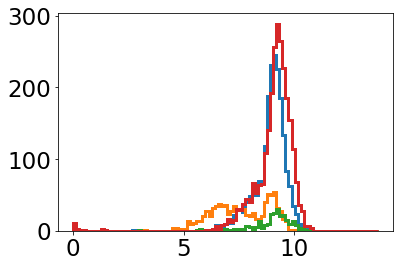

7.6602
1.3209
1.451600000000001
8.9639
0.6493000000000002
0.6400999999999986
9.132
0.5635999999999992
0.6597000000000008


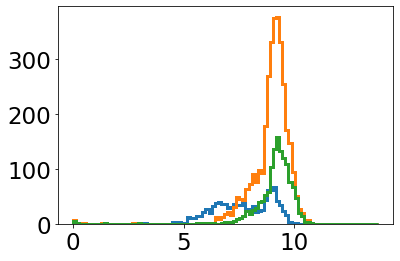

In [155]:
plot_MWAGE(MWage,nmf_sample_4,11,10)
plot_MWAGE(MWage,nmf_sample,11,10)

8.1221
1.3948
1.2086000000000006
9.2189
0.430299999999999
0.5587999999999997
8.8962
0.7036999999999995
0.6983999999999995


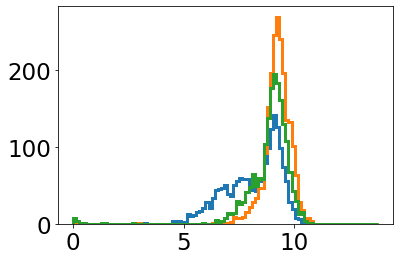

8.3393
0.44009999999999927
1.246500000000001
8.1742
1.3652000000000006
1.1415999999999986
9.1744
0.46300000000000097
0.5487000000000002
8.7011
0.8092000000000006
0.9138000000000002


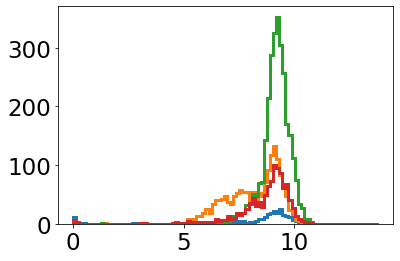

In [156]:
plot_MWAGE(MWage,colour_sample_1,11,10)
plot_MWAGE(MWage,colour_sample_2,11,10)

In [157]:
from scipy import stats

In [158]:
upper = 11
lower= 10
stats.ks_2samp(fM[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)],fM[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)])

KstestResult(statistic=0.11410878008013176, pvalue=2.0438462033922633e-09)

In [159]:
stats.ks_2samp(fStripped[(nmf_sample_smooth==0)&(logMs>lower)&\
                  (logMs<=upper)],fStripped[(nmf_sample_smooth==1)&\
                                     (logMs>lower)&(logMs<=upper)])

KstestResult(statistic=0.090929872428287, pvalue=3.890768385916843e-06)

In [160]:
stats.ks_2samp(fStripped[(nmf_sample_smooth==0)&(logMs>lower)&\
                  (logMs<=upper)],fStripped[(nmf_sample_smooth==2)&\
                                     (logMs>lower)&(logMs<=upper)])

KstestResult(statistic=0.22892484933240104, pvalue=1.3103842802120166e-30)

In [161]:
stats.ks_2samp(fStripped[(nmf_sample_smooth==1)&(logMs>lower)&\
                  (logMs<=upper)],fStripped[(nmf_sample_smooth==2)&\
                                     (logMs>lower)&(logMs<=upper)])

KstestResult(statistic=0.15310036141744954, pvalue=1.7763568394002505e-15)

In [162]:
fM[(nmf_sample_smooth==0)&(logMs>lower)&(logMs<=upper)].shape

(1065,)

In [163]:
fM[(nmf_sample_smooth==1)&(logMs>lower)&(logMs<=upper)].shape

(3056,)

In [164]:
Dalpha = 1.36* np.sqrt((3056+1065)/(3056*1065))
Dalpha, # so null hypothesis is NOT rejected for p ~ 0.05

(0.04839368984813738,)

In [165]:
#Or do we just care if p < some value --> assigns significance?

In [166]:
#Or do we just care if p < some value --> assigns significance

In [167]:
#Or do we just care if p < some value --> assigns significance

In [168]:
#Or do we just care if p < some value --> assigns significance

In [169]:
KS_res = ks_test(fM,nmf_sample,11,10)
        

0 1
0.07830457799215586 0.0001013036865122885 0 1
0 2
0.3474987837577924 3.63785600757142e-64 0 2
1 2
0.3801123220736916 2.3358514700210107e-126 1 2


In [170]:
KS_res.T

array([[7.83045780e-002, 1.01303687e-004],
       [3.47498784e-001, 3.63785601e-064],
       [3.80112322e-001, 2.33585147e-126]])

In [171]:
KS_res = ks_test(fM,nmf_sample_4,11,10)

0 1
0.12479764138300724 5.1328579164788835e-09 0 1
0 2
0.5848544453186467 2.220446049250313e-16 0 2
0 3
0.2961612284069098 1.1431640225762087e-89 0 3
1 2
0.4848812477844736 2.220446049250313e-16 1 2
1 3
0.22873594735398958 1.7700034459236761e-31 1 3
2 3
0.3839189523868491 0.0 2 3


In [172]:
KS_res.T

array([[1.24797641e-01, 5.13285792e-09],
       [5.84854445e-01, 2.22044605e-16],
       [2.96161228e-01, 1.14316402e-89],
       [4.84881248e-01, 2.22044605e-16],
       [2.28735947e-01, 1.77000345e-31],
       [3.83918952e-01, 0.00000000e+00]])

In [173]:
KS_res = ks_test(fM,colour_sample_1,11,10)

0 1
0.09540956572345281 2.767149487326037e-08 0 1
0 2
0.086208976585456 2.0347614156923655e-06 0 2
1 2
0.07358469644345403 4.259862674804715e-05 1 2


In [174]:
KS_res = ks_test(fM,colour_sample_2,11,10)

0 1
0.13332257774439432 0.0015019708947455745 0 1
0 2
0.1389801055020624 0.0005409146727274328 0 2
0 3
0.17682290790403446 1.4638613007544876e-05 0 3
1 2
0.10461817420844814 1.6163292926307804e-10 1 2
1 3
0.06423707781154048 0.009154889497416163 1 3
2 3
0.13555823920627708 8.696376951888851e-13 2 3


In [175]:
KS_res = ks_test(fM,NMF_color,11,10)

0 1
0.11520658704843854 3.36775052289795e-12 0 1
0 2
0.3898652453095507 2.233141656961977e-108 0 2
1 2
0.3119127268499435 7.066553929561513e-53 1 2


In [176]:
KS_res = ks_test(fM,NMF_color_4,11,10)

0 1
0.1801093146873458 2.2024994296702958e-22 0 1
0 2
0.26764766563604614 3.1086244689504383e-15 0 2
0 3
0.6323779191390154 2.830769317950769e-108 0 3
1 2
0.1525718337394848 0.0 1 2
1 3
0.4558869407874212 7.422082897813607e-51 1 3
2 3
0.4177443772888783 8.881784197001252e-16 2 3


In [177]:
KS_res = ks_test(fM,nmf_sample_4,11,10)

0 1
0.12479764138300724 5.1328579164788835e-09 0 1
0 2
0.5848544453186467 2.220446049250313e-16 0 2
0 3
0.2961612284069098 1.1431640225762087e-89 0 3
1 2
0.4848812477844736 2.220446049250313e-16 1 2
1 3
0.22873594735398958 1.7700034459236761e-31 1 3
2 3
0.3839189523868491 0.0 2 3


In [178]:
KS_res.shape # stat, and p_val.

(2, 6)

In [179]:
KS_arr =np.zeros((2,27))
KS_arr[:,:3]  = ks_test(fM,colour_sample_1,11,10)
KS_arr[:,3:6]  = ks_test(fM,nmf_sample,11,10)
KS_arr[:,6:9]  = ks_test(fM,NMF_color,11,10)
KS_arr[:,9:15]  = ks_test(fM,colour_sample_2,11,10)
KS_arr[:,15:21]  = ks_test(fM,nmf_sample_4,11,10)
KS_arr[:,21:]  = ks_test(fM,NMF_color_4,11,10)


0 1
0.09540956572345281 2.767149487326037e-08 0 1
0 2
0.086208976585456 2.0347614156923655e-06 0 2
1 2
0.07358469644345403 4.259862674804715e-05 1 2
0 1
0.07830457799215586 0.0001013036865122885 0 1
0 2
0.3474987837577924 3.63785600757142e-64 0 2
1 2
0.3801123220736916 2.3358514700210107e-126 1 2
0 1
0.11520658704843854 3.36775052289795e-12 0 1
0 2
0.3898652453095507 2.233141656961977e-108 0 2
1 2
0.3119127268499435 7.066553929561513e-53 1 2
0 1
0.13332257774439432 0.0015019708947455745 0 1
0 2
0.1389801055020624 0.0005409146727274328 0 2
0 3
0.17682290790403446 1.4638613007544876e-05 0 3
1 2
0.10461817420844814 1.6163292926307804e-10 1 2
1 3
0.06423707781154048 0.009154889497416163 1 3
2 3
0.13555823920627708 8.696376951888851e-13 2 3
0 1
0.12479764138300724 5.1328579164788835e-09 0 1
0 2
0.5848544453186467 2.220446049250313e-16 0 2
0 3
0.2961612284069098 1.1431640225762087e-89 0 3
1 2
0.4848812477844736 2.220446049250313e-16 1 2
1 3
0.22873594735398958 1.7700034459236761e-31 1 3
2 3


In [180]:
dKS = { 'KS-statistic':KS_arr[0,:], 'P-value':KS_arr[1,:]}

In [181]:
'{:g}'.format(float('{:.3g}'.format(KS_arr[1,0])))

'2.77e-08'

In [182]:
len(Pair2)

27

In [183]:
import pandas as pd

In [184]:
len(Case)

27

In [185]:
df_KS = pd.DataFrame(data = dKS,index = [Case,Pair1,Pair2])
#df_KS.to_excel("KS_tests.xlsx",
#             sheet_name='ProjectTable')  


In [186]:
KS_arr[0,:].shape

(27,)

In [187]:
import pandas as pd

In [188]:
sfht[:30]

array([0.0690995, 0.2070985, 0.3450975, 0.4830965, 0.6210955, 0.7590945,
       0.8970935, 1.0350925, 1.1730915, 1.3110905, 1.4490895, 1.5870885,
       1.7250875, 1.8630865, 2.0010855, 2.1390845, 2.2770835, 2.4150825,
       2.5530815, 2.6910805, 2.8290795, 2.9670785, 3.1050775, 3.2430765,
       3.3810755, 3.5190745, 3.6570735, 3.7950725, 3.9330715, 4.0710705])

5
76
2
30
4
54
24
30
7
9
16
91
88
69
22
48
10
1
1
2
5
70
57
38
7
4
10
70
42
10
10
10
60
21
5
1
11
10
37
43
74
6
15
44
67
6
8
14
3
4
7
69
1
1
14
2
1
12
8
28
26
4
6
6
14
5
33
3
5
10
2
10
4
11
61
9
17
40
1
1
14
88
1
1
1
29
11
9
9
1
40
22
84
49
12
20
80
67
25
30
43
44
49
30
9
33
37
1
27
28
55
19
64
1
3
33
15
17
24
15
78
22
12
71
28
20
2
18
3
8
3
3
36
8
5
23
23
42
13
13
9
28
75
6
39
52
46
28
28
49
26
2
7
9
10
5
1
4
1
44
76
25
14
66
34
11
5
6
2
1
24
13
10
10
29
12
6
9
65
77
38
12
4
5
1
13
12
7
2
15
1
6
87
21
76
21
67
12
8
48
23
42
28
7
4
27
20
41
3
58
31
20
7
2
9
26
17
42
36
13
43
20
26
1
2
36
1
4
17
84
62
38
61
1
19
4
21
17
83
40
21
8
9
26
9
46
9
24
73
1
5
3
8
8
10
34
18
43
20
46
55
1
15
54
26
34
44
16
60
2
9
19
35
40
27
36
12
54
7
13
84
7
1
50
59
15
1
58
47
1
29
3
3
31
28
19
83
54
5
4
3
67
75
33
71
7
33
36
23
35
1
1
18
4
12
36
72
1
5
3
4
2
32
67
69
30
16
22
10
15
22
54
16
11
16
2
4
29
66
56
8
27
86
24
57
43
38
5
71
45
1
22
4
19
4
28
18
6
8
76
77
12
75
3
36
4
1
9
23
7
20
11
42
2
11
67
46
3


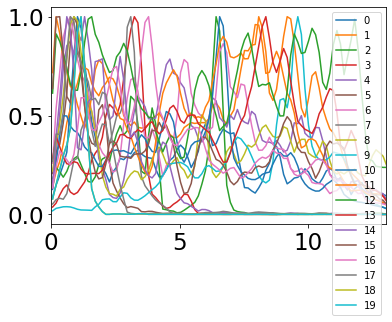

In [189]:

for i in range(20):
    idx = np.random.randint(0,smooth_sfh[colour_sample_2_smooth == 0].shape[0])
# To do.
    plt.plot(sfht,smooth_sfh[colour_sample_2_smooth == 0][idx]/np.max(smooth_sfh[colour_sample_2_smooth == 0][idx]),label =i)
    plt.xlim(0,13)
plt.legend()
counter =0
for i in range(smooth_sfh[colour_sample_2_smooth == 0].shape[0]):
    peakIDX =np.argmax(smooth_sfh[colour_sample_2_smooth == 0][i])
    print(peakIDX)
    if peakIDX <30:
        counter+=1
        
print(counter/smooth_sfh[colour_sample_2_smooth == 0].shape[0])

84
88
47
80
76
81
54
30
51
24
66
83
23
41
82
80
15
76
63
36
18
23
61
46
69
53
60
74
18
72
66
46
44
53
26
76
39
28
41
35
51
55
46
54
55
51
31
50
44
71
43
50
80
48
78
86
92
70
59
10
21
26
46
70
93
13
10
13
64
67
51
24
74
85
37
33
57
24
67
58
17
22
60
79
73
23
57
47
53
72
58
61
85
86
36
84
42
85
75
69
34
47
71
12
79
58
29
70
82
33
51
43
48
16
45
79
50
86
78
92
80
72
40
36
69
76
71
43
80
50
52
35
76
49
61
81
73
77
46
34
80
92
83
51
77
85
49
15
69
82
49
63
36
38
64
23
53
75
75
14
64
71
84
76
61
83
64
37
42
42
77
55
83
55
79
67
32
61
88
90
92
56
88
70
89
45
57
33
93
38
42
24
31
67
57
78
28
86
12
74
74
84
83
71
39
38
62
23
51
45
28
75
53
53
78
32
81
37
49
49
24
29
89
28
22
90
79
49
59
71
78
69
86
73
58
49
81
79
83
81
29
75
57
48
68
87
19
51
27
29
26
11
69
30
20
36
32
45
43
74
86
66
58
77
46
27
50
75
13
73
14
86
30
84
53
80
32
31
56
38
17
57
76
78
78
79
58
53
86
75
74
46
42
22
81
54
53
28
58
45
65
38
55
68
56
45
63
53
93
87
89
72
53
61
59
48
39
57
28
64
55
28
75
62
69
84
94
55
64
80
78
58
86
6

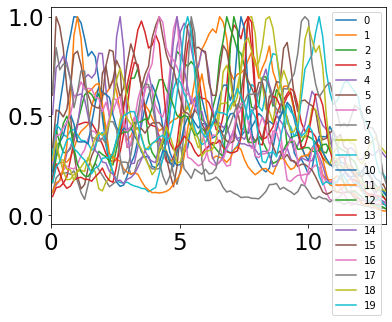

In [190]:

for i in range(20):
    idx = np.random.randint(0,smooth_sfh[colour_sample_2_smooth == 2].shape[0])
# To do.
    plt.plot(sfht,smooth_sfh[colour_sample_2_smooth == 2][idx]/np.max(smooth_sfh[colour_sample_2_smooth == 2][idx]),label =i)
    plt.xlim(0,13)
plt.legend()


counter =0
for i in range(smooth_sfh[colour_sample_2_smooth == 3].shape[0]):
    peakIDX =np.argmax(smooth_sfh[colour_sample_2_smooth == 3][i])
    print(peakIDX)
    if peakIDX <30:
        counter+=1
        
print(counter/smooth_sfh[colour_sample_2_smooth == 3].shape[0])

In [191]:
# LOOKS LIKE A LATE EVENT.

In [192]:
def flip(componentARR):
    #component array is of form N_MC,M
    # one common problem with some PCA is that the signs get flipped, messing up the mean
    # we exploit the uniqueness of PCA to a sign to ensure all 50,000 PCA passes have consistent sign orderings 
    # flip function works by feeding it each component, and flipping the signs as necessary.
    score = 0
    argidx = np.argmax(abs(componentARR[0]))
    for i in range(50000):
        if componentARR[i,argidx]>0:
            score +=1
        else:
            score -=1
    print(score)      
    if (score>0):
        for i in range(50000):
            if componentARR[i,argidx]<0:
                componentARR[i] = -1*componentARR[i] # flip signs
                
    elif(score<0):
        for i in range(50000):
            if componentARR[i,argidx]>0:
                componentARR[i] = -1*componentARR[i] # flip signs
                

    return(componentARR)




In [193]:
from sklearn.decomposition import PCA

In [194]:
def PCA_distinction(labels,dat,pop):
    
    # fit the PCA for the  full set:
    # Start with the full dataset:


    N_param = dat.shape[1]
    N_clust = 3#np.shape(np.unique(labels))[0]
    componentsFRN = np.zeros((50000,N_clust,N_param))
# Notation: FR = randomized family, group # + number of clusters
# i.e. randomized group 0: FR03, randomized group 1: FR13, randomized group 2: FR23


    for i in range(50000):
        if (i%10000 == 0):
            print(i, 'passes')# running 50000 times
        randidx = np.random.randint(0,np.size(labels),np.size(logMs[labels ==pop]))
    #selecting random indices for the entire dataset
    
        FRNtrain_dat,FRNtest_dat,FRNidx1,FRNidx2 =\
        train_test_split(dat[randidx], indices[randidx],test_size=0.2)
        FRNtrain_dat,FRNval_dat,FRNidx1,FRNidx3 = \
        train_test_split(FRNtrain_dat,FRNidx1,test_size=0.25)
    # train test splits
    
    
    # Then scale it...
        new_scalerFRN = MinMaxScaler()
        FRNtrain_data = new_scalerFRN.fit_transform(FRNtrain_dat)
        FRNtest_data = new_scalerFRN.transform(FRNtest_dat)
        FRNval_data = new_scalerFRN.transform(FRNval_dat)

# Then run PCA, find 3 components, and compute explained variances

        pcaFRN = PCA(n_components=3)
        pcaFRN.fit(FRNtrain_data)

        componentsFRN[i,:,:]= pcaFRN.components_

    
    print(np.shape(pcaFRN.components_)   )
    
    return  componentsFRN
    
    
    # now run it on each cluster:

In [195]:


print(np.unique(nmf_sample_smooth).shape[0])
indices = np.arange(0,12535)   
datCASEB = np.column_stack((WSFH_smooth,WZH_smooth))
# Now compute a train/test/val split for fam 0


def PCA_randpop(labels):
    N_dim = 3
    N_clust = np.unique(labels).shape[0]
    compsARR = np.zeros((50000,N_dim,8,N_clust))
    for j in range(N_clust):

        for i in range(50000):

            if (i%10000 == 0):
                print(i, 'passes')
            randidx = np.random.randint(0,np.size(nmf_sample_smooth),np.size(logMs[nmf_sample_smooth ==j]))
    # Selecting random indices based on the size of group 1
            FR13train_dat,FR13test_dat,FR13idx1,FR13idx2\
            = train_test_split(datCASEB[randidx], indices[randidx],test_size=0.2)
    
            FR13train_dat,FR13val_dat,FR13idx1,FR13idx3\
            = train_test_split(FR13train_dat,FR13idx1,test_size=0.25)
    # Train test splits
    
    
    # Then scale it...
            new_scalerFR13 = MinMaxScaler()
            FR13train_data = new_scalerFR13.fit_transform(FR13train_dat)
            FR13test_data = new_scalerFR13.transform(FR13test_dat)
            FR13val_data = new_scalerFR13.transform(FR13val_dat)

# Then run PCA, find 3 components, and compute explained variances
            pcaFR13 = PCA(n_components=N_dim)
            pcaFR13.fit(FR13train_data)
# Saved components to array
            compsARR[i,:,:,j]= pcaFR13.components_

    return compsARR

PCA_rand = PCA_randpop(nmf_sample_smooth)


3
0 passes
10000 passes
20000 passes
30000 passes
40000 passes
0 passes
10000 passes
20000 passes
30000 passes
40000 passes
0 passes
10000 passes
20000 passes
30000 passes
40000 passes


In [196]:
PCA_rand.shape

(50000, 3, 8, 3)

In [197]:
sample_dat = np.column_stack((WSFH_smooth,WZH_smooth))
comps0RN = PCA_distinction(nmf_sample_smooth,sample_dat,0) 
comps1RN = PCA_distinction(nmf_sample_smooth,sample_dat,1) 
comps2RN = PCA_distinction(nmf_sample_smooth,sample_dat,2) 


0 passes
10000 passes
20000 passes
30000 passes
40000 passes
(3, 8)
0 passes
10000 passes
20000 passes
30000 passes
40000 passes
(3, 8)
0 passes
10000 passes
20000 passes
30000 passes
40000 passes
(3, 8)


In [198]:
def PCA_SUBSAMPLE(labels,dat):
     
#We now want to compare this with the PCA decomposition of each group,
#We run PCA 50000 times on the same data to capture the inherent scatter
    N_param = dat.shape[1]
    N_clust = np.shape(np.unique(labels))[0]
    N_DIM = 3
    print(N_clust,'clusters',N_param,'dimensions input')
    componentsFRiN = np.zeros((50000,N_DIM,N_param,N_clust)) # component array for group 0
# Now compute a train/test/val split for fam 0
    for j in range(N_clust):
        print('Data used:',dat[labels==j].shape)
        for i in range(50000):

            FR1_0train_dat,FR1_0test_dat,FR1_0idx1,FR10idx2\
        = train_test_split(dat[labels==j], indices[labels==j],test_size=0.2)
    #we split indices too so that we can apply labels + train test split to external data
            FR1_0train_dat,FR1_0val_dat,FR1_0idx1,FR1_0idx3\
        = train_test_split(FR1_0train_dat,FR1_0idx1,test_size=0.25)
    
    
    # Then scale it...
            new_scalerFR1_0 = MinMaxScaler()
            FR1_0train_data = new_scalerFR1_0.fit_transform(FR1_0train_dat)
            FR1_0test_data = new_scalerFR1_0.transform(FR1_0test_dat)
            FR1_0val_data = new_scalerFR1_0.transform(FR1_0val_dat)

# Then run PCA, find 3 components, and compute explained variances
            pcaFR1_0 = PCA(n_components=N_DIM)
            pcaFR1_0.fit(FR1_0train_data)
            # components of PCA
            componentsFRiN[i,:,:,j]= pcaFR1_0.components_ # N_comps, N_features.

    return componentsFRiN


subSampleS = PCA_SUBSAMPLE(nmf_sample_smooth,sample_dat)



3 clusters 8 dimensions input
Data used: (1854, 8)
Data used: (7896, 8)
Data used: (2785, 8)


In [199]:
subSampleS

array([[[[ 4.64453901e-01, -5.63108833e-01, -5.31066184e-01],
         [ 2.70099939e-01, -1.12844460e-01, -4.20328073e-01],
         [-1.21293156e-01,  1.86916143e-02, -2.11015345e-01],
         ...,
         [-4.09089257e-01, -3.57573556e-01,  3.44496099e-01],
         [-9.46181512e-02,  6.48649259e-02, -2.45352852e-01],
         [ 5.05344096e-01, -4.48647581e-01, -3.28133886e-01]],

        [[-3.48796960e-02, -1.16625357e-01, -1.83720860e-01],
         [ 3.22498571e-01,  5.54230763e-01,  1.77598548e-01],
         [ 4.01057707e-02, -5.80409616e-01,  3.54202801e-01],
         ...,
         [ 3.45009782e-01,  1.30024811e-02,  2.08005906e-01],
         [-3.64649993e-01,  4.35886362e-02,  6.43115121e-01],
         [-5.83286415e-02, -4.68288577e-01, -2.88198809e-02]],

        [[-3.92077762e-01,  8.64937441e-02, -2.88136513e-01],
         [ 1.47347285e-01, -6.10867225e-01,  3.75672313e-01],
         [ 2.14756940e-01, -6.11056032e-01, -1.43014104e-01],
         ...,
         [-3.70382111e-0

In [200]:
subSampleS.shape # last IDX = cluster.

(50000, 3, 8, 3)

In [201]:
np.percentile(subSampleS[:,0,:,0],16,axis=0)

array([ 0.45582764,  0.24911304, -0.11263828, -0.34655973,  0.36027895,
       -0.41282619, -0.09980657,  0.49038145])

In [202]:
flipped_S00= flip(subSampleS[:,0,:,0])
flipped_S10= flip(subSampleS[:,1,:,0])
flipped_S20= flip(subSampleS[:,2,:,0])


flipped_S00= flip(subSampleS[:,0,:,0])
flipped_S01= flip(subSampleS[:,0,:,1])
flipped_S02= flip(subSampleS[:,0,:,2])


40076
27462
-49740
50000
-50000
-50000


In [203]:
np.mean(subSampleS[:,0,:,0],axis=0)

array([ 0.47110712,  0.26582245, -0.10208421, -0.33491683,  0.38235101,
       -0.4031274 , -0.08984333,  0.51633372])

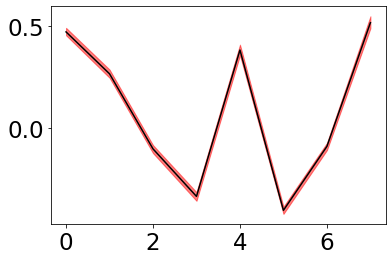

In [204]:
plt.plot(np.mean(flipped_S00,axis=0),color='black')
#plt.plot(np.percentile(flipped_S00,5,axis=0),\
#                color =colors[0])
#plt.plot(np.percentile(flipped_S00,95,axis=0),\
#                color =colors[0])

plt.fill_between(np.arange(0,8),np.percentile(flipped_S00,5,axis=0),np.percentile(flipped_S00,95,axis=0),alpha=0.5,color='red')

50000
-50000
50000
-49994
-50000
-14370
-50000
-50000
-41538
-50000
-43546
-6560
-50000
-50000
49690
-50000
49994
-12214


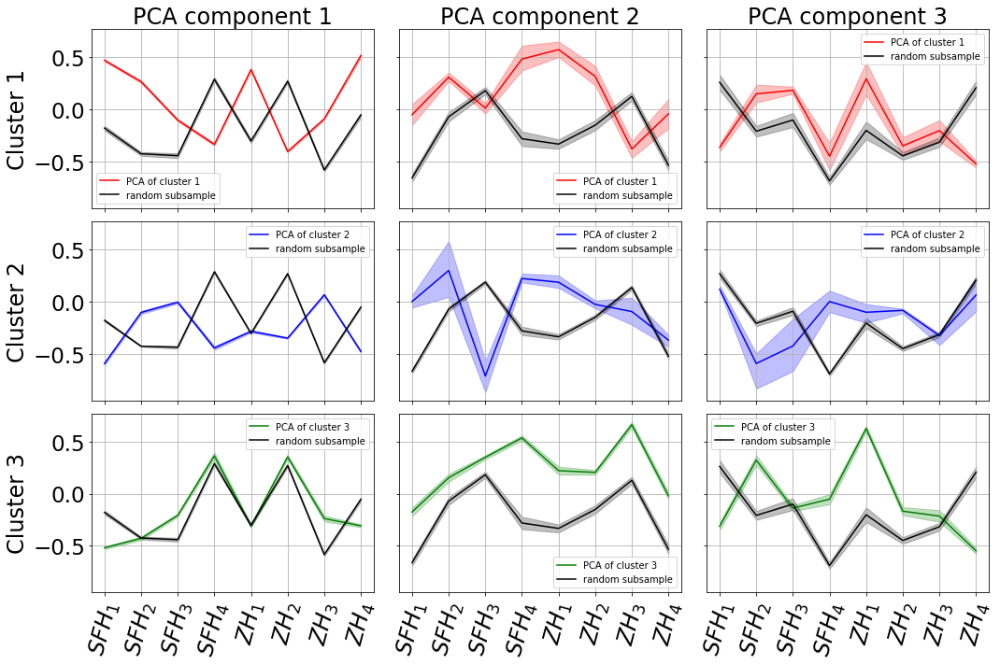

In [205]:
f,ax = plt.subplots(3,3,figsize=(15,10),sharey=True,sharex=True)
labels = ['$SFH_1$','$SFH_2$','$SFH_3$','$SFH_4$','$ZH_1$','$ZH_2$','$ZH_3$','$ZH_4$']
colors =['red','blue','green']
for i in range(3):  #iterate over cluster
    for j in range(3):# iterate over comp:
        #ax[i,j].plot(np.mean(subSampleS[:,j,:,i],axis=0),color =colors[i])
        subSampleS[:,j,:,i]= flip(subSampleS[:,j,:,i])
        PCA_rand[:,j,:,i]= flip(PCA_rand[:,j,:,i])
        if i ==0 and j ==0:
            PCA_rand[:,j,:,i] = 1*PCA_rand[:,j,:,i]
            
        if i==2 and j ==0:
            subSampleS[:,j,:,i]=1*subSampleS[:,j,:,i]
            
        if i==0 and j ==2:
            subSampleS[:,j,:,i]=1*subSampleS[:,j,:,i]
            
        if i==0 and j ==1:
            PCA_rand[:,j,:,i]=1*PCA_rand[:,j,:,i]
         #= flip()
        ax[i,j].fill_between(np.arange(0,8),np.percentile(subSampleS[:,j,:,i],16,axis=0),\
                             np.percentile(subSampleS[:,j,:,i],84,axis=0),alpha=0.25,color=colors[i])
        ax[i,j].plot(np.arange(0,8),np.mean(subSampleS[:,j,:,i],axis=0),color=colors[i],label ='PCA of cluster %i'%(i+1))
        ax[i,j].plot(np.arange(0,8),np.mean(PCA_rand[:,j,:,i],axis=0),color='black',label='random subsample')
        ax[i,j].fill_between(np.arange(0,8),np.percentile(PCA_rand[:,j,:,i],16,axis=0),\
                             np.percentile(PCA_rand[:,j,:,i],84,axis=0),alpha=0.25,color='black')
        ax[i,j].set_xticks(range(8), labels,rotation=75,fontsize=24)
        ax[i,j].grid()
        ax[i,j].legend()
        
ax[0,0].set_ylabel('Cluster 1',fontsize=24)
ax[1,0].set_ylabel('Cluster 2',fontsize=24)
ax[2,0].set_ylabel('Cluster 3',fontsize=24)
ax[0,0].set_title('PCA component 1',fontsize=24)
ax[0,1].set_title('PCA component 2',fontsize=24)
ax[0,2].set_title('PCA component 3',fontsize=24)

plt.tight_layout()

In [206]:
sample_dat = np.column_stack((WSFH_smooth,WZH_smooth))
comps0RN = PCA_distinction(nmf_sample,sample_dat,0) 
comps1RN = PCA_distinction(nmf_sample,sample_dat,1) 
comps2RN = PCA_distinction(nmf_sample,sample_dat,2) 

subSampleS = PCA_SUBSAMPLE(nmf_sample_smooth,sample_dat)


0 passes
10000 passes
20000 passes
30000 passes
40000 passes
(3, 8)
0 passes
10000 passes
20000 passes
30000 passes
40000 passes
(3, 8)
0 passes
10000 passes
20000 passes
30000 passes
40000 passes
(3, 8)
3 clusters 8 dimensions input
Data used: (1854, 8)
Data used: (7896, 8)
Data used: (2785, 8)


MC componnets: take random galaxies for each 1/50000th pass, same array as target. Find PCA components, save as entries in array. 3 components, for N dimensions, for M passes.

For subsamples: take the same data, apply labels and PCA, 500000 times. Produces array that is:

M passes, N_cluster, N dimensions, 3 components.

In [207]:

subSampleS = PCA_SUBSAMPLE(nmf_sample_smooth,sample_dat)


3 clusters 8 dimensions input
Data used: (1854, 8)
Data used: (7896, 8)
Data used: (2785, 8)


In [208]:
subSampleS.shape

(50000, 3, 8, 3)

In [209]:
D1 = np.array([ logMs[centralMask][colour_sample_1_smooth[centralMask] == 0].shape[0],
                logMs[centralMask][colour_sample_1_smooth[centralMask] == 1].shape[0],
               logMs[centralMask][colour_sample_1_smooth[centralMask] == 2].shape[0],
               logMs[centralMask][nmf_sample_smooth[centralMask] == 0].shape[0],
               logMs[centralMask][nmf_sample_smooth[centralMask] == 1].shape[0],
               logMs[centralMask][nmf_sample_smooth[centralMask] == 2].shape[0],
               logMs[centralMask][NMF_color_smooth[centralMask] == 0].shape[0],
               logMs[centralMask][NMF_color_smooth[centralMask] == 1].shape[0],
               logMs[centralMask][NMF_color_smooth[centralMask] == 2].shape[0],
               logMs[centralMask][colour_sample_2_smooth[centralMask] == 0].shape[0],
               logMs[centralMask][colour_sample_2_smooth[centralMask] == 1].shape[0],
               logMs[centralMask][colour_sample_2_smooth[centralMask] == 2].shape[0],
               logMs[centralMask][colour_sample_2_smooth[centralMask] == 3].shape[0],
               logMs[centralMask][nmf_sample_4_smooth[centralMask] == 0].shape[0],
               logMs[centralMask][nmf_sample_4_smooth[centralMask] == 1].shape[0],
               logMs[centralMask][nmf_sample_4_smooth[centralMask] == 2].shape[0],
               logMs[centralMask][nmf_sample_4_smooth[centralMask] == 3].shape[0],
               logMs[centralMask][NMF_color_4_smooth[centralMask] == 0].shape[0],
               logMs[centralMask][NMF_color_4_smooth[centralMask] == 1].shape[0],
               logMs[centralMask][NMF_color_4_smooth[centralMask] == 2].shape[0],
               logMs[centralMask][NMF_color_4_smooth[centralMask] == 3].shape[0],
])

D2 = np.array([ logMs[satMask][colour_sample_1_smooth[satMask] == 0].shape[0],
                logMs[satMask][colour_sample_1_smooth[satMask] == 1].shape[0],
               logMs[satMask][colour_sample_1_smooth[satMask] == 2].shape[0],
               logMs[satMask][nmf_sample_smooth[satMask] == 0].shape[0],
               logMs[satMask][nmf_sample_smooth[satMask] == 1].shape[0],
               logMs[satMask][nmf_sample_smooth[satMask] == 2].shape[0],
               logMs[satMask][NMF_color_smooth[satMask] == 0].shape[0],
               logMs[satMask][NMF_color_smooth[satMask] == 1].shape[0],
               logMs[satMask][NMF_color_smooth[satMask] == 2].shape[0],
               logMs[satMask][colour_sample_2_smooth[satMask] == 0].shape[0],
               logMs[satMask][colour_sample_2_smooth[satMask] == 1].shape[0],
               logMs[satMask][colour_sample_2_smooth[satMask] == 2].shape[0],
               logMs[satMask][colour_sample_2_smooth[satMask] == 3].shape[0],
               logMs[satMask][nmf_sample_4_smooth[satMask] == 0].shape[0],
               logMs[satMask][nmf_sample_4_smooth[satMask] == 1].shape[0],
               logMs[satMask][nmf_sample_4_smooth[satMask] == 2].shape[0],
               logMs[satMask][nmf_sample_4_smooth[satMask] == 3].shape[0],
               logMs[satMask][NMF_color_4_smooth[satMask] == 0].shape[0],
               logMs[satMask][NMF_color_4_smooth[satMask] == 1].shape[0],
               logMs[satMask][NMF_color_4_smooth[satMask] == 2].shape[0],
               logMs[satMask][NMF_color_4_smooth[satMask] == 3].shape[0],
])
print('done')

done


In [210]:
#d1 = np.array([1043,4523,1671,5365,396,1476,5150,1325,762,372,930,5121,1007,2649,104,3509,975,4972,722,1438,105])
#d2 = np.array([2048,1628,1622,2791,1476,1031,2308,1254,1736,1043,1830,1879,1217,1588,719,1788,1203,2234,1097,1245,722])
import pandas as pd

percents = np.zeros((2,D1.shape[0]))
case = ['A','A','A','B','B','B','C','C','C','D','D','D','D','E','E','E','E','F','F','F','F']
pop = ['1','2','3','1','2','3','1','2','3','1','2','3','4','1','2','3','4','1','2','3','4']
for i in range(percents.shape[1]):
    
    percents[0,i] = D1[i]/(D1[i]+D2[i])  * 100
    percents[1,i] = D2[i]/(D1[i]+D2[i]) * 100

d= {'N_cent': D1, 'N_sat':D2,'% cent':np.round(percents[0,:],decimals=2),'% sat':np.round(percents[1,:],decimals=2)}



In [211]:
gal_table = pd.DataFrame(data=d,index = [['case A','case A','case A','case B','case B','case B','case C','case C','case C','case D','case D','case D','case D','case E','case E','case E','case E','case F','case F','case F','case F'],\
                                         ['cluster 1','cluster 2','cluster 3','cluster 1','cluster 2','cluster 3','cluster 1','cluster 2','cluster 3','cluster 1','cluster 2','cluster 3','cluster 4','cluster 1','cluster 2','cluster 3','cluster 4','cluster 1','cluster 2','cluster 3','cluster 4']] )

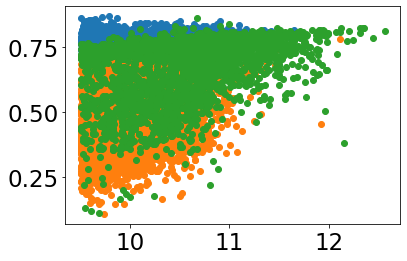

In [212]:
plt.scatter(logMs[nmf_sample_smooth ==0],(G-R)[nmf_sample_smooth==0])
plt.scatter(logMs[nmf_sample_smooth ==1],(G-R)[nmf_sample_smooth==1])

plt.scatter(logMs[nmf_sample_smooth ==2],(G-R)[nmf_sample_smooth==2])

In [213]:
D2

array([2048, 1628, 1622, 1464, 2696, 1138, 2333, 1723, 1242,  372, 1830,
       1879, 1217, 1737,  701, 1664, 1196, 2259, 1091, 1245,  703])

In [214]:
D1

array([1043, 4523, 1671,  390, 5200, 1647, 5193,  760, 1284,  179,  930,
       5121, 1007, 3369,   96, 2804,  968, 5022,  714, 1405,   96])

In [215]:
gal_table

N_cent  N_sat  % cent  % sat
case A cluster 1    1043   2048   33.74  66.26
       cluster 2    4523   1628   73.53  26.47
       cluster 3    1671   1622   50.74  49.26
case B cluster 1     390   1464   21.04  78.96
       cluster 2    5200   2696   65.86  34.14
       cluster 3    1647   1138   59.14  40.86
case C cluster 1    5193   2333   69.00  31.00
       cluster 2     760   1723   30.61  69.39
       cluster 3    1284   1242   50.83  49.17
case D cluster 1     179    372   32.49  67.51
       cluster 2     930   1830   33.70  66.30
       cluster 3    5121   1879   73.16  26.84
       cluster 4    1007   1217   45.28  54.72
case E cluster 1    3369   1737   65.98  34.02
       cluster 2      96    701   12.05  87.95
       cluster 3    2804   1664   62.76  37.24
       cluster 4     968   1196   44.73  55.27
case F cluster 1    5022   2259   68.97  31.03
       cluster 2     714   1091   39.56  60.44
       cluster 3    1405   1245   53.02  46.98
       cluster 4      96    703   12.02  87.98

In [216]:
logMs[centralMask][nmf_sample_4_smooth[centralMask] == 3].shape

(968,)

In [217]:
D1.reshape(1,D1.shape[0]).shape

(1, 21)

In [218]:
gal_table.to_excel("PopStats.xlsx",
             sheet_name='ProjectTable')  

In [219]:
# make one for mean/median ex-situ fractions, then we're ready to write.


In [220]:
# Overlaps for Pops of Cluster B --> Cluster E:


No KS test value falls below < 0.05 ... I think. Clarify.

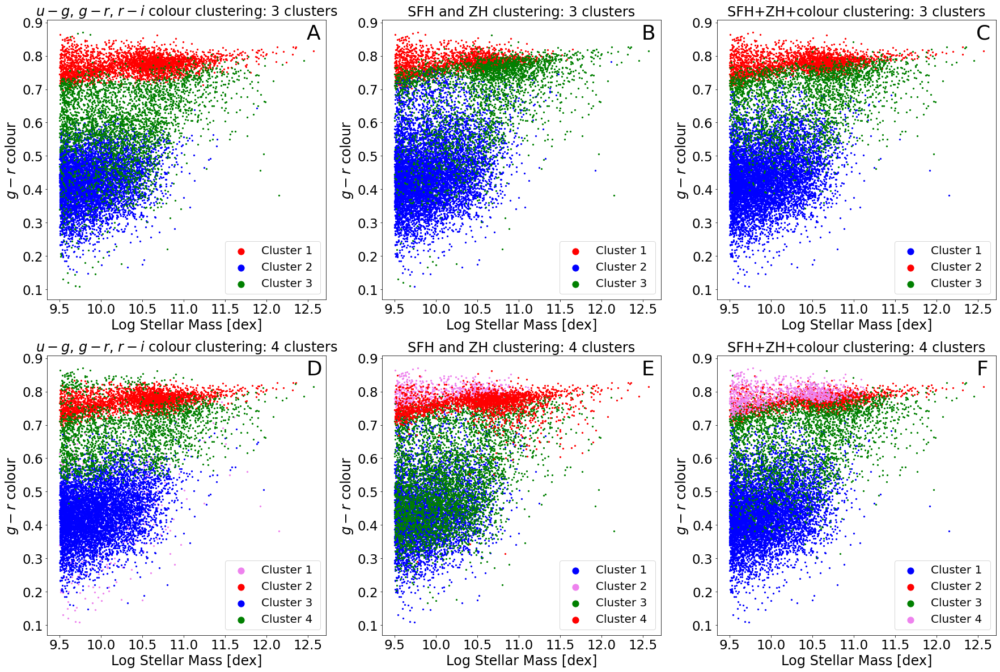

In [221]:
f,ax = plt.subplots(2,3,figsize =(30,20))
colors=['red','blue','green','violet']
#colours = [cbs[3],cbs[9],cbs[2],cbs[6]]
#ax[0,i].set(xlabel='Log Stellar Mass [dex]',ylabel = 'g-r colour',fontsize= 16)
#ax[1,i].set(xlabel='Log Stellar Mass [dex]',ylabel = 'g-r colour',fontsize= 16)
for i in range(3):
    ax[0,i].set_xlabel('Log Stellar Mass [dex]',fontsize= 24)
    ax[0,i].set_ylabel(  '$g-r$ colour',fontsize= 24)
    ax[1,i].set_xlabel('Log Stellar Mass [dex]',fontsize=24)
    ax[1,i].set_ylabel('$g-r$ colour',fontsize= 24)
    
    
ax[0,0].scatter(logMs[colour_sample_1_smooth==0],(G-R)[colour_sample_1_smooth==0],color = 'red',\
                    label = 'Cluster %i '%(1),s=5,rasterized=True)
    
ax[0,0].scatter(logMs[colour_sample_1_smooth==1],(G-R)[colour_sample_1_smooth==1],color = 'blue',\
                    label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[0,0].scatter(logMs[colour_sample_1_smooth==2],(G-R)[colour_sample_1_smooth==2],color = 'green',\
                    label = 'Cluster %i '%(3),s=5,rasterized=True)
    
    
ax[0,1].scatter(logMs[nmf_sample_smooth==0],(G-R)[nmf_sample_smooth==0],color = colors[0],label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[0,1].scatter(logMs[nmf_sample_smooth==1],(G-R)[nmf_sample_smooth==1],color = colors[1],label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[0,1].scatter(logMs[nmf_sample_smooth==2],(G-R)[nmf_sample_smooth==2],color = colors[2],label = 'Cluster %i '%(3),s=5,rasterized=True)
ax[0,2].scatter(logMs[NMF_color_smooth==0],(G-R)[NMF_color_smooth==0],color = 'blue',label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[0,2].scatter(logMs[NMF_color_smooth==1],(G-R)[NMF_color_smooth==1],color = 'red',label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[0,2].scatter(logMs[NMF_color_smooth==2],(G-R)[NMF_color_smooth==2],color = 'green',label = 'Cluster %i '%(3),s=5,rasterized=True)

    


ax[1,0].scatter(logMs[colour_sample_2_smooth==0],(G-R)[colour_sample_2_smooth==0],color = colors[3],\
                    label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[1,0].scatter(logMs[colour_sample_2_smooth==1],(G-R)[colour_sample_2_smooth==1],color = colors[0],\
                    label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[1,0].scatter(logMs[colour_sample_2_smooth==2],(G-R)[colour_sample_2_smooth==2],color = colors[1],\
                    label = 'Cluster %i '%(3),s=5,rasterized=True)
ax[1,0].scatter(logMs[colour_sample_2_smooth==3],(G-R)[colour_sample_2_smooth==3],color = colors[2],\
                    label = 'Cluster %i '%(4),s=5,rasterized=True)

ax[1,1].scatter(logMs[nmf_sample_4_smooth==0],(G-R)[nmf_sample_4_smooth==0],color = colors[1],label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[1,1].scatter(logMs[nmf_sample_4_smooth==1],(G-R)[nmf_sample_4_smooth==1],color = colors[3],label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[1,1].scatter(logMs[nmf_sample_4_smooth==2],(G-R)[nmf_sample_4_smooth==2],color = colors[2],label = 'Cluster %i '%(3),s=5,rasterized=True)
ax[1,1].scatter(logMs[nmf_sample_4_smooth==3],(G-R)[nmf_sample_4_smooth==3],color = colors[0],label = 'Cluster %i '%(4),s=5,rasterized=True)

ax[1,2].scatter(logMs[NMF_color_4_smooth==0],(G-R)[NMF_color_4_smooth==0],color = colors[1],label = 'Cluster %i '%(1),s=5,rasterized=True)
ax[1,2].scatter(logMs[NMF_color_4_smooth==1],(G-R)[NMF_color_4_smooth==1],color = colors[0],label = 'Cluster %i '%(2),s=5,rasterized=True)
ax[1,2].scatter(logMs[NMF_color_4_smooth==2],(G-R)[NMF_color_4_smooth==2],color = colors[2],label = 'Cluster %i '%(3),s=5,rasterized=True)
ax[1,2].scatter(logMs[NMF_color_4_smooth==3],(G-R)[NMF_color_4_smooth==3],color = colors[3],label = 'Cluster %i '%(4),s=5,rasterized=True)
ax[0,0].annotate('A',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[0,1].annotate('B',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[0,2].annotate('C',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[1,0].annotate('D',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[1,1].annotate('E',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
ax[1,2].annotate('F',xy =(12.65,0.5),xytext=(0.93,0.93),textcoords='axes fraction',fontsize=36)
for i in range(3):
    ax[0,i].legend(fontsize=20,markerscale=5.)
    ax[1,i].legend(fontsize=20,markerscale=5.)
    
    
ax[0,0].set_title('$u-g$, $g-r$, $r-i$ colour clustering: 3 clusters',fontsize=24)
ax[1,0].set_title('$u-g$, $g-r$, $r-i$ colour clustering: 4 clusters',fontsize=24)
ax[0,1].set_title('SFH and ZH clustering: 3 clusters',fontsize=24)
ax[1,1].set_title('SFH and ZH clustering: 4 clusters',fontsize=24)
ax[0,2].set_title('SFH+ZH+colour clustering: 3 clusters',fontsize=24)
ax[1,2].set_title('SFH+ZH+colour clustering: 4 clusters',fontsize=24)
plt.savefig('Summary_smooth.pdf',dpi = 300,format='pdf')

In [222]:
def plot_zh_sfh_smooth(labels,zh,sfh,delt,title,upper,lower,mode):
    
    f,ax=plt.subplots(1,2,figsize=(20,10))
    ax[0].set_title(title+"Metallicity histories",fontsize =20)
    ax[1].set_title(title+"SFH",fontsize =20)
    if mode =='A' or mode=='def':
        colors=['red','blue','green','purple']
    elif mode =='B':
        colors=['red','blue','green','purple']
    elif mode =='C':
        colors=['blue','red','green','purple']
    elif mode =='D':
        colors=['violet','red','blue','green']
    elif mode =='E':
        colors=['blue','violet','green','red']
    elif mode =='F':
        colors=['blue','red','green','violet']

    else:
        colors=['red','blue','green','purple']
    axins1 =inset_axes(ax[0], width="25%", height="25%", loc=1, borderpad=1)
    axins1.tick_params(labelleft=False, labelbottom=False)
    axins2 =inset_axes(ax[1], width="25%", height="25%", loc=2, borderpad=1)
    axins2.tick_params(labelleft=False, labelbottom=False)
    ax[0].set_xlim(0,sfht[-1])
    ax[0].set_ylabel('Mean metallicity history [$Z_{\\odot}$]',fontsize=24)
    ax[1].set_ylabel('Mean star formation history [$M_{ \\odot}/Gyr$]',fontsize=24)
    ax[0].set_xlabel('Lookback Time [Gyr]',fontsize=24)
    ax[1].set_xlabel('Lookback Time [Gyr]',fontsize=24)
    ax[1].set_xlim(0,sfht[-1])
    for i in range(np.unique(labels).shape[0]):

        cond = [(labels==i)&(logMs < upper)&(logMs >=lower)]#[(NMF_color_4 ==3)&(logMs<11)&(logMs>=10)]
        frac = 0.9
        mean = exclusion_mean(cond,zh,frac)
        upp= exclusion_percentile(cond,zh,84,frac)
        lpp =exclusion_percentile(cond,zh,16,frac)
#plt.plot(sfht,mean,lw=3,color='red')
#plt.fill_between(sfht,lower,mean,lw=2,alpha=0.2,color='red')
#plt.fill_between(sfht,mean,upper,lw=2,alpha=0.2,color='red')

       # print(zh[0])
       # print(zh[labels==i].shape)
       # print(zh[zh!=0].shape)
       # print(np.shape((zh[(labels ==i) & (zh!=0)])))
        
        #ax[0].plot(sfht,np.nanmean(zh[labels == i]\
         #              [(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower) ],axis=0)/(delt),\
        #           color=colors[i],label = 'cluster %i'%(i))
        ax[1].plot(sfht,np.mean(sfh[labels == i]\
                       [(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower) ],axis=0)/(delt),\
                   color=colors[i],label = 'cluster %i'%(i+1),lw=3,rasterized= True)
        
        
        ax[0].plot(sfht,mean,color=colors[i],label='cluster %i'%(i+1),lw=3,rasterized= True)
        ax[0].fill_between(sfht,lpp,mean,lw=2,alpha=0.2,color=colors[i],rasterized=True)
        ax[0].fill_between(sfht,mean,upp,lw=2,alpha=0.2,color=colors[i],rasterized=True)
        #mdata = np.ma.masked_where(zh[labels == i][(logMs[labels==i] < upper)  &\
         #                                          (logMs[labels==i] >=lower) ] == 0,\
        #                           zh[labels == i][(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower) ])
        #mdata = np.ma.filled(mdata, np.nan)
        #meanval= np.ma.average(mdata,axis=0,weights=zh[labels == i][(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower) ].astype(bool))/delt
        #ax[0].plot(sfht,np.ma.average(zh[labels==i][(logMs[labels==i] < upper)  &\
        #                                      (logMs[labels==i] >=lower) ], axis=0,\
        ##                   weights=zh[labels==i][(logMs[labels==i] < upper)  &\
        #                                      (logMs[labels==i] >=lower) ].astype(bool)),color=colors[i],label = 'cluster %i'%(i))
        #
        #ax[0].fill_between(sfht,np.nanpercentile(mdata,16,axis=0),np.ma.average(zh[labels==i][(logMs[labels==i] < upper)  &\
        #                                      (logMs[labels==i] >=lower) ], axis=0,\
        #                   weights=zh[labels==i][(logMs[labels==i] < upper)  &\
        #                                      (logMs[labels==i] >=lower) ].astype(bool)),color=colors[i],alpha=0.2)
        #ax[0].fill_between(sfht,np.nanpercentile(mdata,84,axis=0),np.ma.average(zh[labels==i][(logMs[labels==i] < upper)  &\
        #                                      (logMs[labels==i] >=lower) ], axis=0,\
        #                   weights=zh[labels==i][(logMs[labels==i] < upper)  &\
       #                                       (logMs[labels==i] >=lower) ].astype(bool)),color=colors[i],alpha=0.2)
        #ax[0].fill_between(sfht,np.nanpercentile(mdata,16,axis=0)/delt,meanval,color =colors[i],alpha=0.2)
        #ax[0].fill_between(sfht,np.nanpercentile(mdata,84,axis=0)/delt,meanval,color =colors[i],alpha=0.2)
        #ax[0].fill_between(sfht,np.nanpercentile(zh[labels == i]\
        #               [(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower)  ],16,axis=0)/(delt),\
        #                   np.nanpercentile(zh[labels == i]\
         #              [(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower) ],84,axis=0)/(delt),color=colors[i],alpha=0.2)
        ax[1].fill_between(sfht,np.percentile(sfh[labels == i]\
                       [(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower) ],16,axis=0)/(delt),\
                           np.percentile(sfh[labels == i]\
                       [(logMs[labels==i] < upper)  & (logMs[labels==i] >=lower) ],84,axis=0)/(delt),color=colors[i],alpha=0.2,lw=2,rasterized=True)
        
        axins1.scatter(logMs[labels == i], (G-R)[labels==i], color =colors[i],alpha = 0.5, s=0.1, rasterized = True)
        axins2.scatter(logMs[labels == i], (G-R)[labels==i], color =colors[i],alpha = 0.5, s=0.1, rasterized = True)
    ax[0].legend(loc=2,fontsize=14) 
    ax[1].legend(loc=1,fontsize=14) 
    

    plt.savefig(mode+'SMOOTH.pdf',dpi=300,bbox_inches='tight',format ='pdf')
    plt.show()
    

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

1661 1846
1913 2126
1656 1841


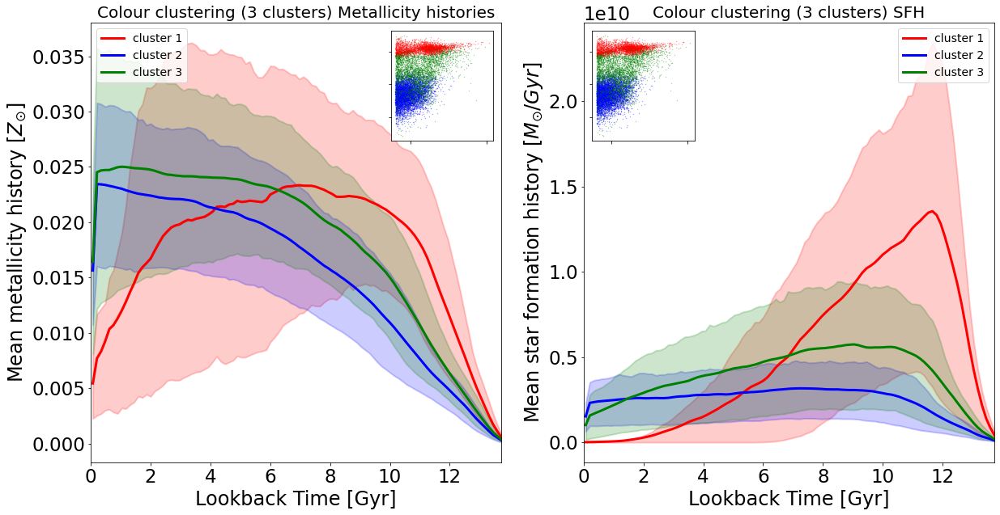

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

958 1065
2750 3056
1522 1692


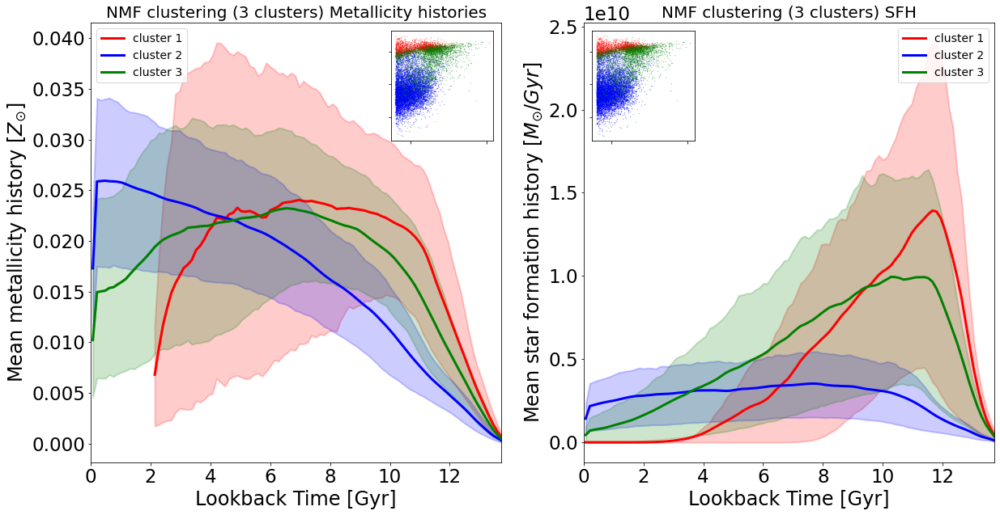

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

2675 2973
1340 1489
1215 1351


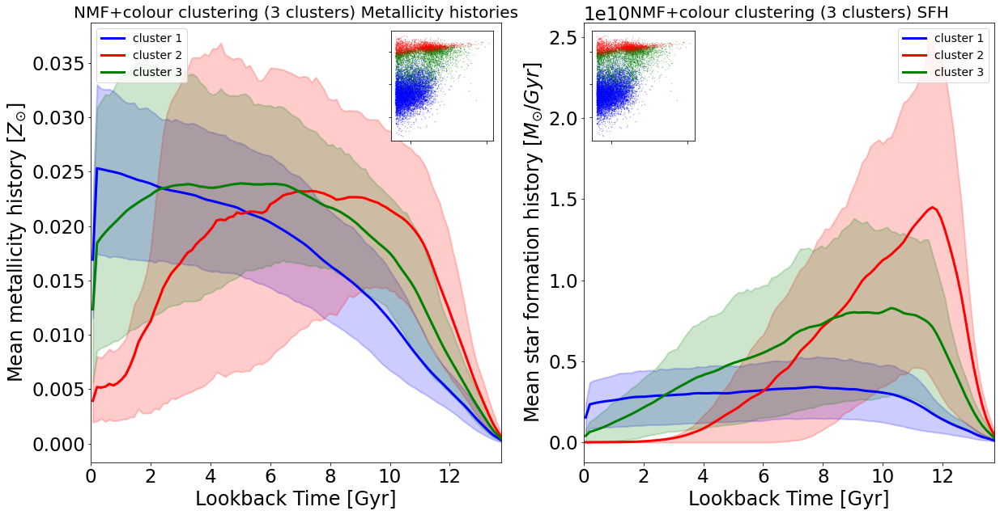

In [223]:
plot_zh_sfh_smooth(colour_sample_1_smooth,smooth_zh,smooth_sfh,np.diff(sfht)[0],'Colour clustering (3 clusters) ',upper,lower,'A')
plot_zh_sfh_smooth(nmf_sample_smooth,smooth_zh,smooth_sfh,np.diff(sfht)[0],'NMF clustering (3 clusters) ',upper,lower,'B')
plot_zh_sfh_smooth(NMF_color_smooth,smooth_zh,smooth_sfh,np.diff(sfht)[0],'NMF+colour clustering (3 clusters) ',upper,lower,'C')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

203 226
1505 1673
2575 2862
946 1052


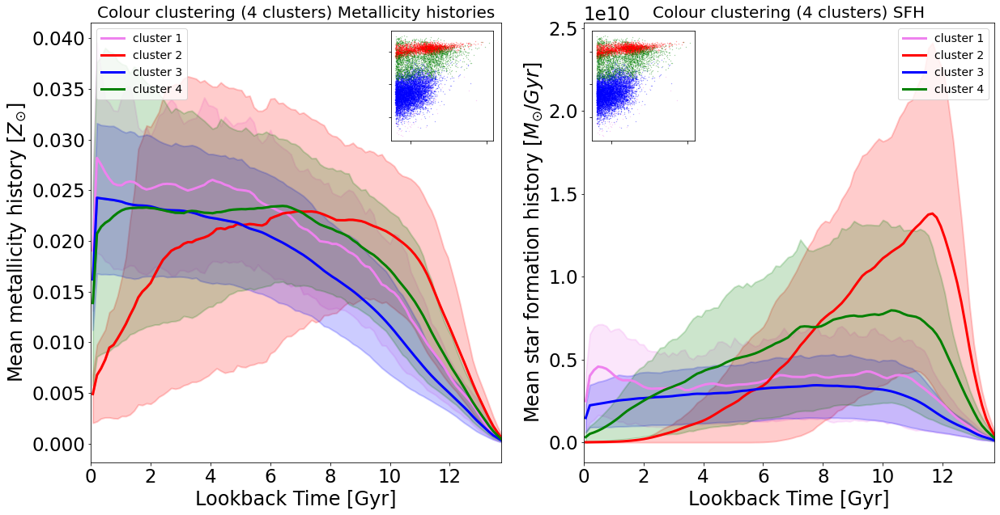

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

1582 1758
395 439
2105 2339
1149 1277


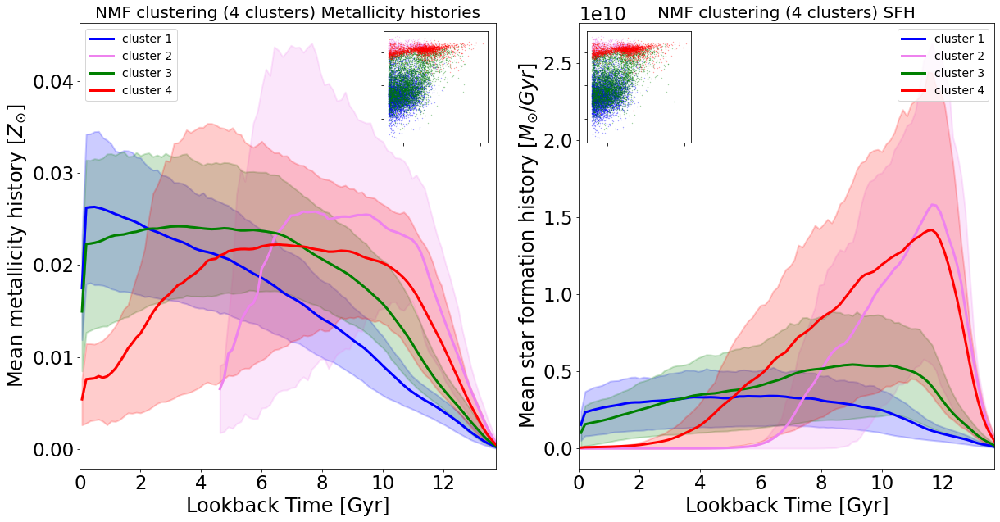

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an 

2552 2836
1001 1113
1281 1424
396 440


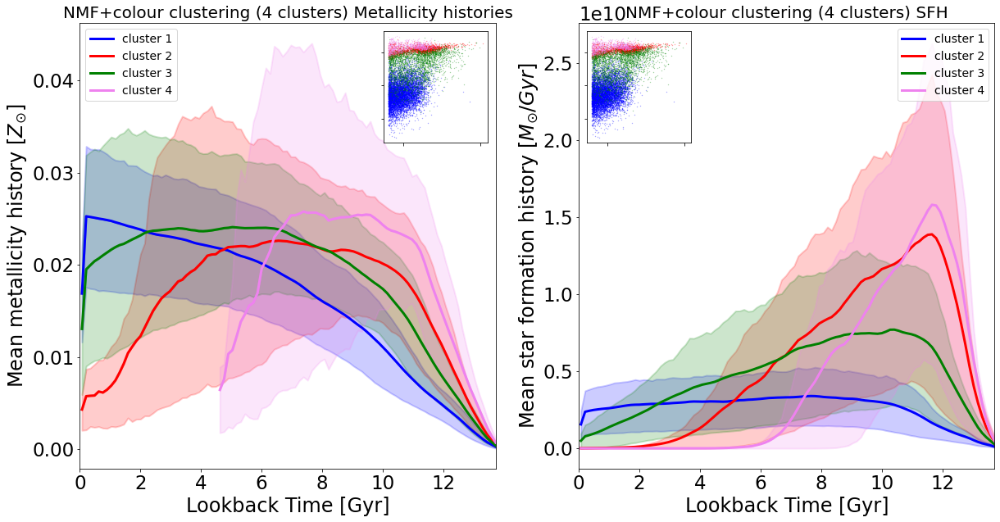

In [224]:
upper =11
lower = 10
plot_zh_sfh_smooth(colour_sample_2_smooth,smooth_zh,smooth_sfh,np.diff(sfht)[0],'Colour clustering (4 clusters) ',upper,lower,'D')
plot_zh_sfh_smooth(nmf_sample_4_smooth,smooth_zh,smooth_sfh,np.diff(sfht)[0],'NMF clustering (4 clusters) ',upper,lower,'E')
plot_zh_sfh_smooth(NMF_color_4_smooth,smooth_zh,smooth_sfh,np.diff(sfht)[0],'NMF+colour clustering (4 clusters) ',upper,lower,'F')

In [225]:
H.shape

(4, 100)

In [226]:
np.matmul(WSFH[nmf_sample_4_smooth==3],H)[0].shape

(100,)

In [227]:
WSFH_smooth.shape

(12535, 4)

In [228]:
mean_weights_4 = np.mean(WSFH_smooth[nmf_sample_4_smooth==1],axis=0)
mean_weights_4.shape

(4,)

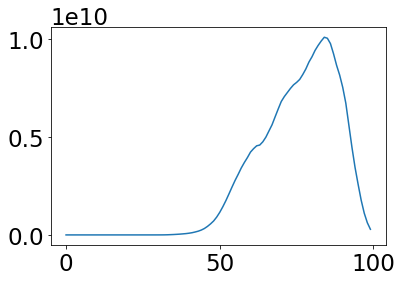

In [229]:
plt.plot(np.mean(smooth_sfh[nmf_sample_4_smooth==1]/(0.1379999),axis=0))

In [230]:
norm_factor = (np.max(smooth_sfh)-np.min(smooth_sfh))

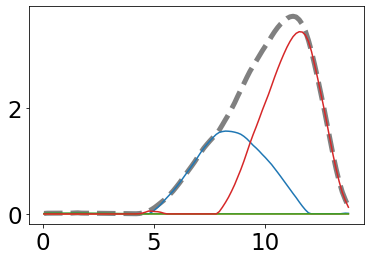

In [231]:
plt.plot(sfht,np.matmul(mean_weights_4,H)/(0.1379999),label = 'mean reconstructed',lw =5,linestyle='dashed',color='gray')
plt.plot(sfht,mean_weights_4[0]*H[0,:]/(0.1379999),label = 'mean NMF comp 1')
plt.plot(sfht,mean_weights_4[1]*H[1,:]/(0.1379999),label = 'mean NMF comp 2')
plt.plot(sfht,mean_weights_4[2]*H[2,:]/(0.1379999),label = 'mean NMF comp 3')
plt.plot(sfht,mean_weights_4[3]*H[3,:]/(0.1379999),label = 'mean NMF comp 4')
plt.show()

In [232]:
norm_factor

293118672896.0

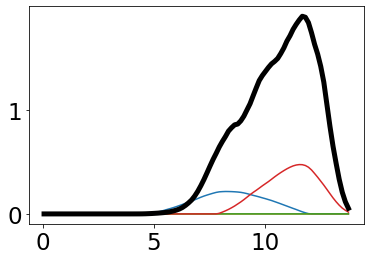

In [233]:
plt.plot(sfht,(mean_weights_4[0]*H[0,:]))#+np.min(smooth_sfh)))
plt.plot(sfht,(mean_weights_4[1]*H[1,:]))#+np.min(smooth_sfh)))
plt.plot(sfht,(mean_weights_4[2]*H[2,:]))#+np.min(smooth_sfh)))
plt.plot(sfht,(mean_weights_4[3]*H[3,:]))#+np.min(smooth_sfh)))
plt.plot(sfht,400*(np.mean(smooth_sfh[nmf_sample_4_smooth==1],axis=0)-np.min(smooth_sfh))/norm_factor,lw =5, color='black',label ='mean SFH')


In [234]:
Xs.max()

1.0

In [235]:
np.log10(norm_factor)

11.467043485710297

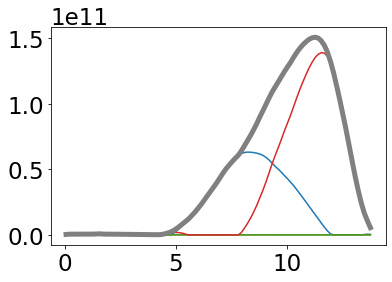

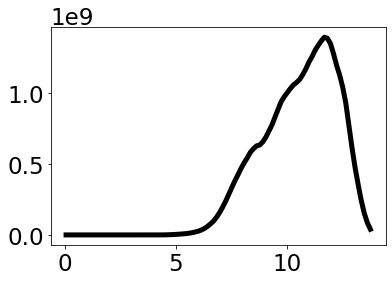

In [236]:
meanSFH = np.mean(smooth_sfh[nmf_sample_4_smooth==1],axis=0)
plt.plot(sfht,norm_factor*(mean_weights_4[0]*H[0,:]+np.min(smooth_sfh)))
plt.plot(sfht,norm_factor*(mean_weights_4[1]*H[1,:]+np.min(smooth_sfh)))
plt.plot(sfht,norm_factor*(mean_weights_4[2]*H[2,:]+np.min(smooth_sfh)))
plt.plot(sfht,norm_factor*(mean_weights_4[3]*H[3,:]+np.min(smooth_sfh)))
plt.plot(sfht,norm_factor*(np.matmul(mean_weights_4,H)+np.min(smooth_sfh)),color='grey',lw=5)
plt.show()
plt.plot(sfht,meanSFH,color='black',lw=5)

Text(0, 0.5, 'NORM SFH')

<Figure size 432x288 with 0 Axes>

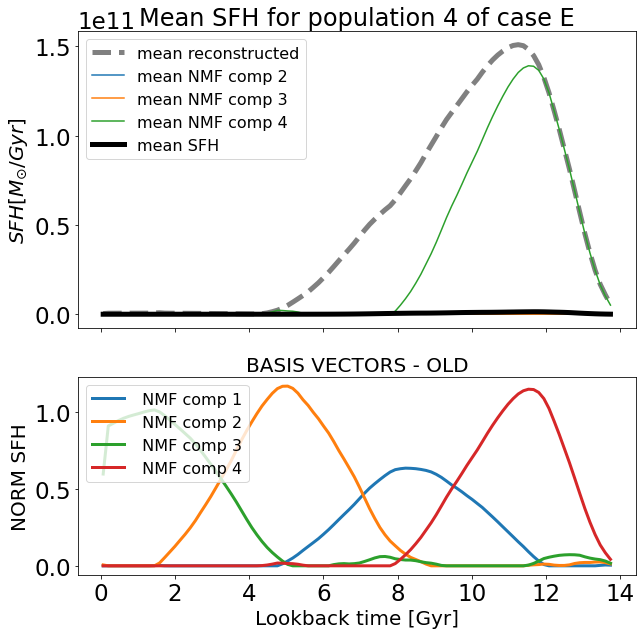

In [237]:
plt.suptitle('New basis 4-NMF',fontsize=20)
norm_factor = (np.max(smooth_sfh)-np.min(smooth_sfh))
f, (a0, a1) = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3,  2]},figsize=(10,10),sharex=True)
a0.plot(sfht,norm_factor*np.matmul(mean_weights_4,H)+np.min(smooth_sfh),label = 'mean reconstructed',lw =5,linestyle='dashed',color='gray')
a0.plot(sfht,norm_factor*mean_weights_4[1]*H[1,:],label = 'mean NMF comp 2')
a0.plot(sfht,norm_factor*mean_weights_4[2]*H[2,:],label = 'mean NMF comp 3')
a0.plot(sfht,norm_factor*mean_weights_4[3]*H[3,:],label = 'mean NMF comp 4')
a0.set_title('Mean SFH for population 4 of case E',fontsize=24)
a0.plot(sfht,np.mean(smooth_sfh[nmf_sample_4_smooth==1],axis=0),lw =5, color='black',label ='mean SFH')
a0.legend(fontsize=16)

a1.set_title('BASIS VECTORS - OLD',fontsize=20)
a1.plot(sfht,H[0,:],lw=3,label = ' NMF comp 1')
a1.plot(sfht,H[1,:],lw=3,label = ' NMF comp 2')
a1.plot(sfht,H[2,:],lw=3,label = ' NMF comp 3')
a1.plot(sfht,H[3,:],lw=3,label = ' NMF comp 4')
a1.legend(fontsize=16,loc='upper left')
a1.set_xlabel('Lookback time [Gyr]',fontsize=20)
a0.set_ylabel('$SFH [M_{\\odot}/Gyr]$',fontsize=20)
a1.set_ylabel('NORM SFH',fontsize=20)



In [238]:
integratedSFH = np.sum(smooth_sfh,axis =1)
integratedSFH.shape

intNORMSFH = np.zeros((12535,100))
for i in range(12535):
    intNORMSFH[i,:] = smooth_sfh[i]/integratedSFH[i]

In [239]:
### Now for fM_plots.

In [240]:
def fM_plot_smooth(labels,case,upper,lower):
    num_clusters = np.unique(labels).shape[0]
    f,axes = plt.subplots(num_clusters,2, figsize=(15,7*num_clusters))
    labels_central, labels_sat = labels[(crossrefID[H2idx] == 1)[:,0]],\
        labels[(crossrefID[H2idx] !=1)[:,0]]
    
    mode = case
    if mode =='A' or mode=='def':
        colors=['red','blue','green','purple']
    elif mode =='B':
        colors=['red','blue','green','purple']
    elif mode =='C':
        colors=['blue','red','green','purple']
    elif mode =='D':
        colors=['violet','red','blue','green']
    elif mode =='E':
        colors=['blue','violet','green','red']
    elif mode =='F':
        colors=['blue','red','green','violet']



    #axes[i,0].set_ylabel('Counts ', fontsize = 20)
    axes[0,0].set_title('Ex-situ mass fraction from mergers case: '+str(case),fontsize=20)
    axes[0,1].set_title('Ex-situ mass fraction from flybys case: '+str(case),fontsize=20)
    for i in range(num_clusters):

            n,a,_ = axes[i,0].hist(np.log10(fM[(fM>0)&(labels==i)&\
                                                 (logMs<upper) & (logMs>=lower)]),\
                          histtype = 'step',bins = np.linspace(-5,0,50),\
                           color =colors[i],density= False,lw =2, label = ' cluster %i '%(i+1),rasterized=True)

# Group 0
            #axs[0,i].set_title('Group 0: total vs sats',fontsize = 16)
            axes[i,0].set_xlabel('Log(Merger Mass Fraction)', fontsize = 20)
            axes[i,0].set_ylabel('Number of galaxies ', fontsize = 20)
            axes[i,1].set_ylabel('Number of galaxies ', fontsize = 20)
            axes[i,0].hist(np.log10(fM[satMask][(labels[satMask]==i) &(fM[satMask]>0)&\
                                               (logMs[satMask]<upper)&(logMs[satMask]>=lower)]),\
                           bins = np.linspace(-5,0,50),\
                           color =colors[i],density= False,lw =2, label = ' cluster %i satellites' %(i+1),rasterized=True)
            med_val = np.median(np.log10(fM[centralMask][(fM[centralMask]>0)&(labels[centralMask]==i)&\
                                                 (logMs[centralMask]<upper) & (logMs[centralMask]>=lower)]))
            med_val_sat = np.median(np.log10(fM[satMask][(labels[satMask]==i) &(fM[satMask]>0)&\
                                               (logMs[satMask]<upper)&(logMs[satMask]>=lower)]))
            axes[i,0].vlines(x= med_val,ymin=0,ymax = np.max(n)*1.2,lw =2,label = 'central median %.2f'%(med_val),rasterized=True,color='black')
            axes[i,0].vlines(x= med_val_sat,ymin=0,ymax = np.max(n)*1.2,lw =2,linestyle ='dashed',label = 'satellite median %.2f'%(med_val_sat),rasterized=True,color='black')
            
            m,_,_ = axes[i,1].hist(np.log10(fStripped[(labels==i)&(fStripped>0)&(logMs<upper)&(logMs>=lower)]),\
                            histtype = 'step',bins = np.linspace(-5,0,50),\
                            color =colors[i],density= False,lw =2, label = ' cluster %i '%(i+1),rasterized=True)

# Group 0
            #axs[0,i].set_title('Group 0: total vs sats',fontsize = 16)
            axes[i,0].set_ylim(0,np.max(n)*1.2)
            axes[i,1].set_xlabel('Log(Flyby Mass Fraction)', fontsize = 20)
            axes[i,1].hist(np.log10(fStripped[satMask][(labels[satMask]==i) &(fStripped[satMask]>0)&\
                                                      (logMs[satMask]<upper)&(logMs[satMask]>=lower)]),\
                           
                           lw =2,bins = np.linspace(-5,0,50),\
         color =colors[i],density= False, label = ' cluster %i satellites' %(i+1),rasterized=True)
            med_valf = np.median(np.log10(fStripped[centralMask][(fStripped[centralMask]>0)&(labels[centralMask]==i)&\
                                                 (logMs[centralMask]<upper) & (logMs[centralMask]>=lower)]))
            med_val_satf = np.median(np.log10(fStripped[satMask][(labels[satMask]==i) &(fStripped[satMask]>0)&\
                                               (logMs[satMask]<upper)&(logMs[satMask]>=lower)]))
            axes[i,1].vlines(x= med_valf,ymin=0,ymax = np.max(m)*1.2,lw =2,label = 'central median %.2f'%(med_valf),color='black')
            axes[i,1].vlines(x= med_val_satf,ymin=0,ymax = np.max(m)*1.2,lw =2,linestyle ='dashed',label = 'satellite median %.2f'%(med_val_satf),rasterized=True,color='black')
            axes[i,1].set_ylim(0,np.max(m)*1.2)
            
            #axes[0,i].hist(np.log10(fM[satMask][original_labels_sat==i]\
         #[(fM[satMask][original_labels_sat==i]>0)]),bins = np.linspace(-5,0,50),\
            axins =inset_axes(axes[i,0], width="30%", height="30%", loc=6, borderpad=1)
            axins.tick_params(labelleft=False, labelbottom=False)
#plt.tight_layout()
            axins.scatter(logMs[(labels != i)], (G-R)[labels!=i], color ='black',alpha = 0.2, s=0.1,rasterized=True)
            axins.scatter(logMs[(labels == i)&(fM>0)],\
                          (G-R)[(labels==i)&(fM>0)], color =colors[i], s=0.1, alpha = 0.5,rasterized=True)        
            axes[i,0].legend( fontsize = 16,loc =2)
            axes[i,1].legend( fontsize = 16,loc =2)
            #axes[i,0].set_ylabel('Counts', fontsize = 20)
            
    plt.savefig('case'+str(case)+'fMplot_SMOOTH.pdf',dpi=250,format ='pdf')
    plt.show()

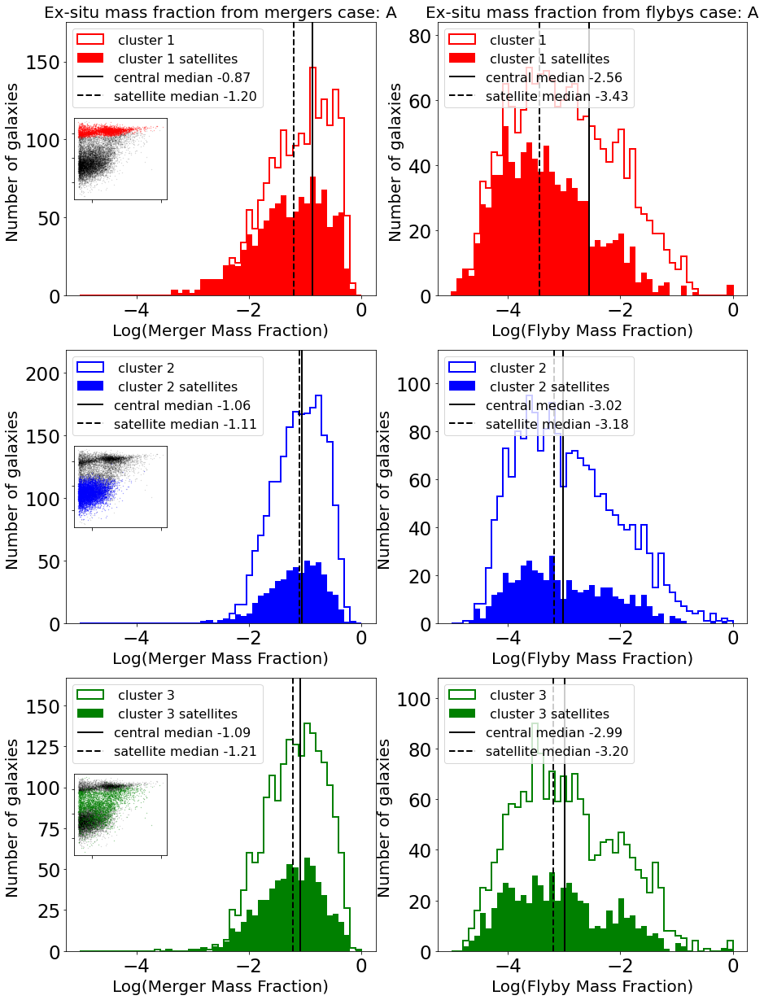

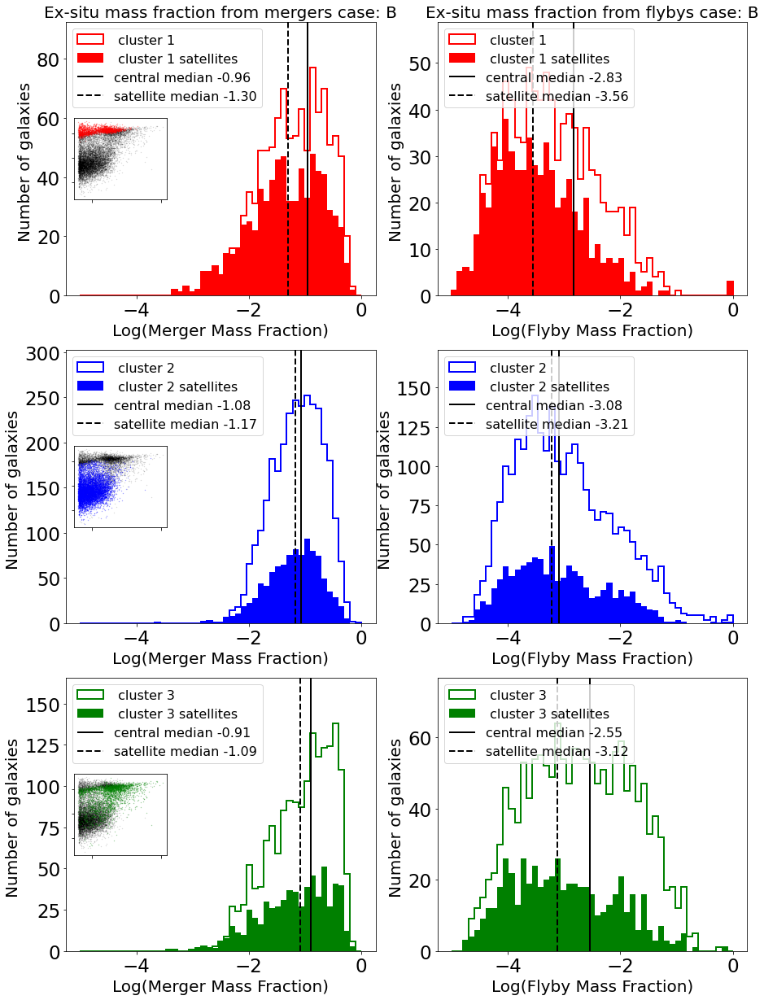

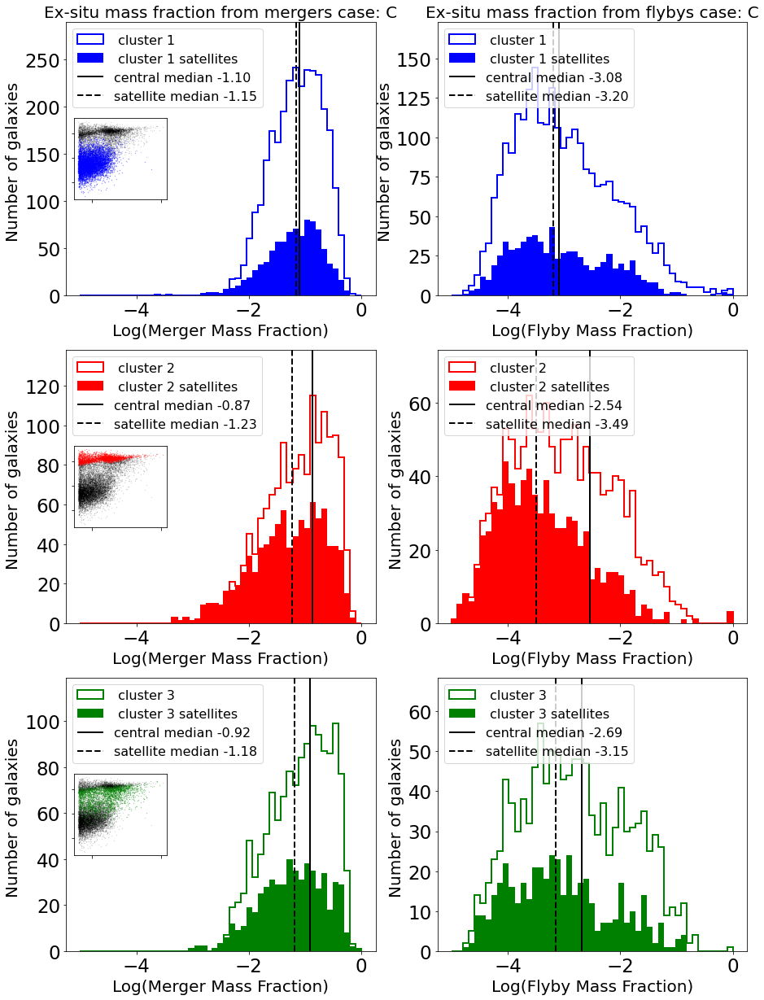

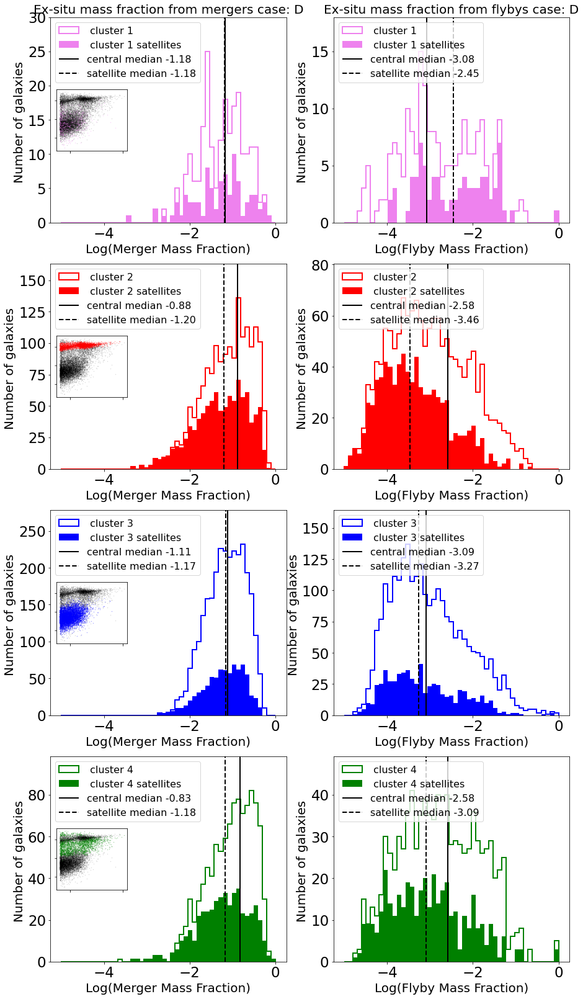

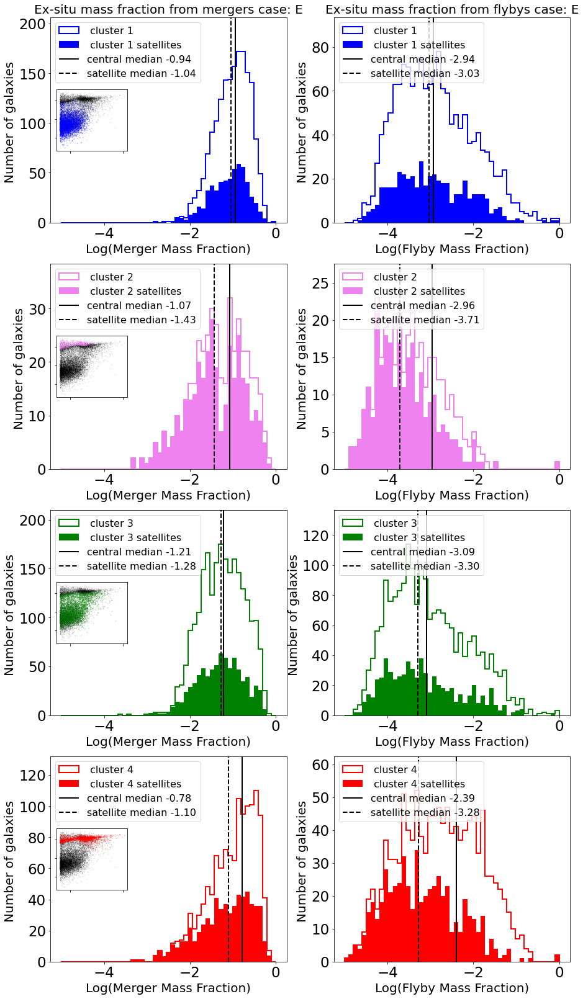

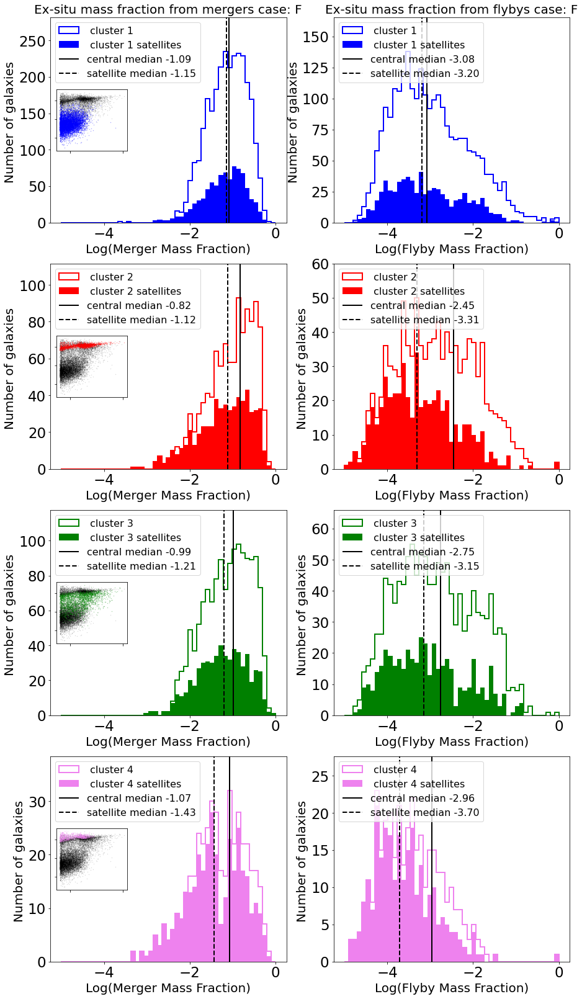

In [241]:
fM_plot_smooth(colour_sample_1_smooth,'A',11,10)
fM_plot_smooth(nmf_sample_smooth,'B',11,10)
fM_plot_smooth(NMF_color_smooth,'C',11,10)
fM_plot_smooth(colour_sample_2_smooth,'D',11,10)
fM_plot_smooth(nmf_sample_4_smooth,'E',11,10)
fM_plot_smooth(NMF_color_4_smooth,'F',11,10)

In [242]:
def MAH_plot_smooth(labels,upper,lower,case):
    mode = case
    if mode =='A' or mode=='def':
        colors=['red','blue','green','purple']
    elif mode =='B':
        colors=['red','blue','green','purple']
    elif mode =='C':
        colors=['blue','red','green','purple']
    elif mode =='D':
        colors=['violet','red','blue','green']
    elif mode =='E':
        colors=['blue','violet','green','red']
    elif mode =='F':
        colors=['blue','red','green','violet']


    fig,ax =plt.subplots(2,1,figsize=(15,20),sharex=True)
    n_CLUST = np.unique(labels).shape[0]
    plt.suptitle('Case '+str(case)+': Mean halo mass assembly histories for $%.2f \\leq logM_{*} \\leq %.2f  $'%(lower,upper),\
                fontsize = 26)
    ax[0].set_title('Centrals',fontsize=24)
    ax[1].set_title('Satellites',fontsize=24)
    for i in range(0,n_CLUST):
        if (Masses[centralMask][(labels[centralMask]==i) &(logMs[centralMask]<upper)&\
                                                (logMs[centralMask]>=lower)].shape[0])<2 & (Masses[centralMask][(labels[centralMask]==i) &(logMs[centralMask]<upper)&\
                                                (logMs[centralMask]>=lower)].shape[0])>0:
            print(i,(Masses[centralMask][(labels[centralMask]==i) &(logMs[centralMask]<upper)&\
                                                (logMs[centralMask]>=lower)].shape[0]))
            ax[0].plot(sfht,1/(0.137999)*np.median(Masses[centralMask][(labels[centralMask]==i) &(logMs[centralMask]<upper)&\
                                                (logMs[centralMask]>=lower)],axis=0),color=colors[i],lw= 3,label='cluster %i median'%(i+1),rasterized=True)
        elif (Masses[centralMask][(labels[centralMask]==i) &(logMs[centralMask]<upper)&\
                                                (logMs[centralMask]>=lower)].shape[0])<0:
            pass
        else:
            ax[0].plot(sfht,1/(0.137999)*np.median(Masses[centralMask][(labels[centralMask]==i) &(logMs[centralMask]<upper)&\
                                                (logMs[centralMask]>=lower)],axis=0),color=colors[i],lw= 3,label='cluster %i median'%(i+1),rasterized=True)
            ax[0].fill_between(sfht,1/(0.137999)*np.percentile(Masses[centralMask][(labels[centralMask]==i)&\
                                                                  (logMs[centralMask]<upper)&\
                                                                  (logMs[centralMask]>=lower)],16,axis=0),\
                1/(0.137999)*np.percentile(Masses[centralMask][(labels[centralMask]==i)&(logMs[centralMask]<upper)&\
                                                  (logMs[centralMask]>=lower)],84,axis=0),alpha=0.2,lw= 3,color=colors[i],rasterized=True)
        if (Masses[satMask][(labels[satMask]==i) &(logMs[satMask]<upper)&\
                                                (logMs[satMask]>=lower)].shape[0])<1:
            pass
        else:
            ax[1].plot(sfht,1/(0.137999)*np.median(Masses[satMask][(labels[satMask]==i) &(logMs[satMask]<upper)&\
                                                (logMs[satMask]>=lower)],axis=0),color=colors[i],lw = 3,label='cluster %i median'%(i+1),rasterized=True)
            ax[1].fill_between(sfht,1/(0.137999)*np.percentile(Masses[satMask][(labels[satMask]==i)&\
                                                              (logMs[satMask]<upper)&(logMs[satMask]>=lower)],\
                                              16,axis=0),\
                1/(0.137999)*np.percentile(Masses[satMask][(labels[satMask]==i)&(logMs[satMask]<upper)&\
                                              (logMs[satMask]>=lower)],84,axis=0),alpha=0.2,lw = 3,color=colors[i],rasterized=True)
    
    ax[0].legend(fontsize =18)
    ax[1].legend(fontsize =18)
    ax[1].set_xlabel('Lookback time [Gyr]',fontsize=20)
    ax[0].set_ylabel('Mass Assembly History [$M_{\\odot}/Gyr$] + 84/16th percentiles',fontsize=20)
    ax[1].set_ylabel('Mass Assembly History [$M_{\\odot}/Gyr$] + 84/16th percentiles',fontsize=20)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig('MAHcaseSMOOTH'+str(case)+'.pdf',dpi=250,format='pdf')

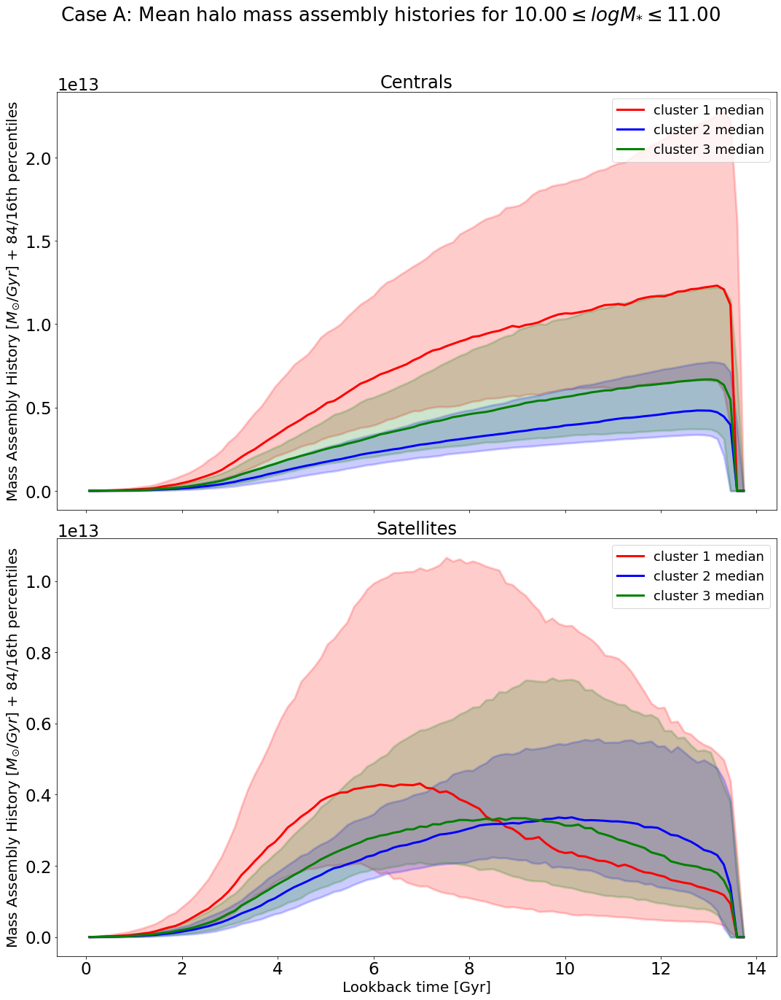

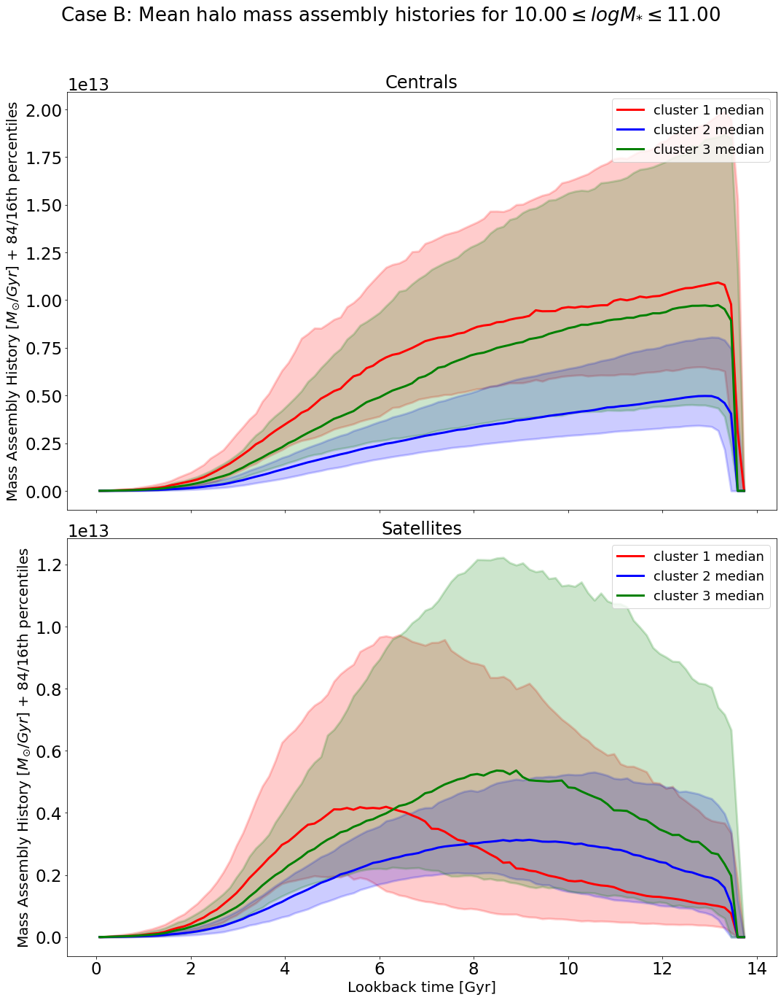

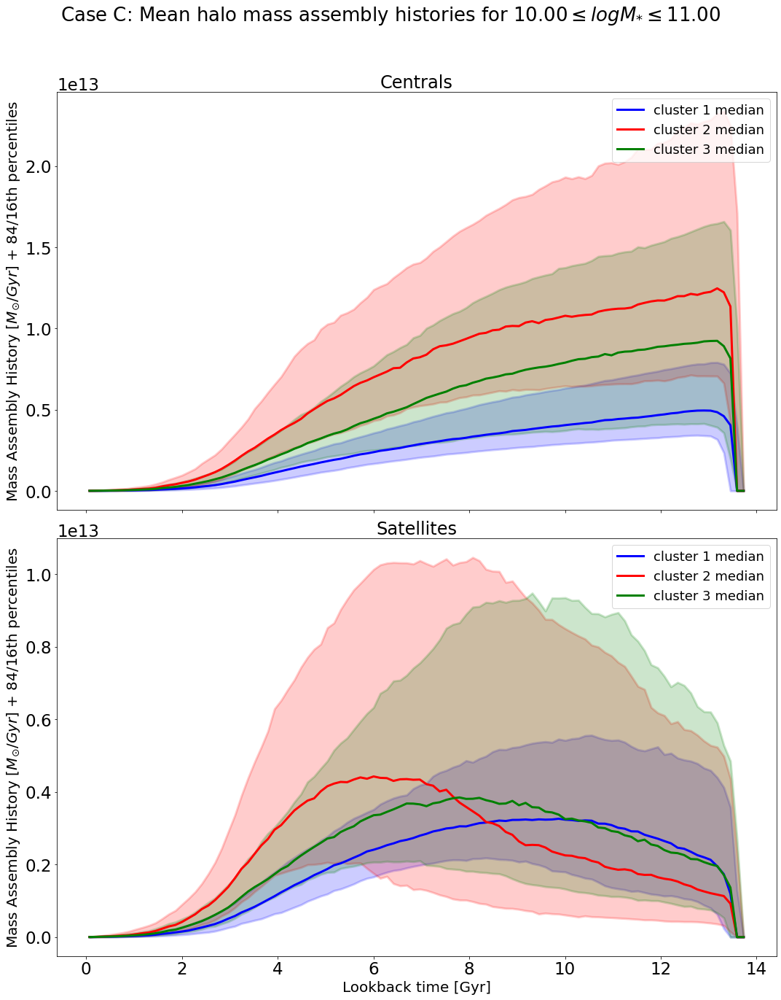

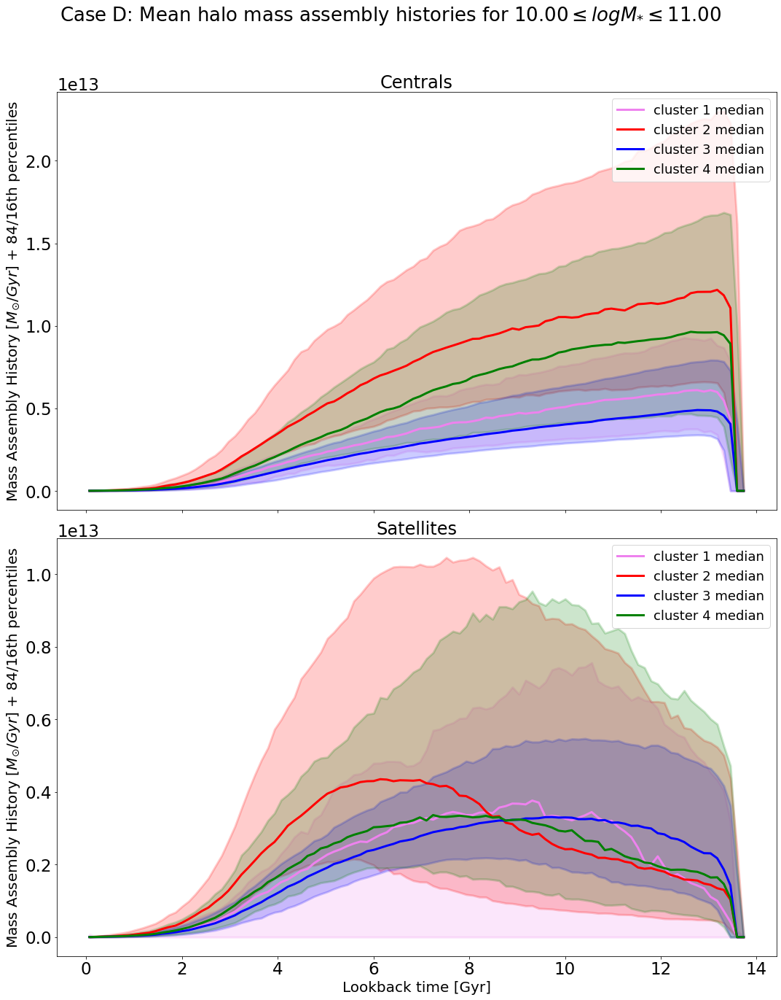

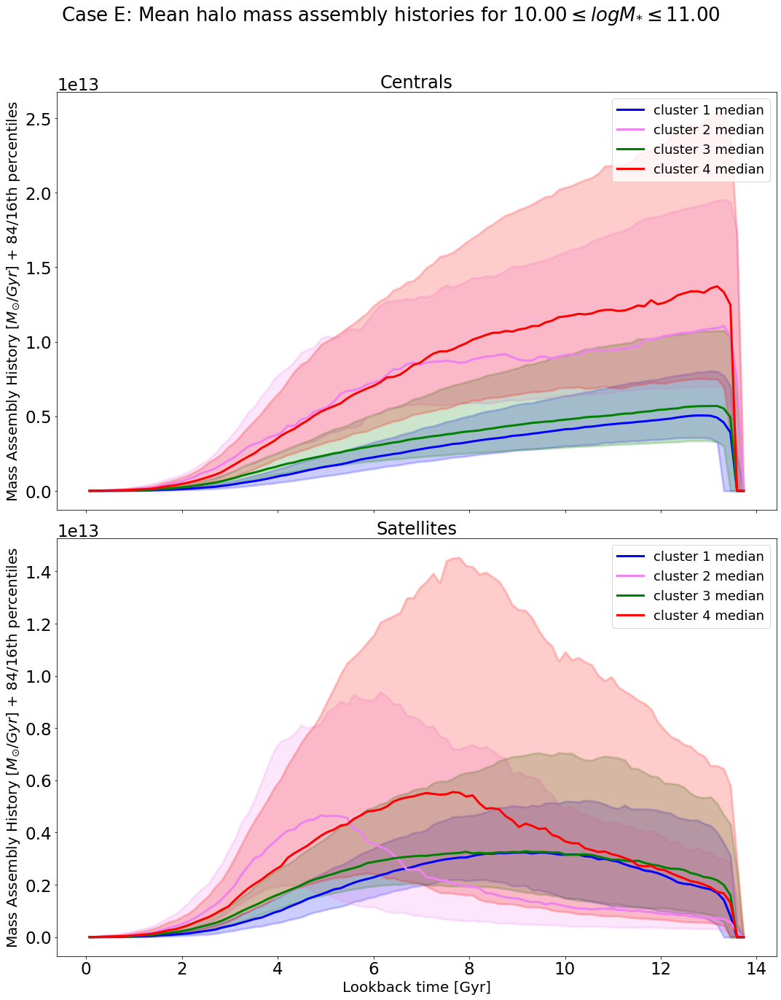

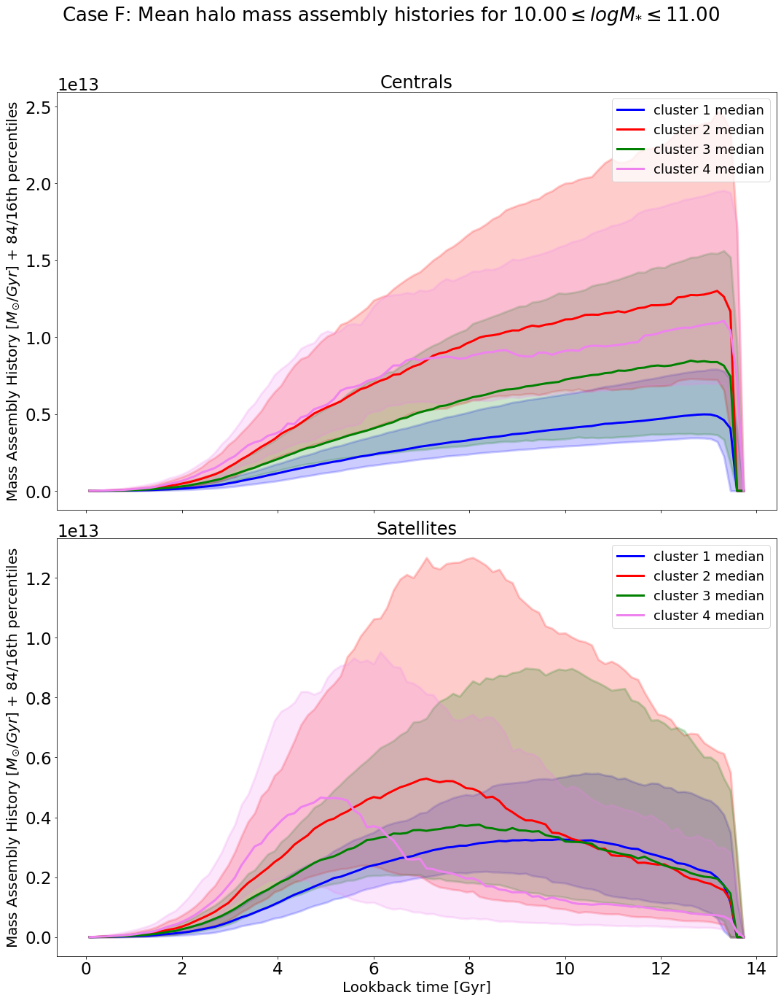

In [243]:
MAH_plot_smooth(colour_sample_1_smooth,11,10,'A')
MAH_plot_smooth(nmf_sample_smooth,11,10,'B')
MAH_plot_smooth(NMF_color_smooth,11,10,'C')
MAH_plot_smooth(colour_sample_2_smooth,11,10,'D')
MAH_plot_smooth(nmf_sample_4_smooth,11,10,'E')
MAH_plot_smooth(NMF_color_4_smooth,11,10,'F')

In [244]:
print('Galaxies in pop 0 for 4 cluster from cluster 0:',logMs[nmf_sample_4_smooth==0][np.in1d(logMs[nmf_sample_4_smooth==0],logMs[nmf_sample_smooth==0])].shape[0]/logMs[nmf_sample_4_smooth==0].shape[0])
print('Galaxies in pop 0 for 4 cluster from cluster 1:',logMs[nmf_sample_4_smooth==0][np.in1d(logMs[nmf_sample_4_smooth==0],logMs[nmf_sample_smooth==1])].shape[0]/logMs[nmf_sample_4_smooth==0].shape[0])
print('Galaxies in pop 0 for 4 cluster from cluster 2:',logMs[nmf_sample_4_smooth==0][np.in1d(logMs[nmf_sample_4_smooth==0],logMs[nmf_sample_smooth==2])].shape[0]/logMs[nmf_sample_4_smooth==0].shape[0])

Galaxies in pop 0 for 4 cluster from cluster 0: 0.0005875440658049354
Galaxies in pop 0 for 4 cluster from cluster 1: 0.9939287113200157
Galaxies in pop 0 for 4 cluster from cluster 2: 0.007246376811594203


In [245]:
print('Galaxies in pop 1 for 4 cluster from cluster 0:',logMs[nmf_sample_4_smooth==1][np.in1d(logMs[nmf_sample_4_smooth==1],logMs[nmf_sample_smooth==0])].shape[0]/logMs[nmf_sample_4_smooth==1].shape[0])
print('Galaxies in pop 1 for 4 cluster from cluster 1:',logMs[nmf_sample_4_smooth==1][np.in1d(logMs[nmf_sample_4_smooth==1],logMs[nmf_sample_smooth==1])].shape[0]/logMs[nmf_sample_4_smooth==1].shape[0])
print('Galaxies in pop 1 for 4 cluster from cluster 2:',logMs[nmf_sample_4_smooth==1][np.in1d(logMs[nmf_sample_4_smooth==1],logMs[nmf_sample_smooth==2])].shape[0]/logMs[nmf_sample_4_smooth==1].shape[0])

Galaxies in pop 1 for 4 cluster from cluster 0: 0.9912170639899623
Galaxies in pop 1 for 4 cluster from cluster 1: 0.0037641154328732747
Galaxies in pop 1 for 4 cluster from cluster 2: 0.011292346298619825


In [246]:
print('Galaxies in pop 2 for 4 cluster from cluster 0:',logMs[nmf_sample_4_smooth==2][np.in1d(logMs[nmf_sample_4_smooth==2],logMs[nmf_sample_smooth==0])].shape[0]/logMs[nmf_sample_4_smooth==2].shape[0])
print('Galaxies in pop 2 for 4 cluster from cluster 1:',logMs[nmf_sample_4_smooth==2][np.in1d(logMs[nmf_sample_4_smooth==2],logMs[nmf_sample_smooth==1])].shape[0]/logMs[nmf_sample_4_smooth==2].shape[0])
print('Galaxies in pop 2 for 4 cluster from cluster 2:',logMs[nmf_sample_4_smooth==2][np.in1d(logMs[nmf_sample_4_smooth==2],logMs[nmf_sample_smooth==2])].shape[0]/logMs[nmf_sample_4_smooth==2].shape[0])

Galaxies in pop 2 for 4 cluster from cluster 0: 0.0008952551477170994
Galaxies in pop 2 for 4 cluster from cluster 1: 0.6329453894359892
Galaxies in pop 2 for 4 cluster from cluster 2: 0.36884512085944493


In [247]:
print('Galaxies in pop 3 for 4 cluster from cluster 0:',logMs[nmf_sample_4_smooth==3][np.in1d(logMs[nmf_sample_4_smooth==3],logMs[nmf_sample_smooth==0])].shape[0]/logMs[nmf_sample_4_smooth==3].shape[0])
print('Galaxies in pop 3 for 4 cluster from cluster 1:',logMs[nmf_sample_4_smooth==3][np.in1d(logMs[nmf_sample_4_smooth==3],logMs[nmf_sample_smooth==1])].shape[0]/logMs[nmf_sample_4_smooth==3].shape[0])
print('Galaxies in pop 3 for 4 cluster from cluster 2:',logMs[nmf_sample_4_smooth==3][np.in1d(logMs[nmf_sample_4_smooth==3],logMs[nmf_sample_smooth==2])].shape[0]/logMs[nmf_sample_4_smooth==3].shape[0])

Galaxies in pop 3 for 4 cluster from cluster 0: 0.4926062846580407
Galaxies in pop 3 for 4 cluster from cluster 1: 0.0009242144177449168
Galaxies in pop 3 for 4 cluster from cluster 2: 0.5092421441774492


In [248]:
source_of_n1cluster(nmf_sample_4,nmf_sample)


------------------------------------------------------------------------
% Galaxies in pop 1 for 4 cluster from cluster 1: 0.00041631973355537054
% Galaxies in pop 1 for 4 cluster from cluster 2: 1.0
% Galaxies in pop 1 for 4 cluster from cluster 3: 0.0
------------------------------------------------------------------------
% Galaxies in pop 2 for 4 cluster from cluster 1: 0.9939759036144579
% Galaxies in pop 2 for 4 cluster from cluster 2: 0.0030120481927710845
% Galaxies in pop 2 for 4 cluster from cluster 3: 0.007228915662650603
------------------------------------------------------------------------
% Galaxies in pop 3 for 4 cluster from cluster 1: 0.0045662100456621
% Galaxies in pop 3 for 4 cluster from cluster 2: 0.0
% Galaxies in pop 3 for 4 cluster from cluster 3: 0.9965753424657534
------------------------------------------------------------------------
% Galaxies in pop 4 for 4 cluster from cluster 1: 0.05800214822771214
% Galaxies in pop 4 for 4 cluster from cluster 2: 0.5

[0.00041631973355537054,
 1.0,
 0.0,
 0.9939759036144579,
 0.0030120481927710845,
 0.007228915662650603,
 0.0045662100456621,
 0.0,
 0.9965753424657534,
 0.05800214822771214,
 0.5338345864661654,
 0.40995345506623704]

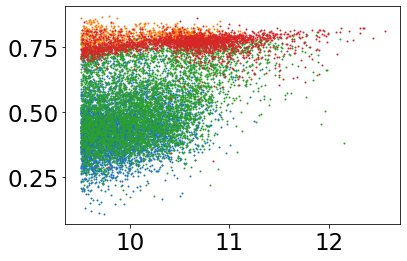

In [249]:
plt.scatter(logMs[nmf_sample_4_smooth ==0],(G-R)[nmf_sample_4_smooth==0],s=1)
plt.scatter(logMs[nmf_sample_4_smooth ==1],(G-R)[nmf_sample_4_smooth==1],s=1)
plt.scatter(logMs[nmf_sample_4_smooth ==2],(G-R)[nmf_sample_4_smooth==2],s=1)
plt.scatter(logMs[nmf_sample_4_smooth ==3],(G-R)[nmf_sample_4_smooth==3],s=1)


In [250]:
source_of_n1cluster(nmf_sample_4_smooth,nmf_sample_smooth)


------------------------------------------------------------------------
% Galaxies in pop 1 for 4 cluster from cluster 1: 0.0005875440658049354
% Galaxies in pop 1 for 4 cluster from cluster 2: 0.9939287113200157
% Galaxies in pop 1 for 4 cluster from cluster 3: 0.007246376811594203
------------------------------------------------------------------------
% Galaxies in pop 2 for 4 cluster from cluster 1: 0.9912170639899623
% Galaxies in pop 2 for 4 cluster from cluster 2: 0.0037641154328732747
% Galaxies in pop 2 for 4 cluster from cluster 3: 0.011292346298619825
------------------------------------------------------------------------
% Galaxies in pop 3 for 4 cluster from cluster 1: 0.0008952551477170994
% Galaxies in pop 3 for 4 cluster from cluster 2: 0.6329453894359892
% Galaxies in pop 3 for 4 cluster from cluster 3: 0.36884512085944493
------------------------------------------------------------------------
% Galaxies in pop 4 for 4 cluster from cluster 1: 0.4926062846580407
% Ga

[0.0005875440658049354,
 0.9939287113200157,
 0.007246376811594203,
 0.9912170639899623,
 0.0037641154328732747,
 0.011292346298619825,
 0.0008952551477170994,
 0.6329453894359892,
 0.36884512085944493,
 0.4926062846580407,
 0.0009242144177449168,
 0.5092421441774492]

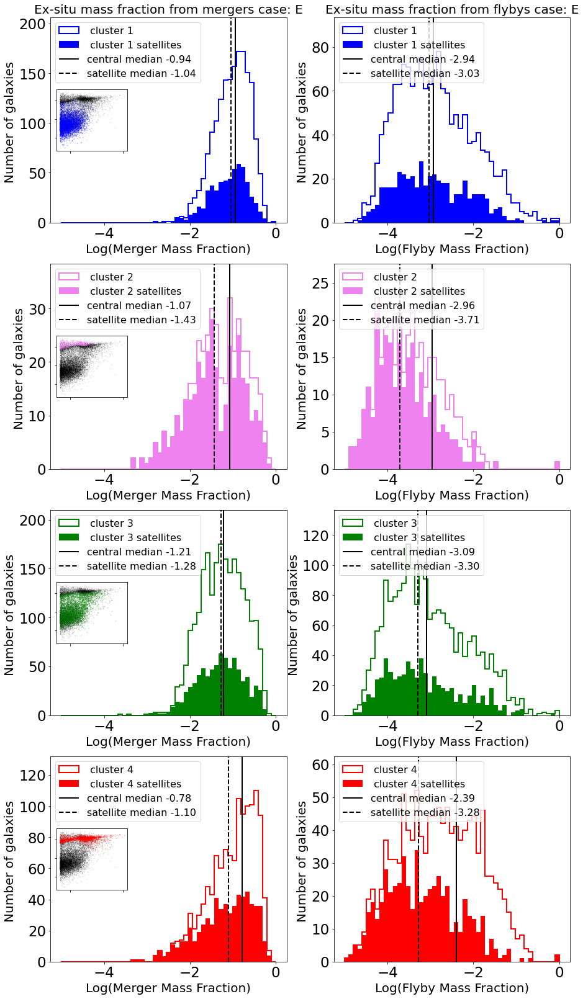

In [251]:
fM_plot_smooth(nmf_sample_4_smooth,'E',11,10)

In [252]:
help(source_of_n1cluster)

Help on function source_of_n1cluster in module __main__:

source_of_n1cluster(labels_n1, labels_n)



In [253]:
overlapsAD = source_of_n1cluster(colour_sample_1_smooth,colour_sample_2_smooth)


------------------------------------------------------------------------
% Galaxies in pop 1 for 4 cluster from cluster 1: 0.00032351989647363315
% Galaxies in pop 1 for 4 cluster from cluster 2: 0.880944678097703
% Galaxies in pop 1 for 4 cluster from cluster 3: 0.0016175994823681655
% Galaxies in pop 1 for 4 cluster from cluster 4: 0.12099644128113879
------------------------------------------------------------------------
% Galaxies in pop 2 for 4 cluster from cluster 1: 0.01495691757437815
% Galaxies in pop 2 for 4 cluster from cluster 2: 0.0006503007641033978
% Galaxies in pop 2 for 4 cluster from cluster 3: 0.959031051861486
% Galaxies in pop 2 for 4 cluster from cluster 4: 0.02747520728336856
------------------------------------------------------------------------
% Galaxies in pop 3 for 4 cluster from cluster 1: 0.14029760097175828
% Galaxies in pop 3 for 4 cluster from cluster 2: 0.013058001822046765
% Galaxies in pop 3 for 4 cluster from cluster 3: 0.33707865168539325
% Galax

In [254]:
overlap_dataAD = overlapsAD
pairwise_idx = ['pop 1/4 cluster from cluster 1',\
                'pop 1/4 cluster from cluster 2',\
                'pop 1/4 cluster from cluster 3',\
                'pop 2/4 cluster from cluster 1',\
                'pop 2/4 cluster from cluster 2',\
                'pop 2/4 cluster from cluster 3',\
                'pop 3/4 cluster from cluster 1',\
                'pop 3/4 cluster from cluster 2',\
                'pop 3/4 cluster from cluster 3',\
                'pop 4/4 cluster from cluster 1',\
                'pop 4/4 cluster from cluster 2',\
                'pop 4/4 cluster from cluster 3']
overlap_dAD = {'Overlap fraction': overlap_dataAD}
overlap_dfAD = pd.DataFrame(data = overlap_dAD, index = pairwise_idx)

In [255]:
overlap_dfAD.to_excel("OverlapAD.xlsx",\
             sheet_name='ProjectTable') 

In [256]:
overlapsBE = source_of_n1cluster(nmf_sample_4_smooth,nmf_sample_smooth)


------------------------------------------------------------------------
% Galaxies in pop 1 for 4 cluster from cluster 1: 0.0005875440658049354
% Galaxies in pop 1 for 4 cluster from cluster 2: 0.9939287113200157
% Galaxies in pop 1 for 4 cluster from cluster 3: 0.007246376811594203
------------------------------------------------------------------------
% Galaxies in pop 2 for 4 cluster from cluster 1: 0.9912170639899623
% Galaxies in pop 2 for 4 cluster from cluster 2: 0.0037641154328732747
% Galaxies in pop 2 for 4 cluster from cluster 3: 0.011292346298619825
------------------------------------------------------------------------
% Galaxies in pop 3 for 4 cluster from cluster 1: 0.0008952551477170994
% Galaxies in pop 3 for 4 cluster from cluster 2: 0.6329453894359892
% Galaxies in pop 3 for 4 cluster from cluster 3: 0.36884512085944493
------------------------------------------------------------------------
% Galaxies in pop 4 for 4 cluster from cluster 1: 0.4926062846580407
% Ga

In [257]:
overlap_dataBE = overlapsBE
pairwise_idx = ['pop 1/4 cluster from cluster 1',\
                'pop 1/4 cluster from cluster 2',\
                'pop 1/4 cluster from cluster 3',\
                'pop 2/4 cluster from cluster 1',\
                'pop 2/4 cluster from cluster 2',\
                'pop 2/4 cluster from cluster 3',\
                'pop 3/4 cluster from cluster 1',\
                'pop 3/4 cluster from cluster 2',\
                'pop 3/4 cluster from cluster 3',\
                'pop 4/4 cluster from cluster 1',\
                'pop 4/4 cluster from cluster 2',\
                'pop 4/4 cluster from cluster 3']
overlap_dBE = {'Overlap fraction': overlap_dataBE}
overlap_dfBE = pd.DataFrame(data = overlap_dBE, index = pairwise_idx)

In [258]:
overlap_dfBE

,Overlap fraction
pop 1/4 cluster from cluster 1,0.000588
pop 1/4 cluster from cluster 2,0.993929
pop 1/4 cluster from cluster 3,0.007246
pop 2/4 cluster from cluster 1,0.991217
pop 2/4 cluster from cluster 2,0.003764
pop 2/4 cluster from cluster 3,0.011292
pop 3/4 cluster from cluster 1,0.000895
pop 3/4 cluster from cluster 2,0.632945
pop 3/4 cluster from cluster 3,0.368845
pop 4/4 cluster from cluster 1,0.492606


In [259]:
integratedSFH = np.sum(smooth_sfh,axis =1)
integratedSFH.shape

intNORMSFH = np.zeros((12535,100))
for i in range(12535):
    intNORMSFH[i,:] = smooth_sfh[i]/integratedSFH[i]

(10028, 100)
(7521, 100)
2130
(7521, 100)


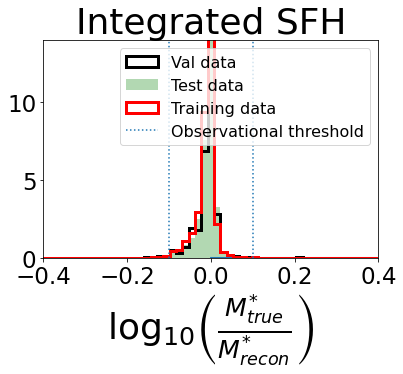

In [260]:
def mass_comp(X_test,X_recon):#,scaler):
    m_true = np.zeros(X_test.shape[0])
    m_recon = np.zeros(X_recon.shape[0])
    #for i in range(X_test.shape[0]):
    m_true = np.sum(X_test,axis = 1)#np.sum(scaler.inverse_transform(X_test),axis = 1)
    m_recon = np.sum(X_recon,axis = 1)#np.sum(scaler.inverse_transform(X_recon),axis = 1)
    
    return m_true,m_recon
from textwrap import wrap
#wrapped = ['Validation data','Test data','Training data']
wrapped='Observational threshold'#: %i/%i validation galaxies exceed'%(\
       #                                                                         np.shape(np.log10(mtv/mrv)[abs(np.log10(mtv/mrv))>0.1])[0],(mtv.shape[0]))
#wrapped

comps = 4
from sklearn.decomposition import NMF
from sklearn.preprocessing import normalize,MinMaxScaler,RobustScaler,StandardScaler,MaxAbsScaler
model = NMF(n_components= comps, init='random', random_state=0)
new_scaler = MinMaxScaler()

X = sklearn.preprocessing.normalize(np.vstack((smooth_sfh)),axis=1,norm='max')#intNORMSFH #new_scaler.fit_transform(np.vstack((smooth_sfh)))
#Xrough = new_scaler.transform(np.vstack((sfh)))
plt.plot(X[0])

# train -test - validation split
X_train, X_test = train_test_split(X, test_size=0.2, random_state=1)
print(np.shape(X_train))

X_train, X_val  = train_test_split(X_train,test_size=0.25, random_state=1)

print(np.shape(X_train))

#NMF decomposition
W = model.fit_transform(X_train) # build model with training data / populate weight arrays
H = model.components_ # load its components
Wf = model.fit_transform(X)
WT = model.transform(X_test) # transformed test data


Xtrecon = model.inverse_transform(W) # Reconstructing the SFH from training data
Xrecon = model.inverse_transform(Wf)

Xtestrecon= model.inverse_transform(WT)
# Building a model: nomralize and fit SFH

idx = np.random.randint(0,np.size(X_train[:,0]))
print(idx)
print(np.shape(X_train))


mt,mr = mass_comp(X_test,Xtestrecon)#,new_scaler)
mtt,mrt = mass_comp(X_train,Xtrecon)#,new_scaler)
mtv,mrv = mass_comp(X_val,model.inverse_transform(model.transform(X_val)))#,new_scaler)
plt.figure(1,figsize =(16,12))
plt.title('Integrated SFH',fontsize =36)
plt.xlabel('$\\log_{10}\\left(\\frac{M^{*}_{true}}{M^{*}_{recon}}\\right)$',fontsize= 36)
plt.hist(np.log10(mtv/mrv),bins = np.linspace(-0.75,0.75,100),density=True,histtype='step',color='black',label = 'Val data',linewidth = 3)
plt.hist(np.log10(mt/mr),bins = np.linspace(-0.75,0.75,100),density=True,color='green',label = 'Test data',alpha =0.3)
plt.hist(np.log10(mtt/mrt),bins = np.linspace(-0.75,0.75,100),histtype='step',color='red',density=True,label = 'Training data',linewidth = 3)
plt.vlines(x =0.1,ymin=0,ymax= 15,linestyle ='dotted',label=wrapped)
plt.vlines(x =-0.1,ymin=0,ymax= 15,linestyle ='dotted')
leg = plt.legend(fontsize= 16)
plt.xlim(-0.4,0.4)
plt.ylim(0,14)
plt.savefig("integrated.png")


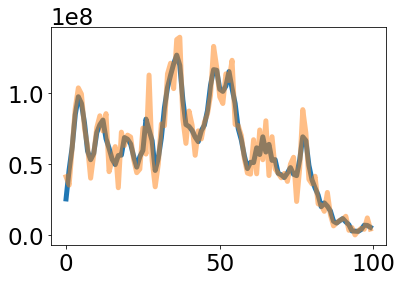

In [261]:
plt.plot(smooth_sfh[12000],lw=5)
plt.plot(sfh[12000],lw=5,alpha =0.5)

(10028, 100)
(7521, 100)
2948
(7521, 100)


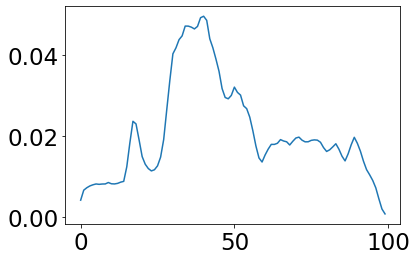

In [271]:
comps = 4
from sklearn.decomposition import NMF
from sklearn.preprocessing import normalize,MinMaxScaler,RobustScaler,StandardScaler,MaxAbsScaler
modelZ = NMF(n_components= comps, init='random', random_state=0)
XZ = (np.vstack((smooth_zh)))
XZrough = (np.vstack((zh)))
plt.plot(XZ[0])

# train -test - validation split
XZ_train, XZ_test = train_test_split(XZ, test_size=0.2, random_state=1)
print(np.shape(XZ_train))

XZ_train, XZ_val  = train_test_split(XZ_train,test_size=0.25, random_state=1)

print(np.shape(XZ_train))

#NMF decomposition
WZ = modelZ.fit_transform(XZ_train) # build model with training data / populate weight arrays
HZ = modelZ.components_ # load its components
WfZ = modelZ.transform(XZ)
WTZ = modelZ.transform(XZ_test) # transformed test data


XZtrecon = modelZ.inverse_transform(WZ) # Reconstructing the SFH from training data
XZrecon = modelZ.inverse_transform(WfZ)

XZtestrecon= modelZ.inverse_transform(WTZ)
# Building a model: nomralize and fit SFH

idxZ = np.random.randint(0,np.size(XZ_train[:,0]))
print(idxZ)
print(np.shape(XZ_train))




sampling galaxy:  2794
sampling galaxy:  3118
sampling galaxy:  2518


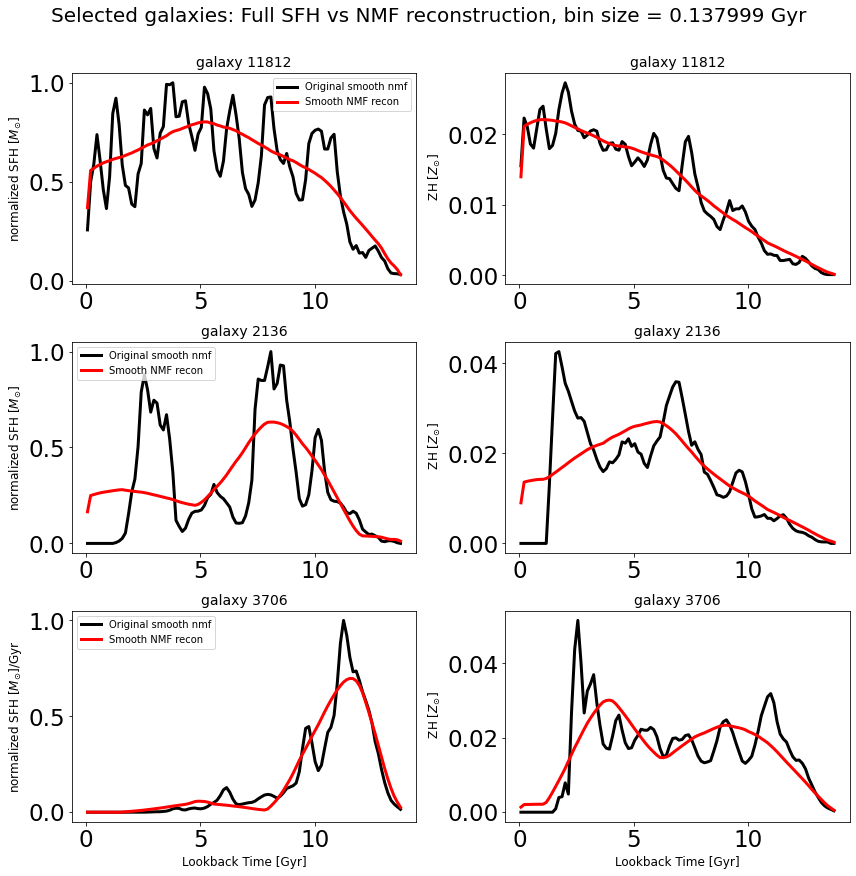

In [272]:
figs,axs = plt.subplots(3,2,figsize =(12,12))
plt.suptitle('Selected galaxies: Full SFH vs NMF reconstruction, bin size = %f Gyr'%(sfht[1]-sfht[0]),x = 0.5,y = 1.01, fontsize = 20)
IDs = np.arange(0,12535)
indx=np.random.choice(IDs,3,replace =False)
for i in range(0,3):
    
    idx = np.random.randint(0,np.size(X_train[:,0]))


    print('sampling galaxy: ', idx)

    axIDX_0 = i
    axIDX_1 = 0

    plt.axes(axs[axIDX_0,axIDX_1])
    #print(np.shape(X_train),np.shape(sfht))
    idx = indx[i]
    axs[i,0].set_title('galaxy %i'%(idx),fontsize = 14)
    axs[i,1].set_title('galaxy %i'%(idx),fontsize = 14)
    #plt.yscale('log')

    plt.plot(sfht,X[idx],color='black',label = 'Original smooth nmf', lw =3)
    plt.plot(sfht,Xrecon[idx],color = 'red',label = 'Smooth NMF recon', lw =3)
    
    

    axs[i,1].plot(sfht,XZ[idx],color='black',label = 'Original smooth nmf', lw =3)
    axs[i,1].plot(sfht,XZrecon[idx],color = 'red',label = 'Smooth NMF recon', lw =3)
    #plt.plot(sfht,Xtrecon[idx],color = 'red',label = 'NMF Reconstruction' )
    axs[i,0].set_ylabel('normalized SFH [$M_{\odot}$]',fontsize =12)
    axs[i,1].set_ylabel(' ZH [$Z_{\odot}$]',fontsize =12)
    plt.legend()
    plt.tight_layout()



plt.ylabel('normalized SFH [$M_{\odot}$]/Gyr',fontsize =12)
axs[-1,0].set_xlabel('Lookback Time [Gyr]',fontsize =12)

axs[-1,1].set_xlabel('Lookback Time [Gyr]',fontsize =12)

plt.tight_layout()


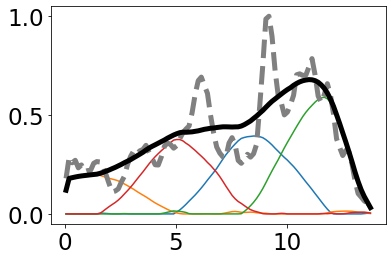

In [273]:
plt.plot(sfht,H[0,:]*Wf[11788,0])
plt.plot(sfht,H[1,:]*Wf[11788,1])
plt.plot(sfht,H[2,:]*Wf[11788,2])
plt.plot(sfht,H[3,:]*Wf[11788,3])
plt.plot(sfht,X[11788],color='grey',linestyle='dashed',lw=5)
plt.plot(sfht,Xrecon[11788],color='black',lw=5)


(10028, 100)
(7521, 100)


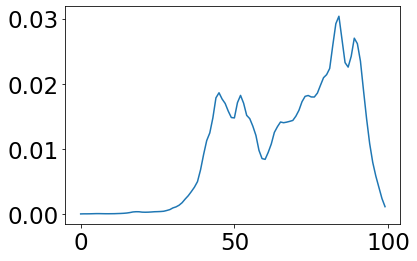

In [274]:

comps = 4
from sklearn.decomposition import NMF
from sklearn.preprocessing import normalize,MinMaxScaler,RobustScaler,StandardScaler,MaxAbsScaler
model2 = NMF(n_components= comps, init='random', random_state=0)
new_scaler = MinMaxScaler()

X = intNORMSFH #new_scaler.fit_transform(np.vstack((smooth_sfh)))
#Xrough = new_scaler.transform(np.vstack((sfh)))
plt.plot(X[0])

# train -test - validation split
X_train, X_test = train_test_split(X, test_size=0.2, random_state=1)
print(np.shape(X_train))

X_train, X_val  = train_test_split(X_train,test_size=0.25, random_state=1)

print(np.shape(X_train))

#NMF decomposition
W = model2.fit_transform(X_train) # build model with training data / populate weight arrays
H2 = model2.components_ # load its components
Wf = model2.fit_transform(X)
WT = model2.transform(X_test) # transformed test data


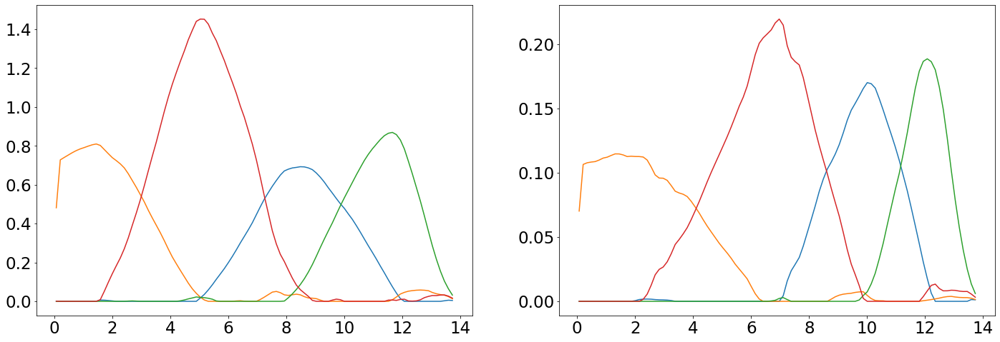

In [275]:
f,ax = plt.subplots(1,2,figsize=(24,8))
ax[0].plot(sfht,H[0,:])
ax[0].plot(sfht,H[1,:])
ax[0].plot(sfht,H[2,:])
ax[0].plot(sfht,H[3,:])

ax[1].plot(sfht,H2[0,:])
ax[1].plot(sfht,H2[1,:])
ax[1].plot(sfht,H2[2,:])
ax[1].plot(sfht,H2[3,:])


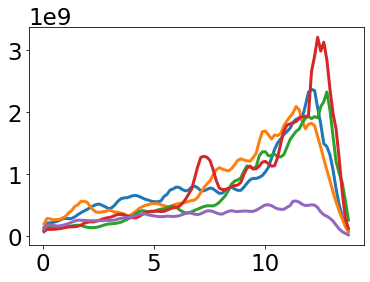

In [276]:
for i in range(5):
    IDs = np.arange(0,12535)
    indx=np.random.choice(IDs,50,replace =False)
    plt.plot(sfht,np.mean(smooth_sfh[indx],axis=0),lw=3)

sampling galaxy:  2355
sampling galaxy:  2093
sampling galaxy:  7127
sampling galaxy:  2551
sampling galaxy:  1609
sampling galaxy:  3887
sampling galaxy:  2598
sampling galaxy:  5538
sampling galaxy:  1725
sampling galaxy:  3993


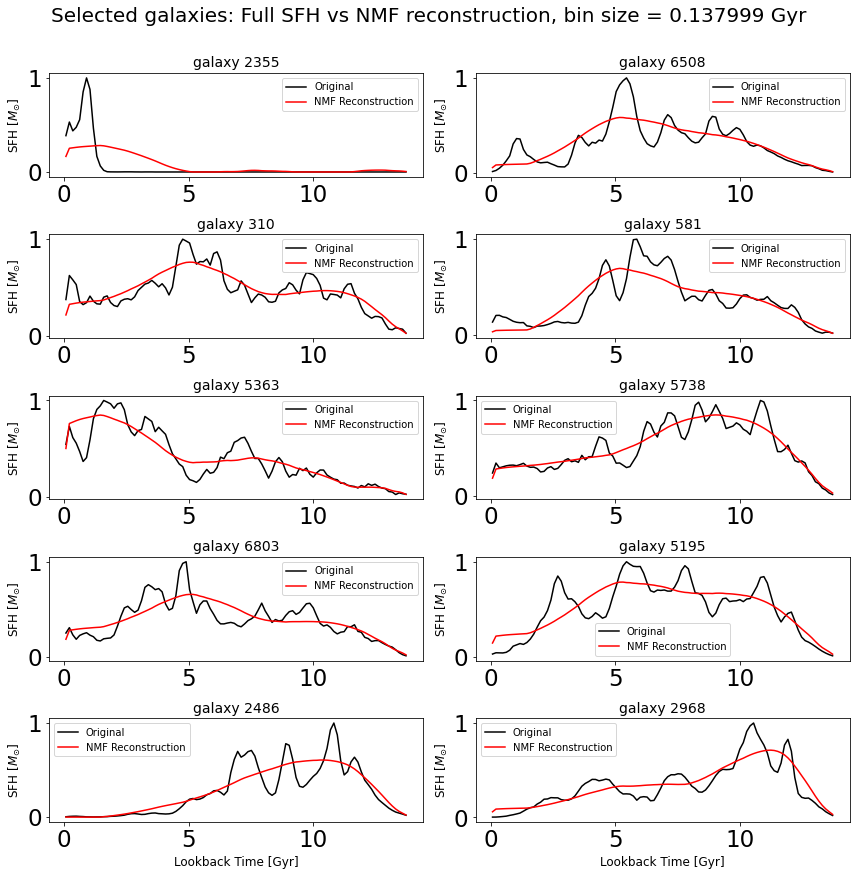

In [268]:
figs,axs = plt.subplots(5,2,figsize =(12,12))
plt.suptitle('Selected galaxies: Full SFH vs NMF reconstruction, bin size = %f Gyr'%(sfht[1]-sfht[0]),x = 0.5,y = 1.01, fontsize = 20)
indx=np.array([2355,310,5363,6803,2486,6508,581,5738,5195,2968],dtype =int)
for i in range(0,10):
    
    idx = np.random.randint(0,np.size(X_train[:,0]))
    if i == 0:
        idx = 2355

    print('sampling galaxy: ', idx)
    if i < 5:
        axIDX_0 = i
        axIDX_1 = 0
    else:
        axIDX_0 = i-5
        axIDX_1 = 1
    plt.axes(axs[axIDX_0,axIDX_1])
    #print(np.shape(X_train),np.shape(sfht))
    idx = indx[i]
    plt.title('galaxy %i'%(idx),fontsize = 14)
    #plt.yscale('log')
    plt.plot(sfht,X_trains[idx],color = 'black',label = 'Original')
    plt.plot(sfht,Xtrecon[idx],color = 'red',label = 'NMF Reconstruction' )
    plt.ylabel('SFH [$M_{\odot}$]',fontsize =12)
    plt.legend()
    plt.tight_layout()


plt.axes(axs[4,0])
plt.ylabel('SFH [$M_{\odot}$]',fontsize =12)
plt.xlabel('Lookback Time [Gyr]',fontsize =12)
plt.axes(axs[4,1])
plt.xlabel('Lookback Time [Gyr]',fontsize =12)

plt.tight_layout()

In [ ]:
overlap_dfBE.to_excel("OverlapBE.xlsx",
             sheet_name='ProjectTable') 

In [ ]:
overlapsCF = source_of_n1cluster(NMF_color_4_smooth,NMF_color_smooth)


In [ ]:
overlap_dataCF = overlapsCF
pairwise_idx = ['pop 1/4 cluster from cluster 1',\
                'pop 1/4 cluster from cluster 2',\
                'pop 1/4 cluster from cluster 3',\
                'pop 2/4 cluster from cluster 1',\
                'pop 2/4 cluster from cluster 2',\
                'pop 2/4 cluster from cluster 3',\
                'pop 3/4 cluster from cluster 1',\
                'pop 3/4 cluster from cluster 2',\
                'pop 3/4 cluster from cluster 3',\
                'pop 4/4 cluster from cluster 1',\
                'pop 4/4 cluster from cluster 2',\
                'pop 4/4 cluster from cluster 3']
overlap_dCF = {'Overlap fraction': overlap_dataCF}
overlap_dfCF = pd.DataFrame(data = overlap_dCF, index = pairwise_idx)

In [ ]:
overlap_dfCF.to_excel("OverlapCF.xlsx",
             sheet_name='ProjectTable') 

In [ ]:
plot_MWAGE(MWage,nmf_sample_smooth,11,10)

In [ ]:
plot_MWAGE(MWage,nmf_sample,11,10)

In [ ]:
np.in1d(logMs[nmf_sample_4_smooth==2],logMs[nmf_sample_4==0])

In [ ]:
np.in1d(logMs[nmf_sample_4_smooth==3],logMs[nmf_sample_smooth==2])].shape[0]/logMs[nmf_sample_4_smooth==3].shape[0])